In [7]:
import trafpy.generator as tpg
from trafpy.benchmarker import BenchmarkImporter

from pathlib import Path
import time
import numpy as np
import random

from trafpy import utils


# ============================================================
# NETWORK SETUP
# ============================================================

num_eps = 8
num_racks = 2

racks_dict = {}

eps_per_rack = int(num_eps / num_racks)

for rack in range(num_racks):
    racks_dict[rack] = [
        ep
        for ep in range(
            rack * eps_per_rack,
            (rack * eps_per_rack) + eps_per_rack
        )
    ]

print("racks_dict:", racks_dict)


# 100 Mbps -> Bytes/sec
ep_capacity = 100000000 / 8

net = tpg.gen_arbitrary_network(
    num_eps=num_eps,
    ep_capacity=ep_capacity,
    racks_dict=racks_dict
)


# ============================================================
# NETWORK INFO
# ============================================================

print("\n--- NETWORK INFO ---")
print("topology_type:", net.graph['topology_type'])
print("max_nw_capacity:", net.graph['max_nw_capacity'])
print("ep_link_capacity:", net.graph['ep_link_capacity'])
print("endpoints:", net.graph['endpoints'])
print("rack_to_ep_dict:", net.graph['rack_to_ep_dict'])


# ============================================================
# BENCHMARK SETUP
# ============================================================

importer = BenchmarkImporter(
    benchmark_version='v001',
    load_prev_dists=False
)

benchmark_names = [
    'private_enterprise',
    'social_media_cloud',
    'commercial_cloud',
    'university'
]


# ============================================================
# OUTPUT DIRECTORY
# ============================================================

path_to_data = Path("8_hosts_v10(prob1)")
path_to_data.mkdir(exist_ok=True, parents=True)


# ============================================================
# PARAMETERS
# ============================================================

jsd_threshold = 0.9

loads = [
    i / 10
    for i in range(1, 10)
]


# ============================================================
# STORE GENERATED DEMANDS
#
# demands[benchmark][load] = TrafPy Demand object
# ============================================================

demands = {
    benchmark: {}
    for benchmark in benchmark_names
}


# ============================================================
# GENERATION
# ============================================================

for benchmark_name in benchmark_names:

    print("\n")
    print("=" * 80)
    print(f"BENCHMARK: {benchmark_name}")
    print("=" * 80)

    # --------------------------------------------------------
    # Load benchmark distributions
    # --------------------------------------------------------

    dists = importer.get_benchmark_dists(
        benchmark_name=benchmark_name,
        eps=net.graph['endpoints'],
        racks_dict=net.graph['rack_to_ep_dict']
    )

    print(
        "Loaded distributions:",
        list(dists.keys())
    )

    # --------------------------------------------------------
    # Generate each network load
    # --------------------------------------------------------

    for load in loads:

        print("\n" + "-" * 60)
        print(f"Generating load = {load}")
        print("-" * 60)

        start_time = time.time()

        # ----------------------------------------------------
        # Reproducibility
        # ----------------------------------------------------

        SEED = 42

        utils.seed_stochastic_modules_globally(
            numpy_module=np,
            random_module=random,
            default_seed=SEED
        )

        # ----------------------------------------------------
        # Network load configuration
        # ----------------------------------------------------

        network_load_config = {
            'network_rate_capacity':
                net.graph['max_nw_capacity'],

            'ep_link_capacity':
                net.graph['ep_link_capacity'],

            'target_load_fraction':
                load
        }

        # ----------------------------------------------------
        # GENERATE TRAFFIC
        # ----------------------------------------------------

        demand_data = tpg.create_demand_data(
            eps=net.graph['endpoints'],

            node_dist=dists['node_dist'],

            flow_size_dist=dists['flow_size_dist'],

            interarrival_time_dist=
                dists['interarrival_time_dist'],

            network_load_config=
                network_load_config,

            jensen_shannon_distance_threshold=
                jsd_threshold
        )

        # ----------------------------------------------------
        # CREATE TRAFPY DEMAND OBJECT
        #
        # This is the important part.
        # We keep this object in memory so that we can analyse
        # it later without loading the CSV.
        # ----------------------------------------------------

        demand = tpg.Demand(
            demand_data,
            eps=net.graph['endpoints'],
            name=f"{benchmark_name}_load_{load}"
        )

        demands[benchmark_name][load] = demand

        # ----------------------------------------------------
        # SAVE CSV
        # ----------------------------------------------------

        filename = (
            path_to_data /
            f"{benchmark_name}_load_{int(load * 10)}.csv"
        )

        tpg.save_data_as_csv(
            data=demand_data,
            path_to_save=str(filename),
            overwrite=True
        )

        print(f"Saved: {filename}")

        print(
            f"Generation time: "
            f"{time.time() - start_time:.2f}s"
        )


print("\n")
print("=" * 80)
print("ALL DATASETS GENERATED")
print("=" * 80)

racks_dict: {0: [0, 1, 2, 3], 1: [4, 5, 6, 7]}

--- NETWORK INFO ---
topology_type: arbitrary_endpoints_8_chancap_12500000.0_channels_1
max_nw_capacity: 50000000.0
ep_link_capacity: 12500000.0
endpoints: ['0', '1', '2', '3', '4', '5', '6', '7']
rack_to_ep_dict: {'0': ['0', '1', '2', '3'], '1': ['4', '5', '6', '7']}
load_prev_dist=False. Will re-generate dists with given network params and override any previously saved distributions.


BENCHMARK: private_enterprise
Set to save benchmark private_enterprise distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/private_enterprise/
Saved node_dist distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/private_enterprise/
Saved flow_size_dist distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/private_enterprise/
Saved interarrival_time_dist distribution data to /home/hsd/workspace/trafpy/trafpy/ben

Packed 6000 flows in 0.244 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/private_enterprise_load_1.csv: 0.017214298248291016 s
Saved: 8_hosts_v10(prob1)/private_enterprise_load_1.csv
Generation time: 0.29s

------------------------------------------------------------
Generating load = 0.2
------------------------------------------------------------


Packed 6000 flows in 0.251 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/private_enterprise_load_2.csv: 0.015338420867919922 s
Saved: 8_hosts_v10(prob1)/private_enterprise_load_2.csv
Generation time: 0.29s

------------------------------------------------------------
Generating load = 0.3
------------------------------------------------------------


Packed 6000 flows in 0.272 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/private_enterprise_load_3.csv: 0.016318798065185547 s
Saved: 8_hosts_v10(prob1)/private_enterprise_load_3.csv
Generation time: 0.31s

------------------------------------------------------------
Generating load = 0.4
------------------------------------------------------------


Packed 6000 flows in 0.240 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/private_enterprise_load_4.csv: 0.014991521835327148 s
Saved: 8_hosts_v10(prob1)/private_enterprise_load_4.csv
Generation time: 0.28s

------------------------------------------------------------
Generating load = 0.5
------------------------------------------------------------


Packed 6000 flows in 0.251 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/private_enterprise_load_5.csv: 0.016633987426757812 s
Saved: 8_hosts_v10(prob1)/private_enterprise_load_5.csv
Generation time: 0.29s

------------------------------------------------------------
Generating load = 0.6
------------------------------------------------------------


Packed 6000 flows in 0.238 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/private_enterprise_load_6.csv: 0.015736818313598633 s
Saved: 8_hosts_v10(prob1)/private_enterprise_load_6.csv
Generation time: 0.28s

------------------------------------------------------------
Generating load = 0.7
------------------------------------------------------------


Packed 6000 flows in 0.245 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/private_enterprise_load_7.csv: 0.016722917556762695 s
Saved: 8_hosts_v10(prob1)/private_enterprise_load_7.csv
Generation time: 0.28s

------------------------------------------------------------
Generating load = 0.8
------------------------------------------------------------


Packed 6000 flows in 0.253 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/private_enterprise_load_8.csv: 0.016462087631225586 s
Saved: 8_hosts_v10(prob1)/private_enterprise_load_8.csv
Generation time: 0.29s

------------------------------------------------------------
Generating load = 0.9
------------------------------------------------------------


Packed 6000 flows in 0.237 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/private_enterprise_load_9.csv: 0.014894962310791016 s
Saved: 8_hosts_v10(prob1)/private_enterprise_load_9.csv
Generation time: 0.28s


BENCHMARK: social_media_cloud
Set to save benchmark social_media_cloud distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/social_media_cloud/
Saved node_dist distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/social_media_cloud/
Saved flow_size_dist distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/social_media_cloud/
Saved interarrival_time_dist distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/social_media_cloud/
Loaded distributions: ['node_dist', 'flow_size_dist', 'interarrival_time_dist', 'num_ops_dist']

----

Packed 6000 flows in 0.282 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/social_media_cloud_load_1.csv: 0.01601719856262207 s
Saved: 8_hosts_v10(prob1)/social_media_cloud_load_1.csv
Generation time: 0.33s

------------------------------------------------------------
Generating load = 0.2
------------------------------------------------------------


Packed 6000 flows in 0.251 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/social_media_cloud_load_2.csv: 0.01568007469177246 s
Saved: 8_hosts_v10(prob1)/social_media_cloud_load_2.csv
Generation time: 0.30s

------------------------------------------------------------
Generating load = 0.3
------------------------------------------------------------


Packed 6000 flows in 0.262 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/social_media_cloud_load_3.csv: 0.016119956970214844 s
Saved: 8_hosts_v10(prob1)/social_media_cloud_load_3.csv
Generation time: 0.31s

------------------------------------------------------------
Generating load = 0.4
------------------------------------------------------------


Packed 6000 flows in 0.250 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/social_media_cloud_load_4.csv: 0.017283916473388672 s
Saved: 8_hosts_v10(prob1)/social_media_cloud_load_4.csv
Generation time: 0.30s

------------------------------------------------------------
Generating load = 0.5
------------------------------------------------------------


Packed 6000 flows in 0.258 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/social_media_cloud_load_5.csv: 0.015714406967163086 s
Saved: 8_hosts_v10(prob1)/social_media_cloud_load_5.csv
Generation time: 0.30s

------------------------------------------------------------
Generating load = 0.6
------------------------------------------------------------


Packed 6000 flows in 0.248 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/social_media_cloud_load_6.csv: 0.015592098236083984 s
Saved: 8_hosts_v10(prob1)/social_media_cloud_load_6.csv
Generation time: 0.29s

------------------------------------------------------------
Generating load = 0.7
------------------------------------------------------------


Packed 6000 flows in 0.262 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/social_media_cloud_load_7.csv: 0.015003442764282227 s
Saved: 8_hosts_v10(prob1)/social_media_cloud_load_7.csv
Generation time: 0.31s

------------------------------------------------------------
Generating load = 0.8
------------------------------------------------------------


Packed 6000 flows in 0.248 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/social_media_cloud_load_8.csv: 0.016040802001953125 s
Saved: 8_hosts_v10(prob1)/social_media_cloud_load_8.csv
Generation time: 0.29s

------------------------------------------------------------
Generating load = 0.9
------------------------------------------------------------


Packed 6000 flows in 0.256 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/social_media_cloud_load_9.csv: 0.017551422119140625 s
Saved: 8_hosts_v10(prob1)/social_media_cloud_load_9.csv
Generation time: 0.30s


BENCHMARK: commercial_cloud
Set to save benchmark commercial_cloud distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/commercial_cloud/
Saved node_dist distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/commercial_cloud/
Saved flow_size_dist distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/commercial_cloud/
Saved interarrival_time_dist distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/commercial_cloud/
Loaded distributions: ['node_dist', 'flow_size_dist', 'interarrival_time_dist', 'num_ops_dist']

----------------

Packed 6000 flows in 0.257 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/commercial_cloud_load_1.csv: 0.016248226165771484 s
Saved: 8_hosts_v10(prob1)/commercial_cloud_load_1.csv
Generation time: 0.30s

------------------------------------------------------------
Generating load = 0.2
------------------------------------------------------------


Packed 6000 flows in 0.257 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/commercial_cloud_load_2.csv: 0.01709270477294922 s
Saved: 8_hosts_v10(prob1)/commercial_cloud_load_2.csv
Generation time: 0.30s

------------------------------------------------------------
Generating load = 0.3
------------------------------------------------------------


Packed 6000 flows in 0.275 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/commercial_cloud_load_3.csv: 0.019727706909179688 s
Saved: 8_hosts_v10(prob1)/commercial_cloud_load_3.csv
Generation time: 0.32s

------------------------------------------------------------
Generating load = 0.4
------------------------------------------------------------


Packed 6000 flows in 0.276 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/commercial_cloud_load_4.csv: 0.01701974868774414 s
Saved: 8_hosts_v10(prob1)/commercial_cloud_load_4.csv
Generation time: 0.32s

------------------------------------------------------------
Generating load = 0.5
------------------------------------------------------------


Packed 6000 flows in 0.275 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/commercial_cloud_load_5.csv: 0.01823711395263672 s
Saved: 8_hosts_v10(prob1)/commercial_cloud_load_5.csv
Generation time: 0.32s

------------------------------------------------------------
Generating load = 0.6
------------------------------------------------------------


Packed 6000 flows in 0.258 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/commercial_cloud_load_6.csv: 0.01581430435180664 s
Saved: 8_hosts_v10(prob1)/commercial_cloud_load_6.csv
Generation time: 0.30s

------------------------------------------------------------
Generating load = 0.7
------------------------------------------------------------


Packed 6000 flows in 0.256 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/commercial_cloud_load_7.csv: 0.01947021484375 s
Saved: 8_hosts_v10(prob1)/commercial_cloud_load_7.csv
Generation time: 0.30s

------------------------------------------------------------
Generating load = 0.8
------------------------------------------------------------


Packed 6000 flows in 0.302 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/commercial_cloud_load_8.csv: 0.02555370330810547 s
Saved: 8_hosts_v10(prob1)/commercial_cloud_load_8.csv
Generation time: 0.35s

------------------------------------------------------------
Generating load = 0.9
------------------------------------------------------------


Packed 6000 flows in 0.422 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/commercial_cloud_load_9.csv: 0.025113821029663086 s
Saved: 8_hosts_v10(prob1)/commercial_cloud_load_9.csv
Generation time: 0.49s


BENCHMARK: university
Set to save benchmark university distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/university/
Saved node_dist distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/university/
Saved flow_size_dist distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/university/
Saved interarrival_time_dist distribution data to /home/hsd/workspace/trafpy/trafpy/benchmarker/versions/benchmark_v001/benchmarks/university/
Loaded distributions: ['node_dist', 'flow_size_dist', 'interarrival_time_dist', 'num_ops_dist']

--------------------------------------------------------

Packed 6000 flows in 0.466 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/university_load_1.csv: 0.029103755950927734 s
Saved: 8_hosts_v10(prob1)/university_load_1.csv
Generation time: 0.54s

------------------------------------------------------------
Generating load = 0.2
------------------------------------------------------------


Packed 6000 flows in 0.446 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/university_load_2.csv: 0.025093555450439453 s
Saved: 8_hosts_v10(prob1)/university_load_2.csv
Generation time: 0.52s

------------------------------------------------------------
Generating load = 0.3
------------------------------------------------------------


Packed 6000 flows in 0.546 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/university_load_3.csv: 0.04105710983276367 s
Saved: 8_hosts_v10(prob1)/university_load_3.csv
Generation time: 0.63s

------------------------------------------------------------
Generating load = 0.4
------------------------------------------------------------


Packed 6000 flows in 0.477 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/university_load_4.csv: 0.02655506134033203 s
Saved: 8_hosts_v10(prob1)/university_load_4.csv
Generation time: 0.56s

------------------------------------------------------------
Generating load = 0.5
------------------------------------------------------------


Packed 6000 flows in 0.453 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/university_load_5.csv: 0.027435302734375 s
Saved: 8_hosts_v10(prob1)/university_load_5.csv
Generation time: 0.52s

------------------------------------------------------------
Generating load = 0.6
------------------------------------------------------------


Packed 6000 flows in 0.479 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/university_load_6.csv: 0.028562307357788086 s
Saved: 8_hosts_v10(prob1)/university_load_6.csv
Generation time: 0.55s

------------------------------------------------------------
Generating load = 0.7
------------------------------------------------------------


Packed 6000 flows in 0.429 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/university_load_7.csv: 0.02726578712463379 s
Saved: 8_hosts_v10(prob1)/university_load_7.csv
Generation time: 0.50s

------------------------------------------------------------
Generating load = 0.8
------------------------------------------------------------


Packed 6000 flows in 0.430 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/university_load_8.csv: 0.02802276611328125 s
Saved: 8_hosts_v10(prob1)/university_load_8.csv
Generation time: 0.50s

------------------------------------------------------------
Generating load = 0.9
------------------------------------------------------------


Packed 6000 flows in 0.456 s | Node distribution Jensen Shannon distance from target achieved: inf
Time to save data to 8_hosts_v10(prob1)/university_load_9.csv: 0.026631832122802734 s
Saved: 8_hosts_v10(prob1)/university_load_9.csv
Generation time: 0.53s


ALL DATASETS GENERATED


In [8]:
# ============================================================
# TRAFPY ANALYSIS
# COMPARE BENCHMARKS AT THE SAME NETWORK LOAD
# ============================================================

comparison_load = 0.5

print("\n")
print("=" * 100)
print(
    f"BENCHMARK COMPARISON AT NETWORK LOAD = "
    f"{comparison_load}"
)
print("=" * 100)


selected_demands = []

for benchmark in benchmark_names:

    demand = demands[benchmark][comparison_load]

    selected_demands.append(demand)


# ------------------------------------------------------------
# TrafPy DemandsAnalyser
# ------------------------------------------------------------

analyser = tpg.DemandsAnalyser(
    *selected_demands,
    jobcentric=False
)

metrics = analyser.compute_metrics(
    print_summary=True
)



BENCHMARK COMPARISON AT NETWORK LOAD = 0.5


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,private_enterprise_load_0.5,6000,0.0,6.009677,6.009677,150241930.0,2.500000e+07,1.0,8881925.0
1,social_media_cloud_load_0.5,6000,0.0,10.219218,10.219218,255480456.0,2.500000e+07,1.0,1854025.0
2,university_load_0.5,6000,0.0,5.290288,5.290288,132257196.0,2.500000e+07,1.0,7854275.0
3,commercial_cloud_load_0.5,6000,0.0,6.322635,6.322635,158065870.0,2.500000e+07,1.0,11173575.0


In [9]:
# ============================================================
# TRAFPY ANALYSIS
# ALL BENCHMARKS AT EACH LOAD
# ============================================================

all_load_metrics = {}

for load in loads:

    print("\n")
    print("=" * 100)
    print(
        f"BENCHMARK COMPARISON "
        f"AT NETWORK LOAD = {load}"
    )
    print("=" * 100)

    selected_demands = []

    for benchmark in benchmark_names:

        demand = demands[benchmark][load]

        selected_demands.append(demand)

    analyser = tpg.DemandsAnalyser(
        *selected_demands,
        jobcentric=False
    )

    metrics = analyser.compute_metrics(
        print_summary=True
    )

    all_load_metrics[load] = metrics



BENCHMARK COMPARISON AT NETWORK LOAD = 0.1


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,private_enterprise_load_0.1,6000,0.0,30.048386,30.048386,150241930.0,5000000.0,1.0,8881925.0
1,social_media_cloud_load_0.1,6000,0.0,51.096091,51.096091,255480456.0,5000000.0,1.0,1854025.0
2,university_load_0.1,6000,0.0,26.451439,26.451439,132257196.0,5000000.0,1.0,7854275.0
3,commercial_cloud_load_0.1,6000,0.0,31.613174,31.613174,158065870.0,5000000.0,1.0,11173575.0




BENCHMARK COMPARISON AT NETWORK LOAD = 0.2


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,private_enterprise_load_0.2,6000,0.0,15.024193,15.024193,150241930.0,10000000.0,1.0,8881925.0
1,social_media_cloud_load_0.2,6000,0.0,25.548046,25.548046,255480456.0,10000000.0,1.0,1854025.0
2,university_load_0.2,6000,0.0,13.225720,13.225720,132257196.0,10000000.0,1.0,7854275.0
3,commercial_cloud_load_0.2,6000,0.0,15.806587,15.806587,158065870.0,10000000.0,1.0,11173575.0




BENCHMARK COMPARISON AT NETWORK LOAD = 0.3


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,social_media_cloud_load_0.3,6000,0.0,17.032030,17.032030,255480456.0,1.500000e+07,1.0,1854025.0
1,private_enterprise_load_0.3,6000,0.0,10.016129,10.016129,150241930.0,1.500000e+07,1.0,8881925.0
2,university_load_0.3,6000,0.0,8.817146,8.817146,132257196.0,1.500000e+07,1.0,7854275.0
3,commercial_cloud_load_0.3,6000,0.0,10.537725,10.537725,158065870.0,1.500000e+07,1.0,11173575.0




BENCHMARK COMPARISON AT NETWORK LOAD = 0.4


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,private_enterprise_load_0.4,6000,0.0,7.512097,7.512097,150241930.0,2.000000e+07,1.0,8881925.0
1,social_media_cloud_load_0.4,6000,0.0,12.774023,12.774023,255480456.0,2.000000e+07,1.0,1854025.0
2,university_load_0.4,6000,0.0,6.612860,6.612860,132257196.0,2.000000e+07,1.0,7854275.0
3,commercial_cloud_load_0.4,6000,0.0,7.903293,7.903293,158065870.0,2.000000e+07,1.0,11173575.0




BENCHMARK COMPARISON AT NETWORK LOAD = 0.5


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,private_enterprise_load_0.5,6000,0.0,6.009677,6.009677,150241930.0,2.500000e+07,1.0,8881925.0
1,social_media_cloud_load_0.5,6000,0.0,10.219218,10.219218,255480456.0,2.500000e+07,1.0,1854025.0
2,university_load_0.5,6000,0.0,5.290288,5.290288,132257196.0,2.500000e+07,1.0,7854275.0
3,commercial_cloud_load_0.5,6000,0.0,6.322635,6.322635,158065870.0,2.500000e+07,1.0,11173575.0




BENCHMARK COMPARISON AT NETWORK LOAD = 0.6


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,social_media_cloud_load_0.6,6000,0.0,8.516015,8.516015,255480456.0,3.000000e+07,1.0,1854025.0
1,private_enterprise_load_0.6,6000,0.0,5.008064,5.008064,150241930.0,3.000000e+07,1.0,8881925.0
2,university_load_0.6,6000,0.0,4.408573,4.408573,132257196.0,3.000000e+07,1.0,7854275.0
3,commercial_cloud_load_0.6,6000,0.0,5.268862,5.268862,158065870.0,3.000000e+07,1.0,11173575.0




BENCHMARK COMPARISON AT NETWORK LOAD = 0.7


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,private_enterprise_load_0.7,6000,0.0,4.292627,4.292627,150241930.0,3.500000e+07,1.0,8881925.0
1,university_load_0.7,6000,0.0,3.778777,3.778777,132257196.0,3.500000e+07,1.0,7854275.0
2,social_media_cloud_load_0.7,6000,0.0,7.299442,7.299442,255480456.0,3.500000e+07,1.0,1854025.0
3,commercial_cloud_load_0.7,6000,0.0,4.516168,4.516168,158065870.0,3.500000e+07,1.0,11173575.0




BENCHMARK COMPARISON AT NETWORK LOAD = 0.8


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,private_enterprise_load_0.8,6000,0.0,3.756048,3.756048,150241930.0,4.000000e+07,1.0,8881925.0
1,social_media_cloud_load_0.8,6000,0.0,6.387011,6.387011,255480456.0,4.000000e+07,1.0,1854025.0
2,university_load_0.8,6000,0.0,3.306430,3.306430,132257196.0,4.000000e+07,1.0,7854275.0
3,commercial_cloud_load_0.8,6000,0.0,3.951647,3.951647,158065870.0,4.000000e+07,1.0,11173575.0




BENCHMARK COMPARISON AT NETWORK LOAD = 0.9


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,commercial_cloud_load_0.9,6000,0.0,3.512575,3.512575,158065870.0,4.500000e+07,1.0,11173575.0
1,social_media_cloud_load_0.9,6000,0.0,5.677343,5.677343,255480456.0,4.500000e+07,1.0,1854025.0
2,university_load_0.9,6000,0.0,2.939049,2.939049,132257196.0,4.500000e+07,1.0,7854275.0
3,private_enterprise_load_0.9,6000,0.0,3.338710,3.338710,150241930.0,4.500000e+07,1.0,8881925.0


In [10]:
# ============================================================
# TRAFPY ANALYSIS
# EACH BENCHMARK ACROSS ALL NETWORK LOADS
# ============================================================

benchmark_metrics = {}

for benchmark in benchmark_names:

    print("\n")
    print("=" * 100)
    print(
        f"{benchmark.upper()} "
        f"— ALL NETWORK LOADS"
    )
    print("=" * 100)

    selected_demands = []

    for load in loads:

        demand = demands[benchmark][load]

        selected_demands.append(demand)

    analyser = tpg.DemandsAnalyser(
        *selected_demands,
        jobcentric=False
    )

    metrics = analyser.compute_metrics(
        print_summary=True
    )

    benchmark_metrics[benchmark] = metrics



PRIVATE_ENTERPRISE — ALL NETWORK LOADS


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,private_enterprise_load_0.1,6000,0.0,30.048386,30.048386,150241930.0,5.000000e+06,1.0,8881925.0
1,private_enterprise_load_0.2,6000,0.0,15.024193,15.024193,150241930.0,1.000000e+07,1.0,8881925.0
2,private_enterprise_load_0.3,6000,0.0,10.016129,10.016129,150241930.0,1.500000e+07,1.0,8881925.0
3,private_enterprise_load_0.4,6000,0.0,7.512097,7.512097,150241930.0,2.000000e+07,1.0,8881925.0
4,private_enterprise_load_0.5,6000,0.0,6.009677,6.009677,150241930.0,2.500000e+07,1.0,8881925.0
5,private_enterprise_load_0.6,6000,0.0,5.008064,5.008064,150241930.0,3.000000e+07,1.0,8881925.0
6,private_enterprise_load_0.7,6000,0.0,4.292627,4.292627,150241930.0,3.500000e+07,1.0,8881925.0
7,private_enterprise_load_0.8,6000,0.0,3.756048,3.756048,150241930.0,4.000000e+07,1.0,8881925.0
8,private_enterprise_load_0.9,6000,0.0,3.338710,3.338710,150241930.0,4.500000e+07,1.0,8881925.0




SOCIAL_MEDIA_CLOUD — ALL NETWORK LOADS


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,social_media_cloud_load_0.1,6000,0.0,51.096091,51.096091,255480456.0,5.000000e+06,1.0,1854025.0
1,social_media_cloud_load_0.2,6000,0.0,25.548046,25.548046,255480456.0,1.000000e+07,1.0,1854025.0
2,social_media_cloud_load_0.3,6000,0.0,17.032030,17.032030,255480456.0,1.500000e+07,1.0,1854025.0
3,social_media_cloud_load_0.4,6000,0.0,12.774023,12.774023,255480456.0,2.000000e+07,1.0,1854025.0
4,social_media_cloud_load_0.5,6000,0.0,10.219218,10.219218,255480456.0,2.500000e+07,1.0,1854025.0
5,social_media_cloud_load_0.6,6000,0.0,8.516015,8.516015,255480456.0,3.000000e+07,1.0,1854025.0
6,social_media_cloud_load_0.7,6000,0.0,7.299442,7.299442,255480456.0,3.500000e+07,1.0,1854025.0
7,social_media_cloud_load_0.8,6000,0.0,6.387011,6.387011,255480456.0,4.000000e+07,1.0,1854025.0
8,social_media_cloud_load_0.9,6000,0.0,5.677343,5.677343,255480456.0,4.500000e+07,1.0,1854025.0




COMMERCIAL_CLOUD — ALL NETWORK LOADS


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,commercial_cloud_load_0.1,6000,0.0,31.613174,31.613174,158065870.0,5.000000e+06,1.0,11173575.0
1,commercial_cloud_load_0.2,6000,0.0,15.806587,15.806587,158065870.0,1.000000e+07,1.0,11173575.0
2,commercial_cloud_load_0.3,6000,0.0,10.537725,10.537725,158065870.0,1.500000e+07,1.0,11173575.0
3,commercial_cloud_load_0.4,6000,0.0,7.903293,7.903293,158065870.0,2.000000e+07,1.0,11173575.0
4,commercial_cloud_load_0.5,6000,0.0,6.322635,6.322635,158065870.0,2.500000e+07,1.0,11173575.0
5,commercial_cloud_load_0.6,6000,0.0,5.268862,5.268862,158065870.0,3.000000e+07,1.0,11173575.0
6,commercial_cloud_load_0.7,6000,0.0,4.516168,4.516168,158065870.0,3.500000e+07,1.0,11173575.0
7,commercial_cloud_load_0.8,6000,0.0,3.951647,3.951647,158065870.0,4.000000e+07,1.0,11173575.0
8,commercial_cloud_load_0.9,6000,0.0,3.512575,3.512575,158065870.0,4.500000e+07,1.0,11173575.0




UNIVERSITY — ALL NETWORK LOADS


,Name,Flows,1st,Last,Duration,Info,Load,Smallest,Largest
0,university_load_0.1,6000,0.0,26.451439,26.451439,132257196.0,5000000.0,1.0,7854275.0
1,university_load_0.2,6000,0.0,13.225720,13.225720,132257196.0,10000000.0,1.0,7854275.0
2,university_load_0.3,6000,0.0,8.817146,8.817146,132257196.0,15000000.0,1.0,7854275.0
3,university_load_0.4,6000,0.0,6.612860,6.612860,132257196.0,20000000.0,1.0,7854275.0
4,university_load_0.5,6000,0.0,5.290288,5.290288,132257196.0,25000000.0,1.0,7854275.0
5,university_load_0.6,6000,0.0,4.408573,4.408573,132257196.0,30000000.0,1.0,7854275.0
6,university_load_0.7,6000,0.0,3.778777,3.778777,132257196.0,35000000.0,1.0,7854275.0
7,university_load_0.8,6000,0.0,3.306430,3.306430,132257196.0,40000000.0,1.0,7854275.0
8,university_load_0.9,6000,0.0,2.939049,2.939049,132257196.0,45000000.0,1.0,7854275.0




private_enterprise | Network Load = 0.1
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(8881925.0)), mean=np.float64(25040.321666666667), variance=np.float64(53576852816.96268), skewness=np.float64(26.25444479593359), kurtosis=np.float64(812.2256422535434))


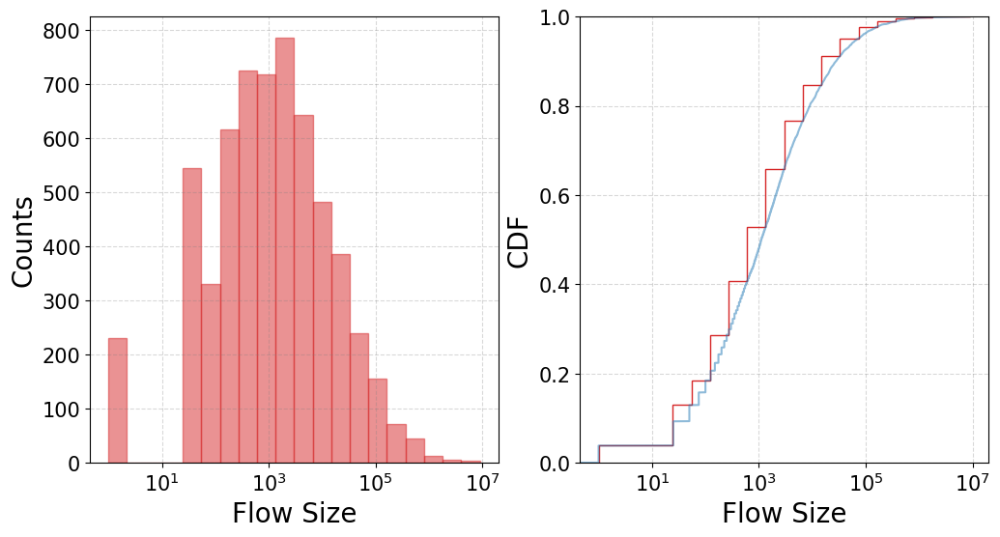

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.6593861995595205e-06), np.float64(0.16564822737109353)), mean=np.float64(0.005008899149858516), variance=np.float64(0.000438936695941763), skewness=np.float64(5.417836973280665), kurtosis=np.float64(30.052865984749978))


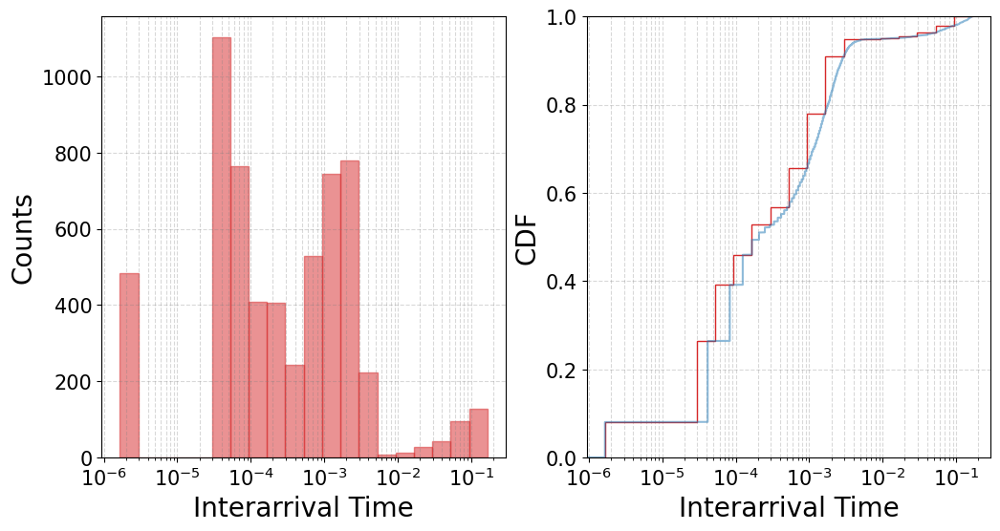

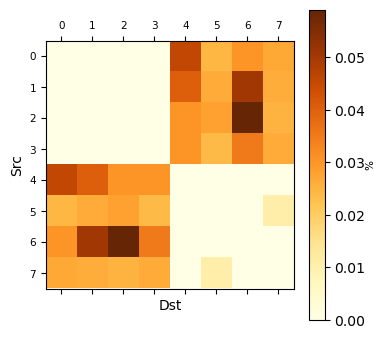

<Figure size 640x480 with 0 Axes>

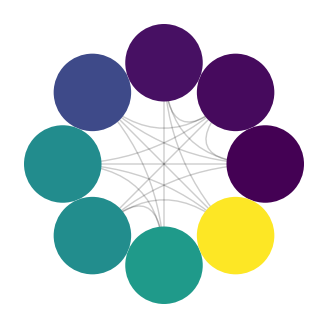

<Figure size 640x480 with 0 Axes>

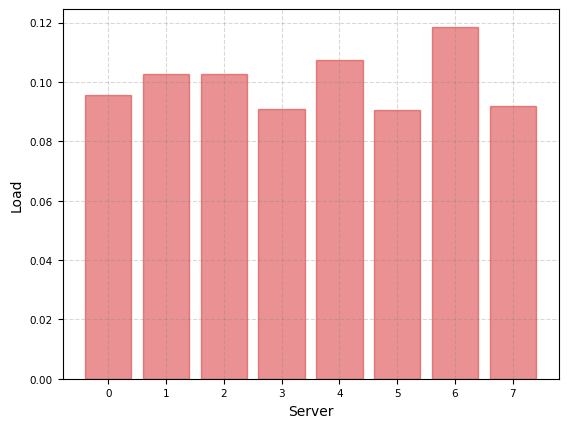

<Figure size 640x480 with 0 Axes>

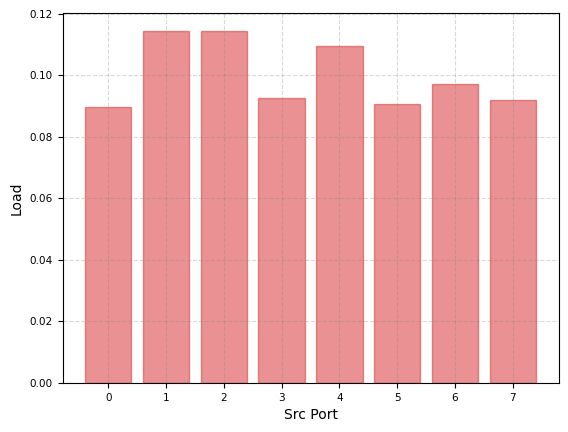

<Figure size 640x480 with 0 Axes>

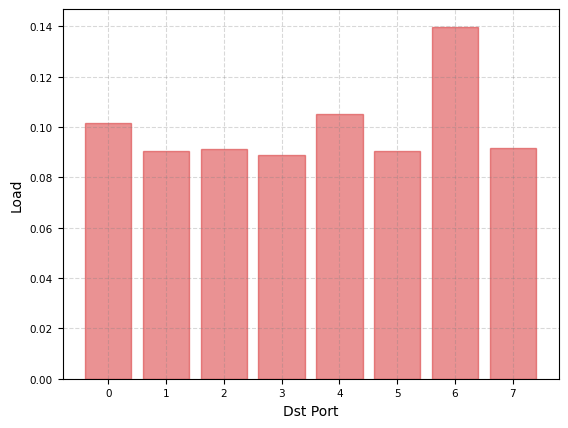



private_enterprise | Network Load = 0.2
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(8881925.0)), mean=np.float64(25040.321666666667), variance=np.float64(53576852816.96268), skewness=np.float64(26.25444479593359), kurtosis=np.float64(812.2256422535434))


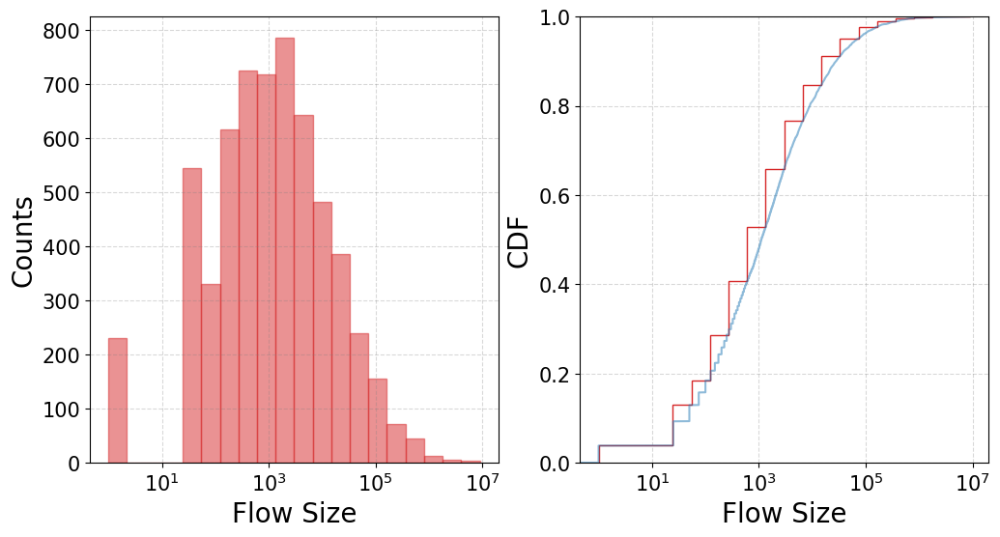

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(8.296930997797602e-07), np.float64(0.08282411368554676)), mean=np.float64(0.002504449574929258), variance=np.float64(0.00010973417398544075), skewness=np.float64(5.417836973280665), kurtosis=np.float64(30.052865984749978))


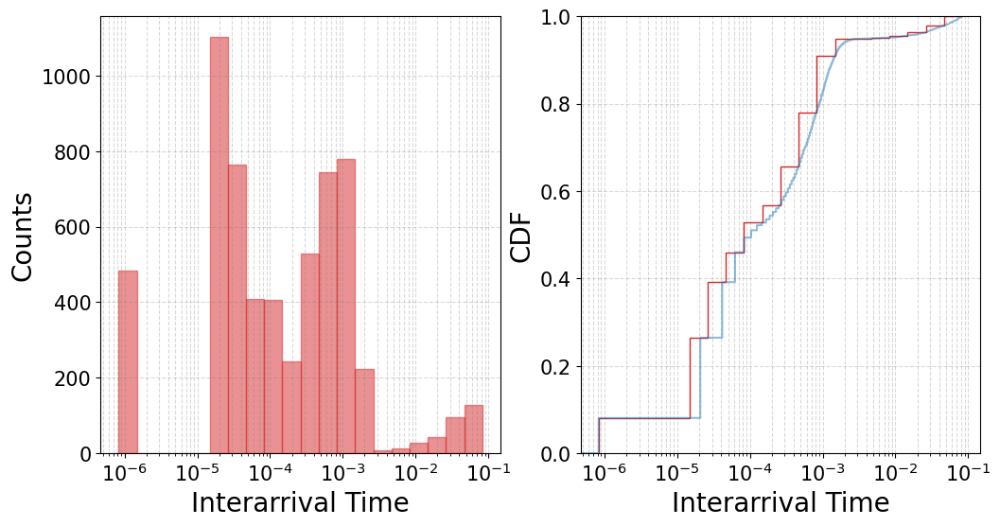

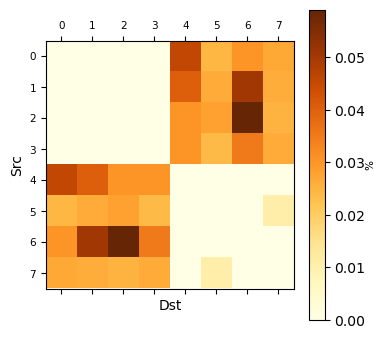

<Figure size 640x480 with 0 Axes>

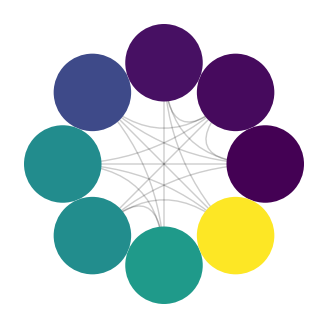

<Figure size 640x480 with 0 Axes>

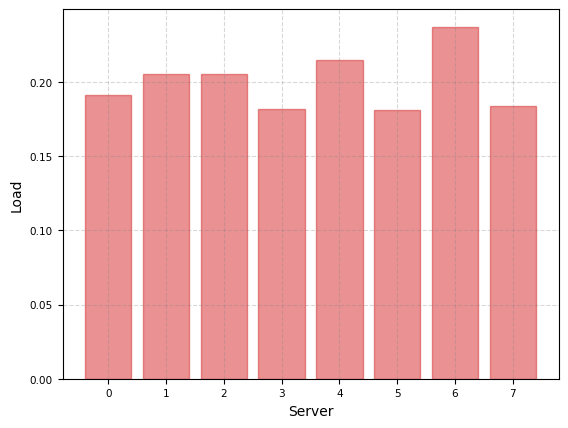

<Figure size 640x480 with 0 Axes>

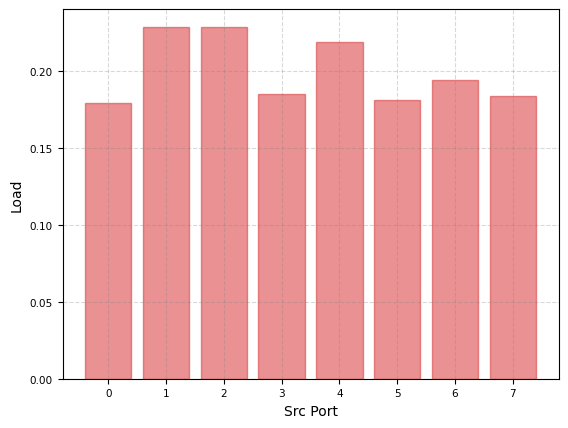

<Figure size 640x480 with 0 Axes>

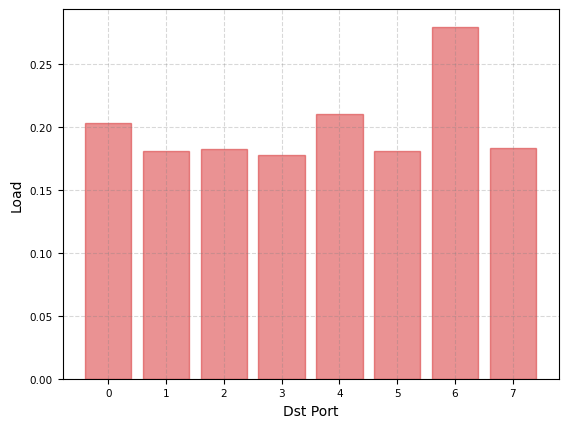



private_enterprise | Network Load = 0.3
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(8881925.0)), mean=np.float64(25040.321666666667), variance=np.float64(53576852816.96268), skewness=np.float64(26.25444479593359), kurtosis=np.float64(812.2256422535434))


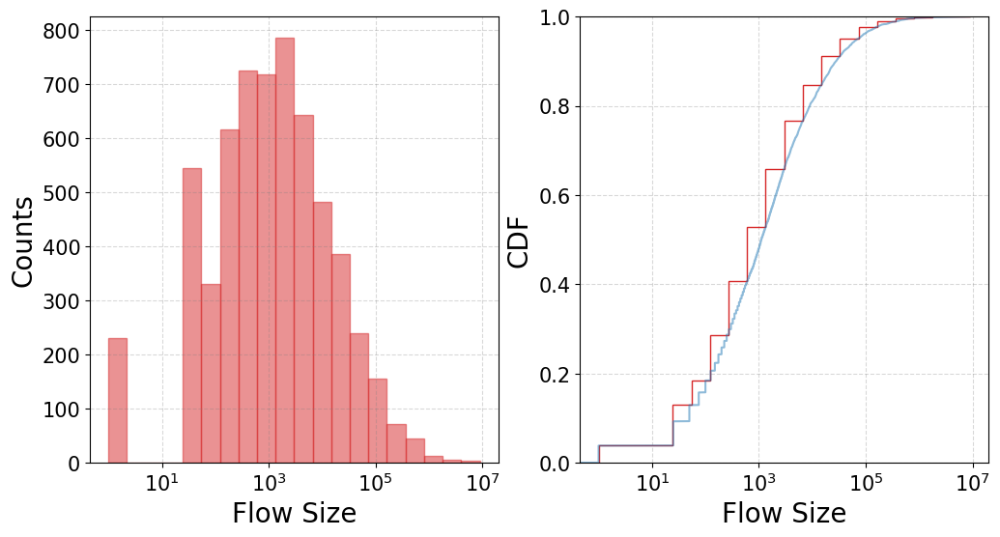

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(5.531287330384771e-07), np.float64(0.05521607579036436)), mean=np.float64(0.001669633049952775), variance=np.float64(4.8770743993529594e-05), skewness=np.float64(5.417836973280657), kurtosis=np.float64(30.0528659847499))


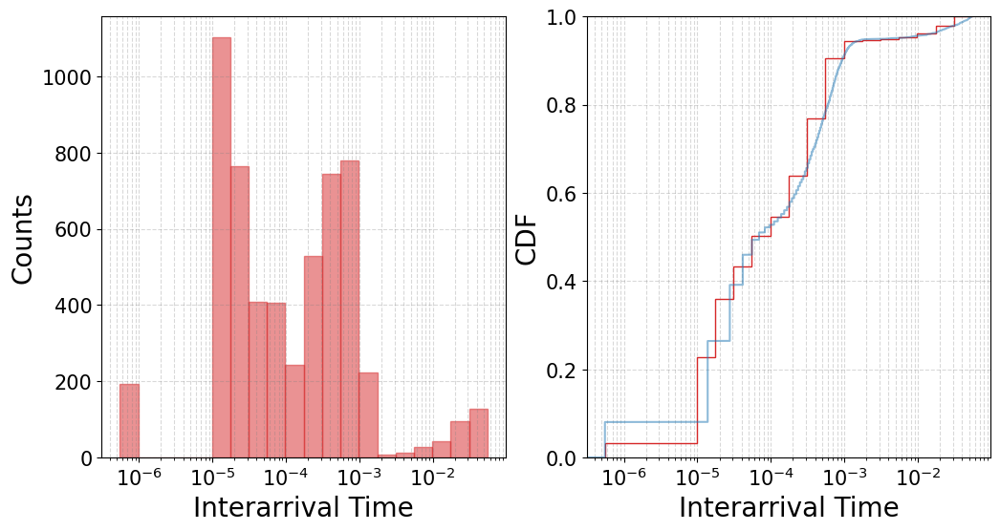

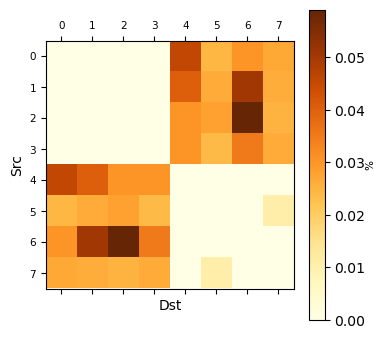

<Figure size 640x480 with 0 Axes>

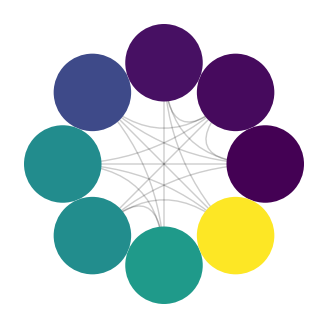

<Figure size 640x480 with 0 Axes>

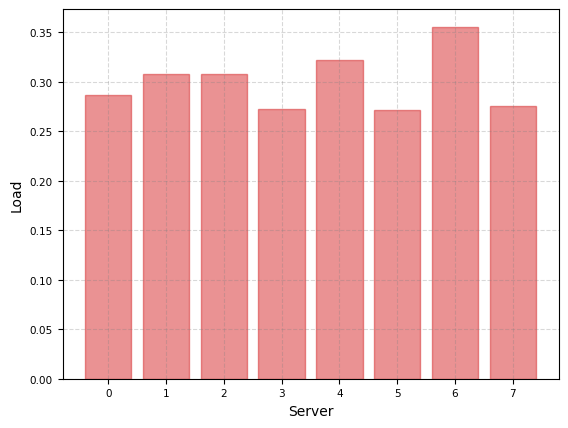

<Figure size 640x480 with 0 Axes>

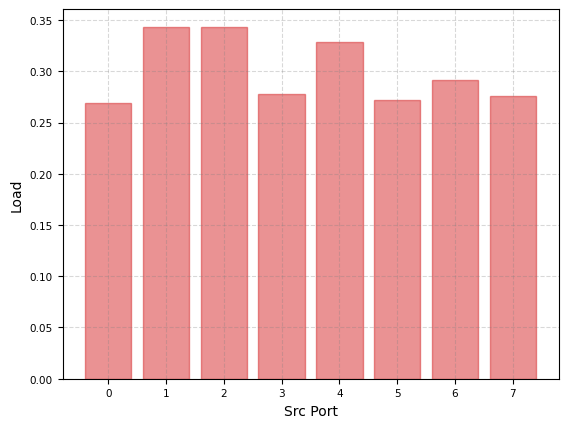

<Figure size 640x480 with 0 Axes>

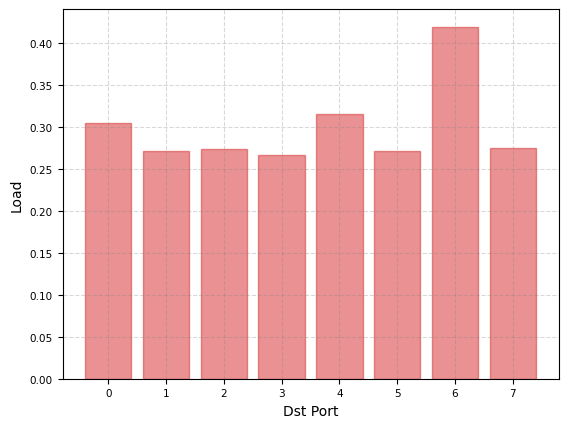



private_enterprise | Network Load = 0.4
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(8881925.0)), mean=np.float64(25040.321666666667), variance=np.float64(53576852816.96268), skewness=np.float64(26.25444479593359), kurtosis=np.float64(812.2256422535434))


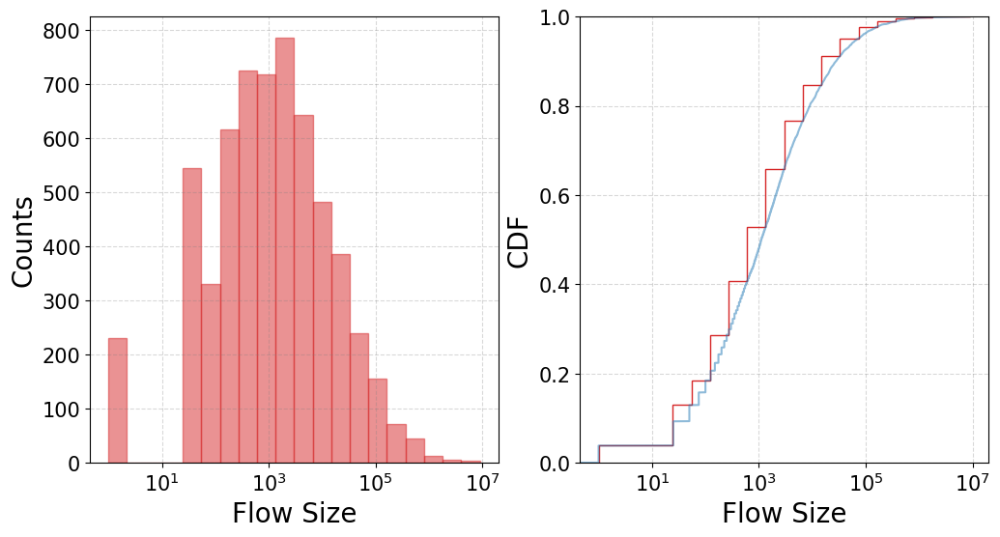

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(4.148465498898801e-07), np.float64(0.04141205684277338)), mean=np.float64(0.001252224787464629), variance=np.float64(2.7433543496360187e-05), skewness=np.float64(5.417836973280665), kurtosis=np.float64(30.052865984749978))


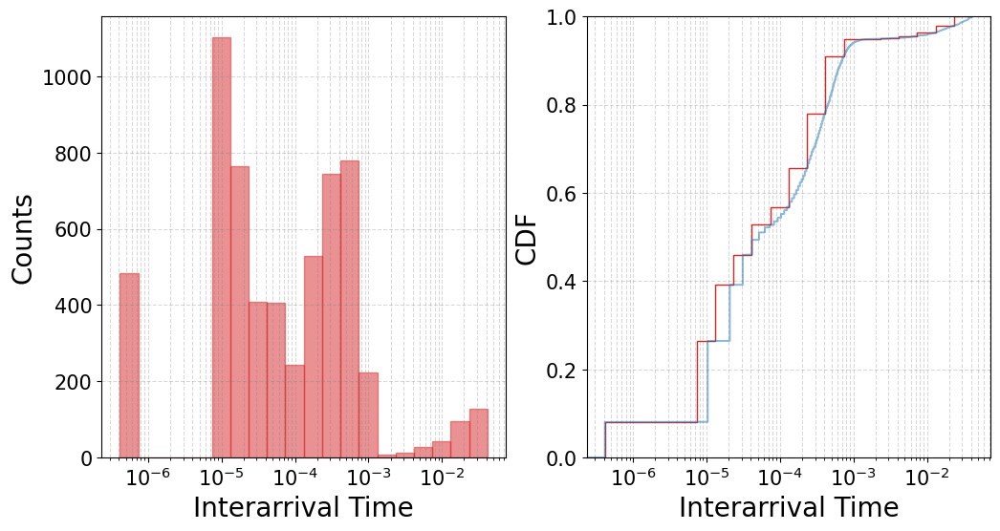

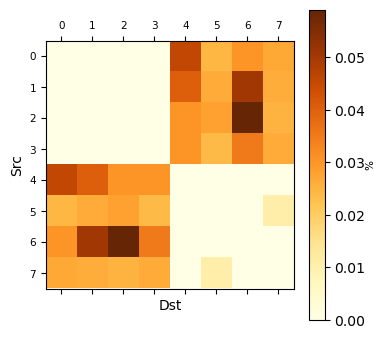

<Figure size 640x480 with 0 Axes>

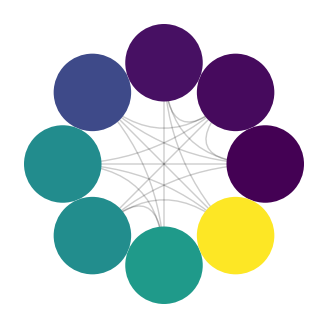

<Figure size 640x480 with 0 Axes>

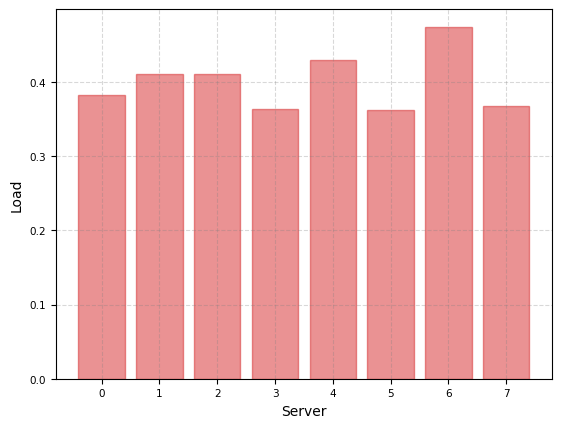

<Figure size 640x480 with 0 Axes>

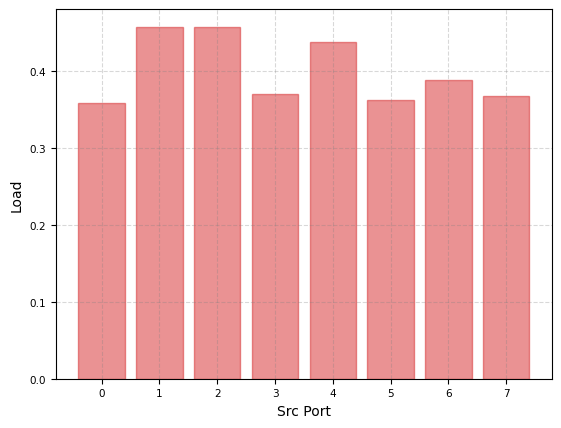

<Figure size 640x480 with 0 Axes>

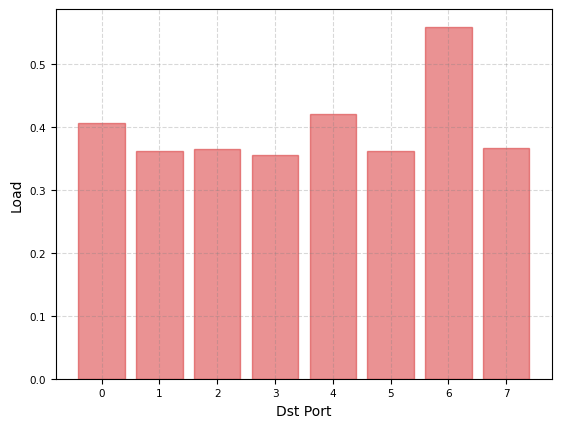



private_enterprise | Network Load = 0.5
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(8881925.0)), mean=np.float64(25040.321666666667), variance=np.float64(53576852816.96268), skewness=np.float64(26.25444479593359), kurtosis=np.float64(812.2256422535434))


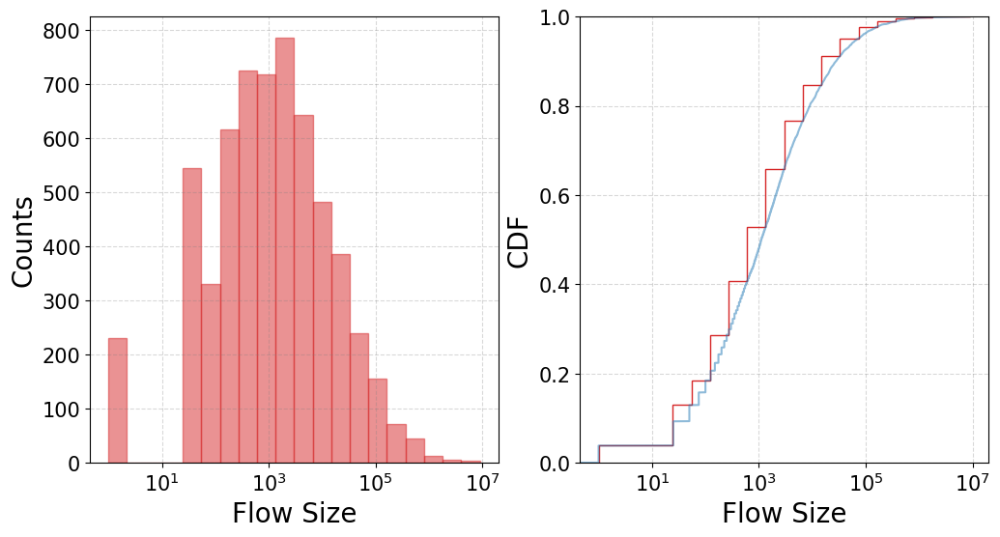

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(3.318772399119041e-07), np.float64(0.033129645474218705)), mean=np.float64(0.0010017798299717107), variance=np.float64(1.7557467837670518e-05), skewness=np.float64(5.41783697328067), kurtosis=np.float64(30.052865984750042))


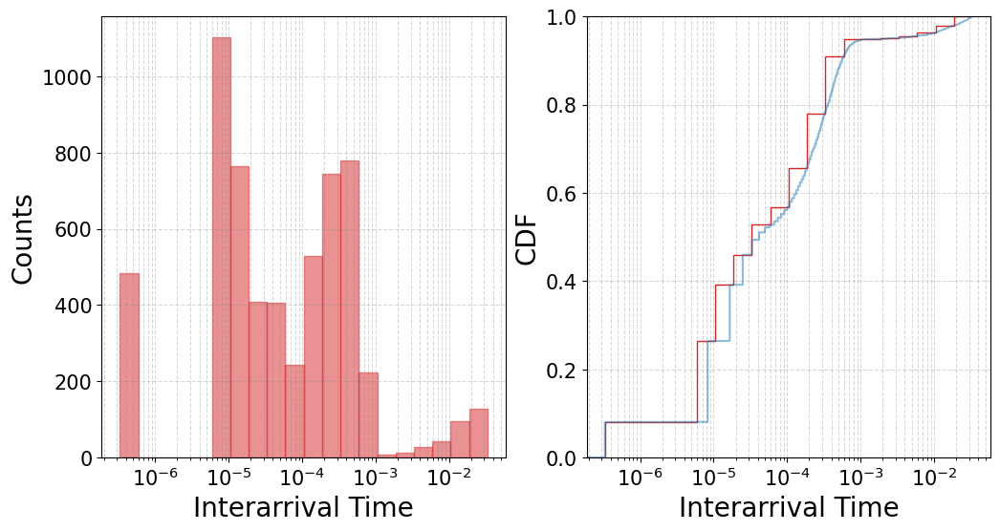

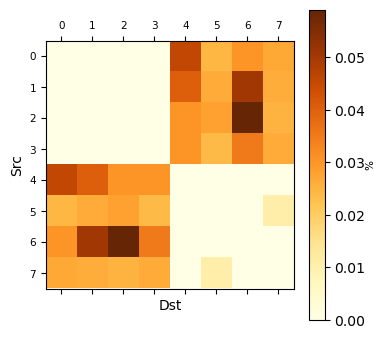

<Figure size 640x480 with 0 Axes>

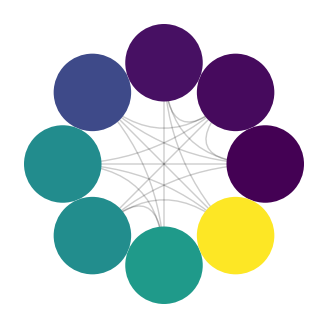

<Figure size 640x480 with 0 Axes>

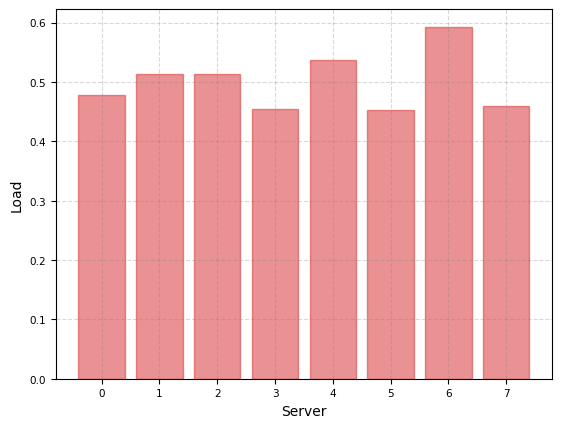

<Figure size 640x480 with 0 Axes>

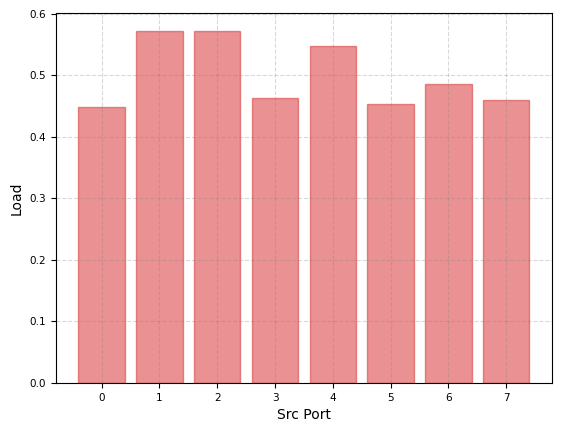

<Figure size 640x480 with 0 Axes>

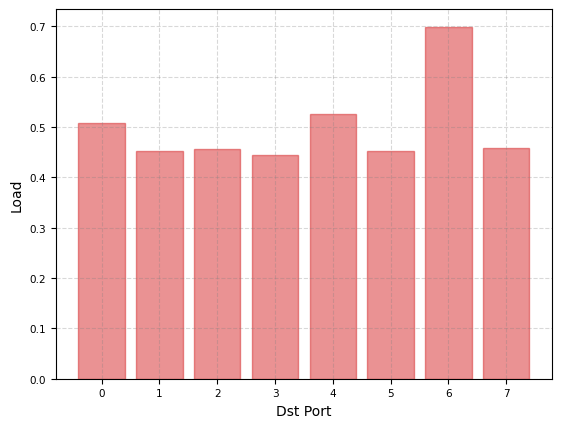



private_enterprise | Network Load = 0.6
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(8881925.0)), mean=np.float64(25040.321666666667), variance=np.float64(53576852816.96268), skewness=np.float64(26.25444479593359), kurtosis=np.float64(812.2256422535434))


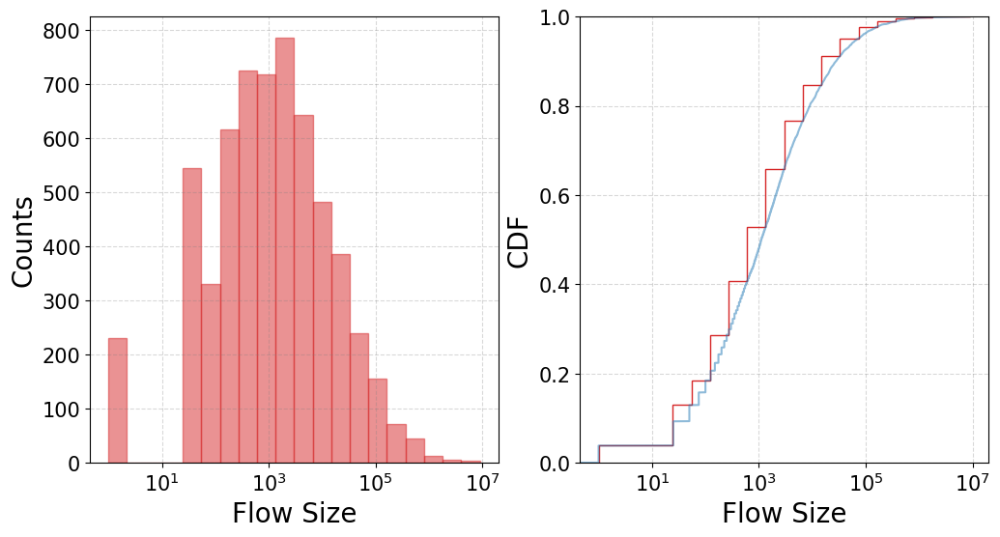

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(2.7656436651923855e-07), np.float64(0.02760803789518218)), mean=np.float64(0.0008348165249763875), variance=np.float64(1.2192685998382399e-05), skewness=np.float64(5.417836973280657), kurtosis=np.float64(30.0528659847499))


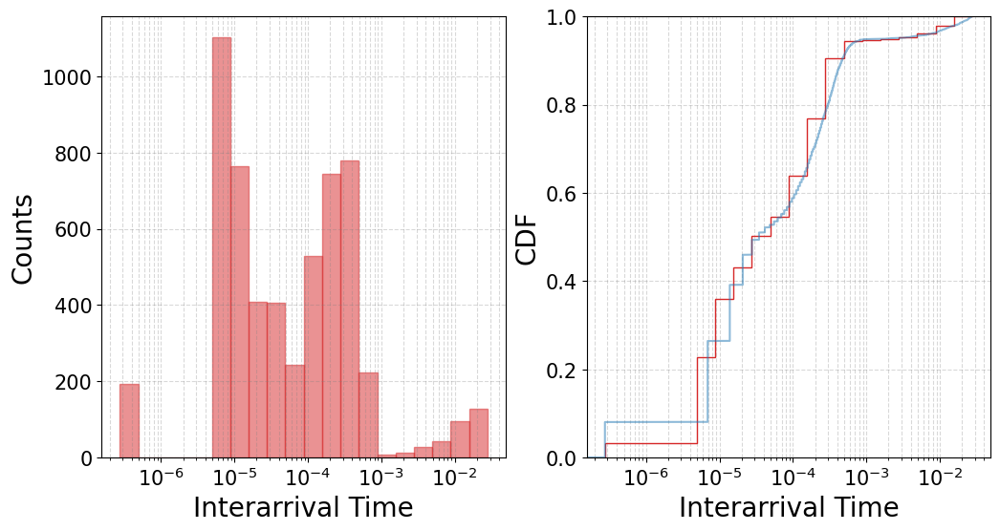

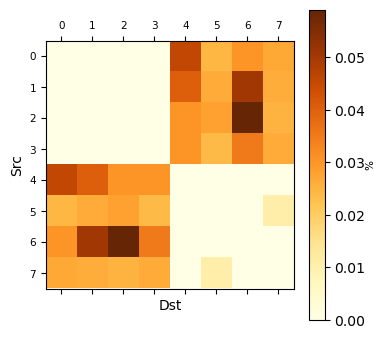

<Figure size 640x480 with 0 Axes>

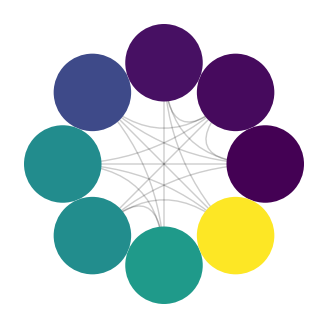

<Figure size 640x480 with 0 Axes>

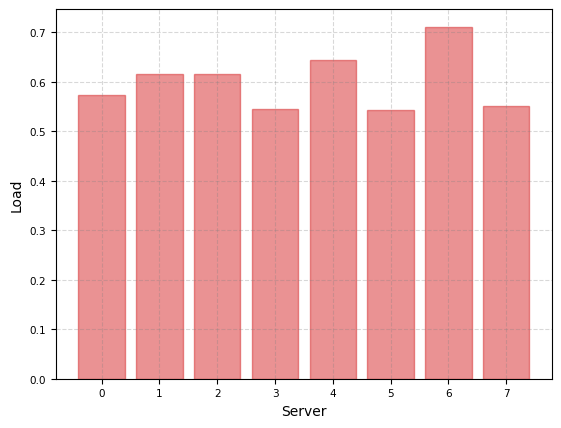

<Figure size 640x480 with 0 Axes>

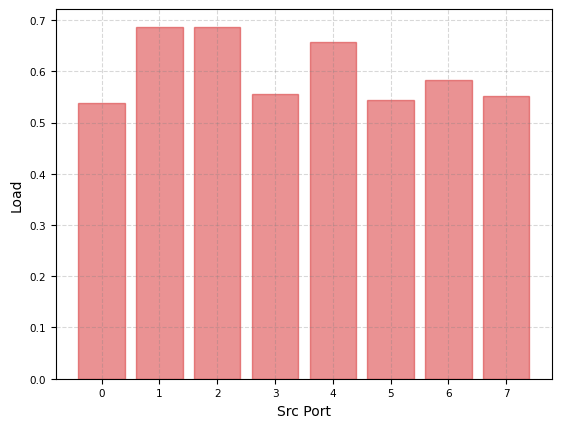

<Figure size 640x480 with 0 Axes>

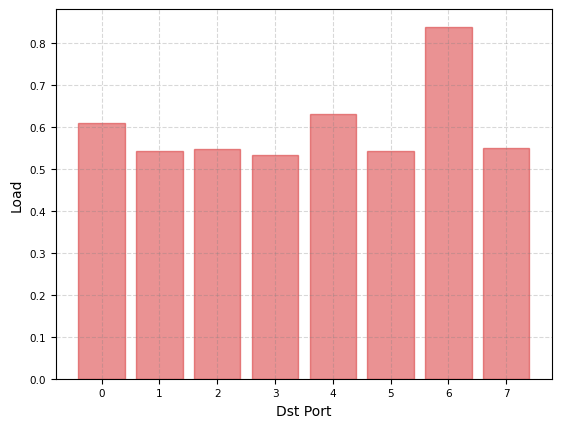



private_enterprise | Network Load = 0.7
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(8881925.0)), mean=np.float64(25040.321666666667), variance=np.float64(53576852816.96268), skewness=np.float64(26.25444479593359), kurtosis=np.float64(812.2256422535434))


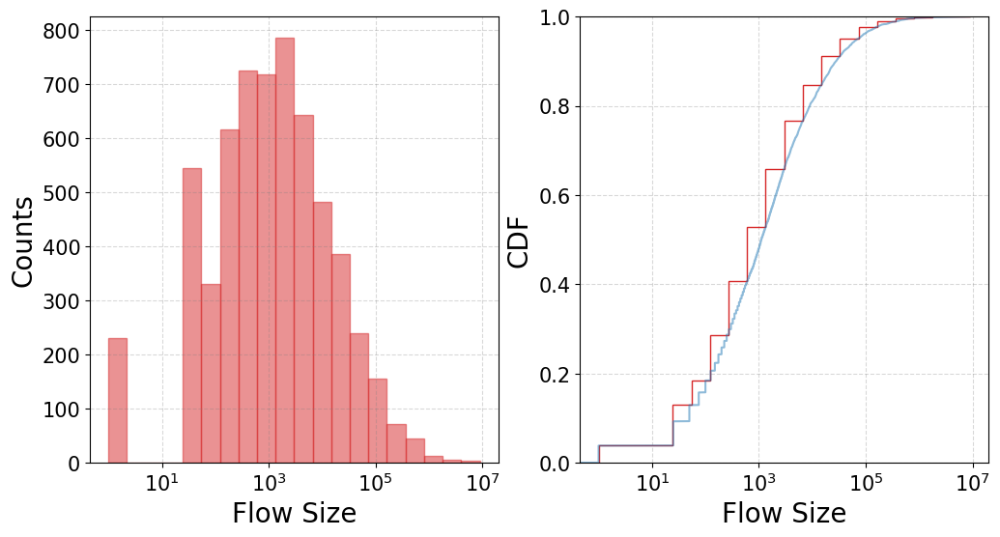

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(2.370551710484392e-07), np.float64(0.023664032481584885)), mean=np.float64(0.0007155570214083479), variance=np.float64(8.957891753913557e-06), skewness=np.float64(5.417836973280662), kurtosis=np.float64(30.052865984749943))


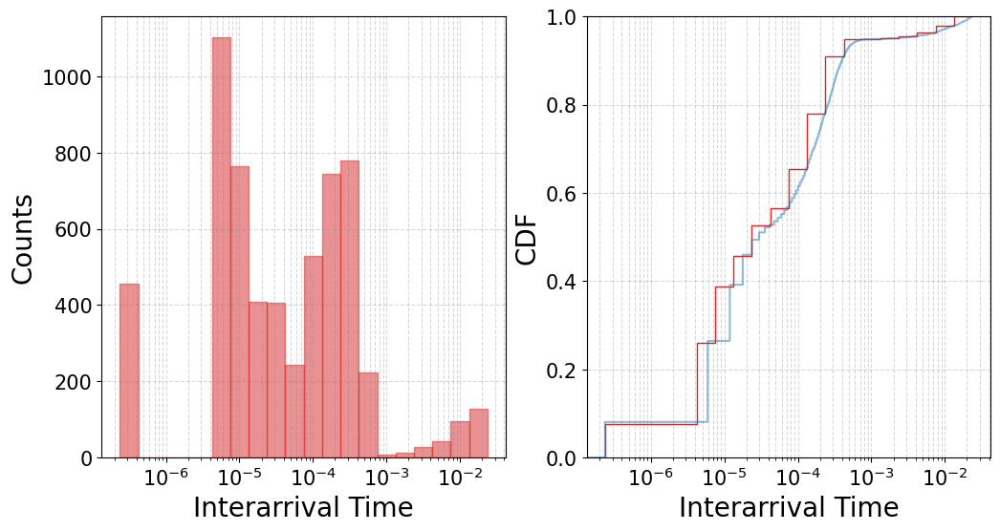

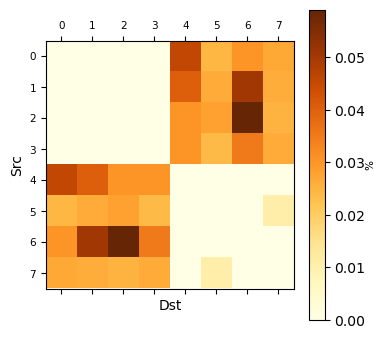

<Figure size 640x480 with 0 Axes>

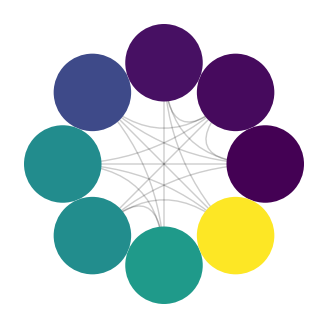

<Figure size 640x480 with 0 Axes>

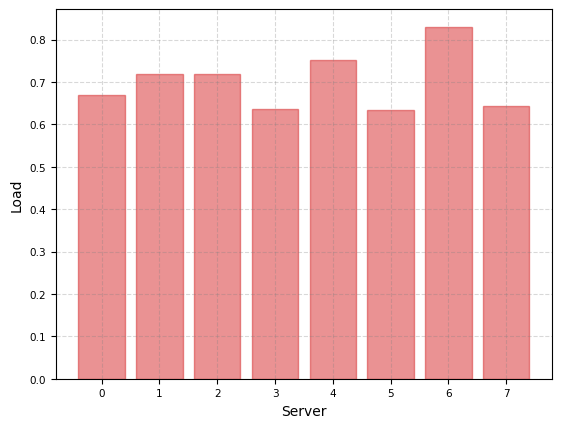

<Figure size 640x480 with 0 Axes>

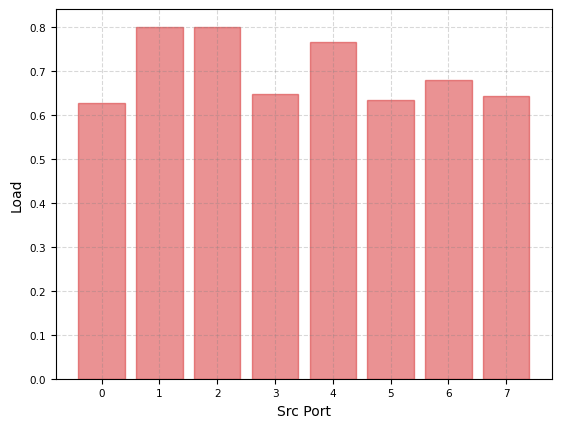

<Figure size 640x480 with 0 Axes>

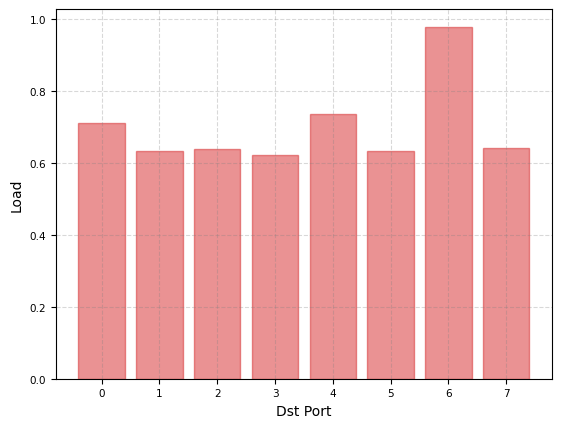



private_enterprise | Network Load = 0.8
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(8881925.0)), mean=np.float64(25040.321666666667), variance=np.float64(53576852816.96268), skewness=np.float64(26.25444479593359), kurtosis=np.float64(812.2256422535434))


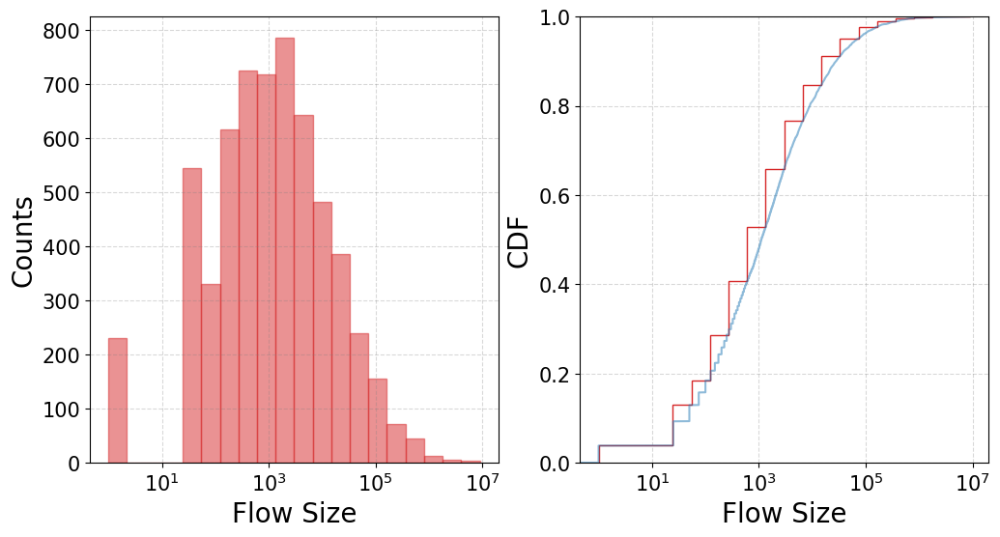

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(2.0742327494494006e-07), np.float64(0.02070602842138669)), mean=np.float64(0.0006261123937323145), variance=np.float64(6.858385874090047e-06), skewness=np.float64(5.417836973280665), kurtosis=np.float64(30.052865984749978))


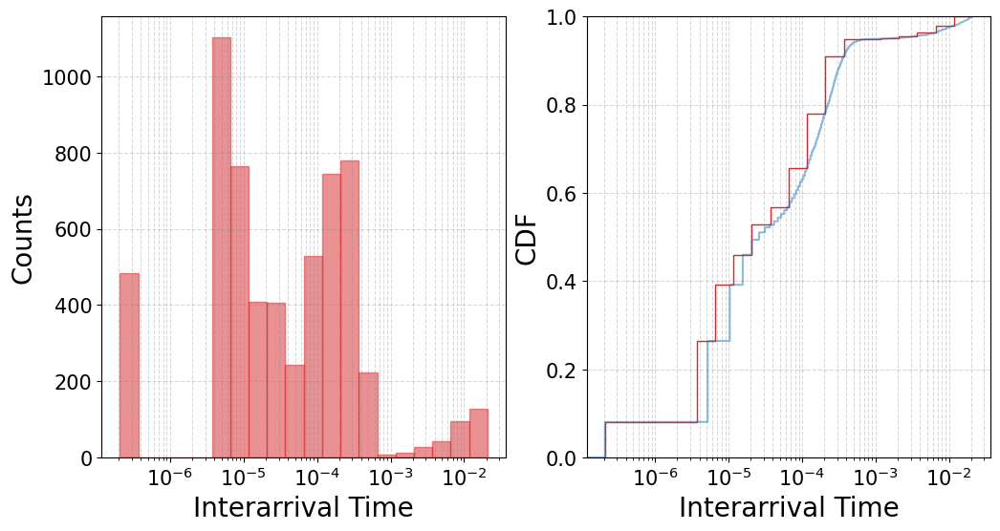

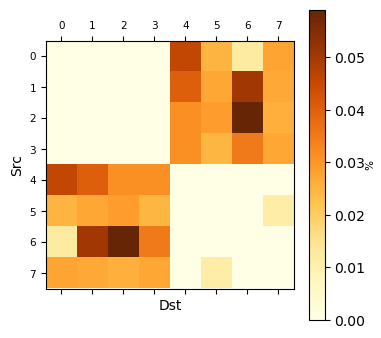

<Figure size 640x480 with 0 Axes>

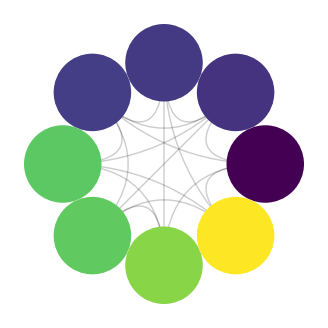

<Figure size 640x480 with 0 Axes>

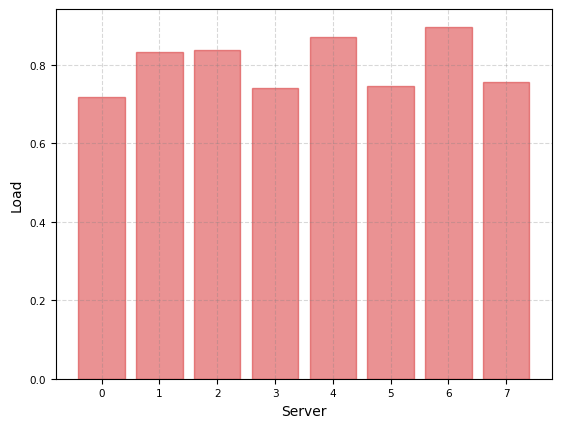

<Figure size 640x480 with 0 Axes>

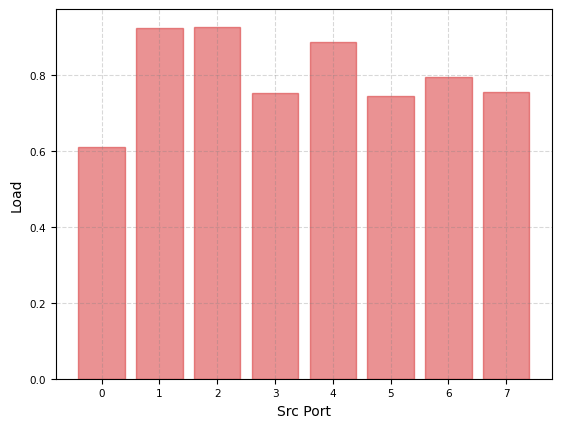

<Figure size 640x480 with 0 Axes>

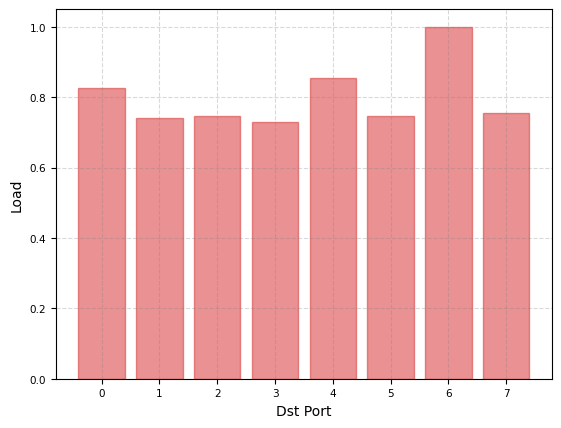



private_enterprise | Network Load = 0.9
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(8881925.0)), mean=np.float64(25040.321666666667), variance=np.float64(53576852816.96268), skewness=np.float64(26.25444479593359), kurtosis=np.float64(812.2256422535434))


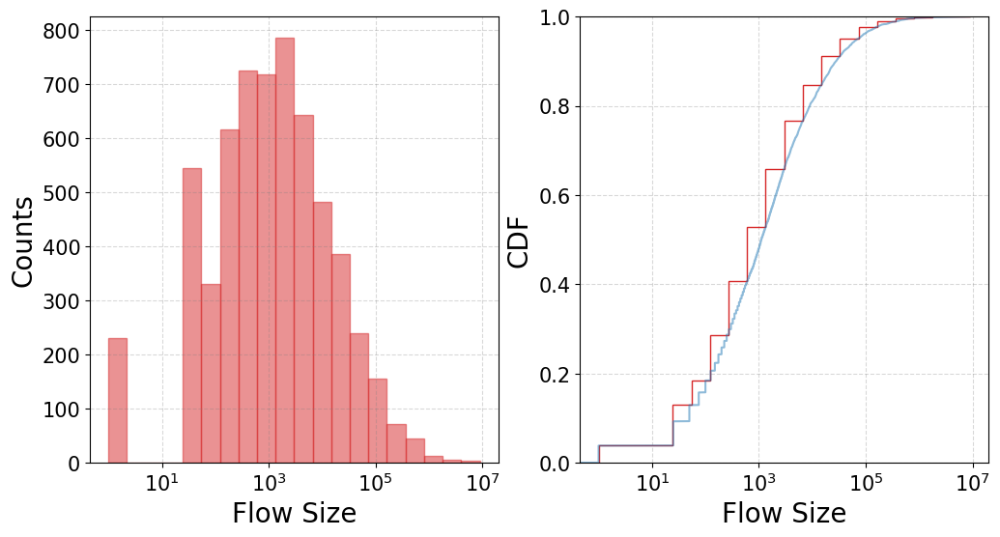

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.8437624438316647e-07), np.float64(0.018405358596788268)), mean=np.float64(0.0005565443499842523), variance=np.float64(5.418971554836616e-06), skewness=np.float64(5.417836973280659), kurtosis=np.float64(30.052865984749957))


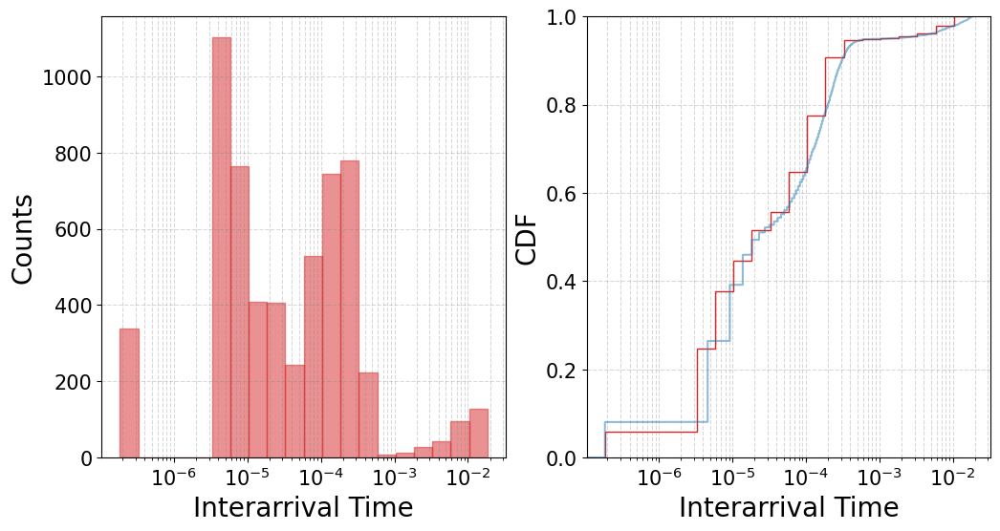

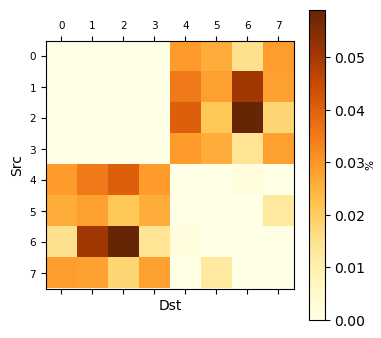

<Figure size 640x480 with 0 Axes>

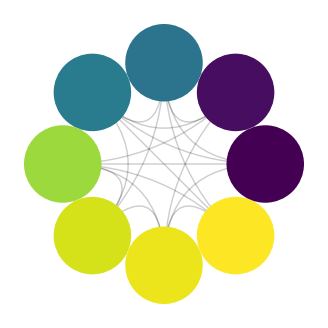

<Figure size 640x480 with 0 Axes>

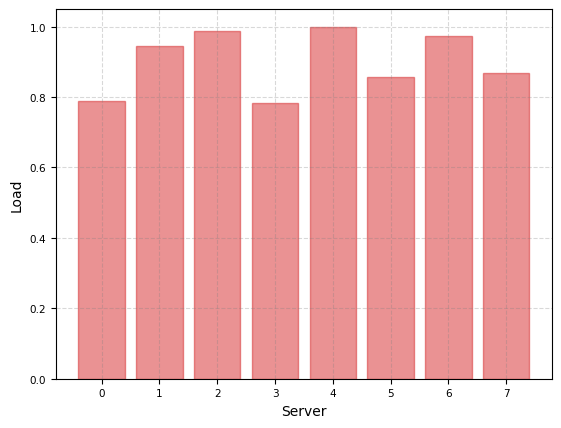

<Figure size 640x480 with 0 Axes>

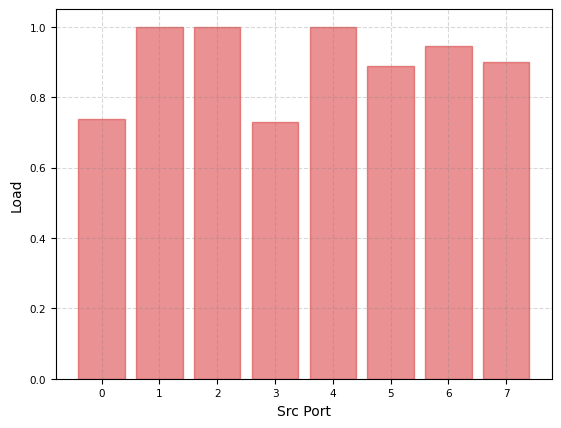

<Figure size 640x480 with 0 Axes>

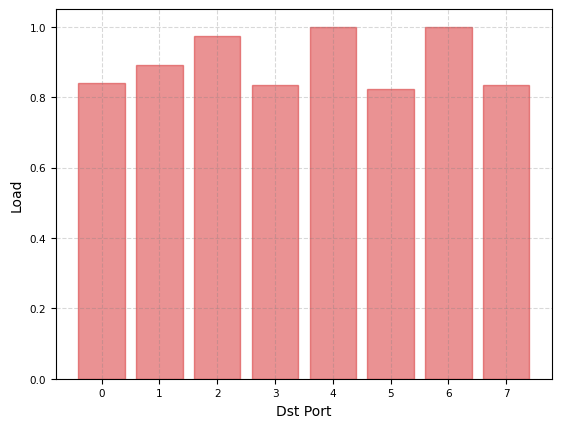



social_media_cloud | Network Load = 0.1
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(1854025.0)), mean=np.float64(42580.076), variance=np.float64(9139044247.309774), skewness=np.float64(6.268050679603705), kurtosis=np.float64(66.72612368104691))


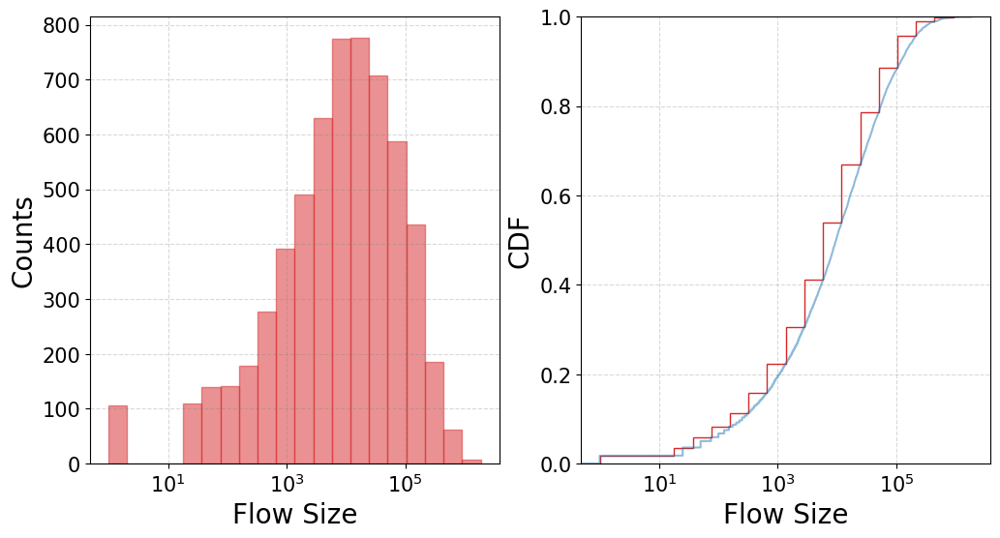

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.7028964618415188e-06), np.float64(5.01907445931484)), mean=np.float64(0.008517434772462145), variance=np.float64(0.006106244337788776), skewness=np.float64(47.98514793701265), kurtosis=np.float64(2895.392733213652))


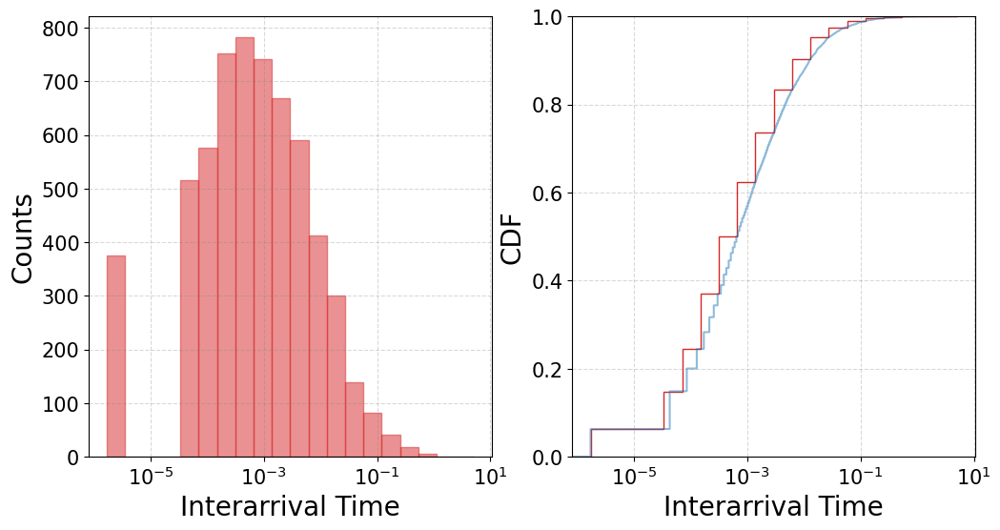

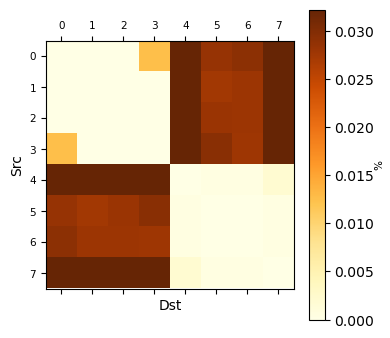

<Figure size 640x480 with 0 Axes>

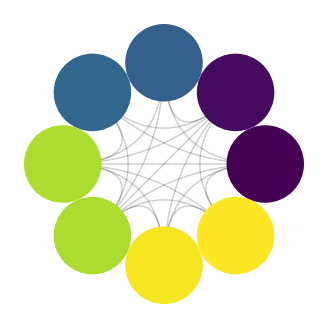

<Figure size 640x480 with 0 Axes>

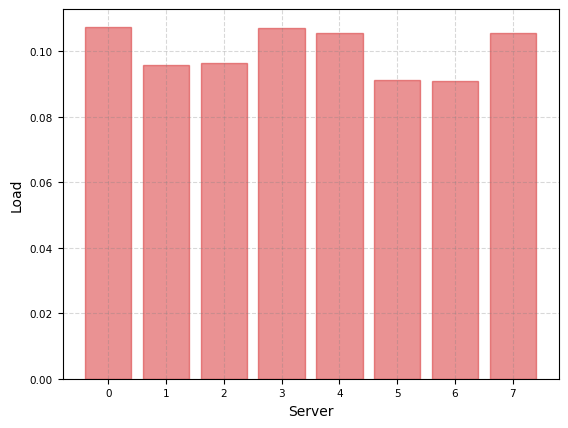

<Figure size 640x480 with 0 Axes>

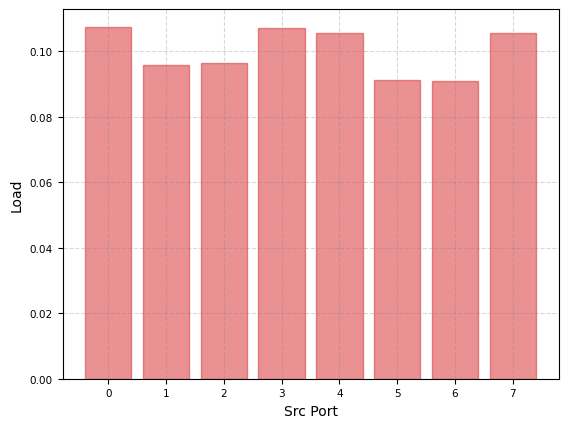

<Figure size 640x480 with 0 Axes>

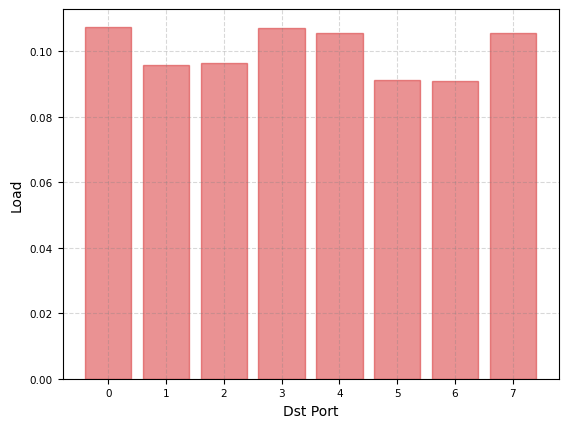



social_media_cloud | Network Load = 0.2
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(1854025.0)), mean=np.float64(42580.076), variance=np.float64(9139044247.309774), skewness=np.float64(6.268050679603705), kurtosis=np.float64(66.72612368104691))


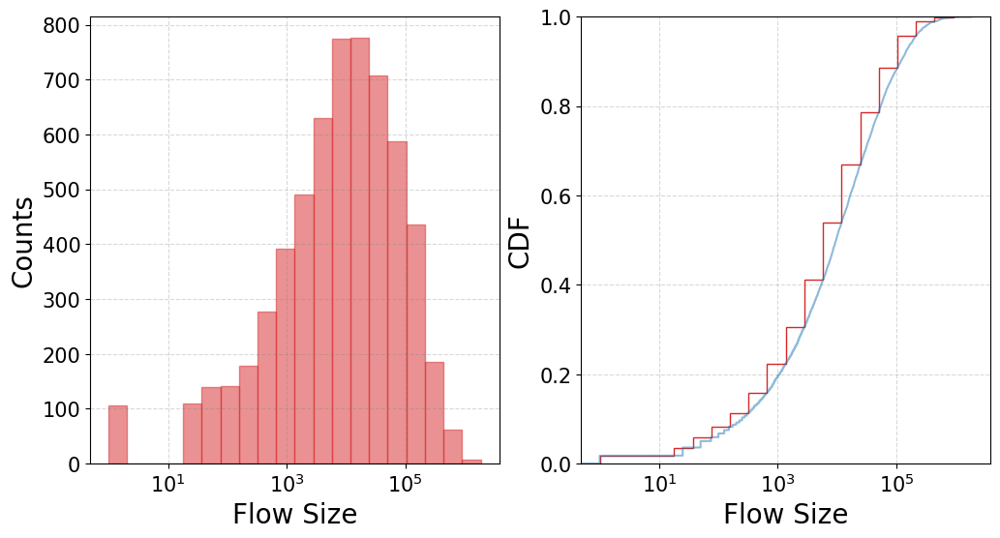

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(8.514482309207594e-07), np.float64(2.50953722965742)), mean=np.float64(0.004258717386231073), variance=np.float64(0.001526561084447194), skewness=np.float64(47.98514793701265), kurtosis=np.float64(2895.392733213652))


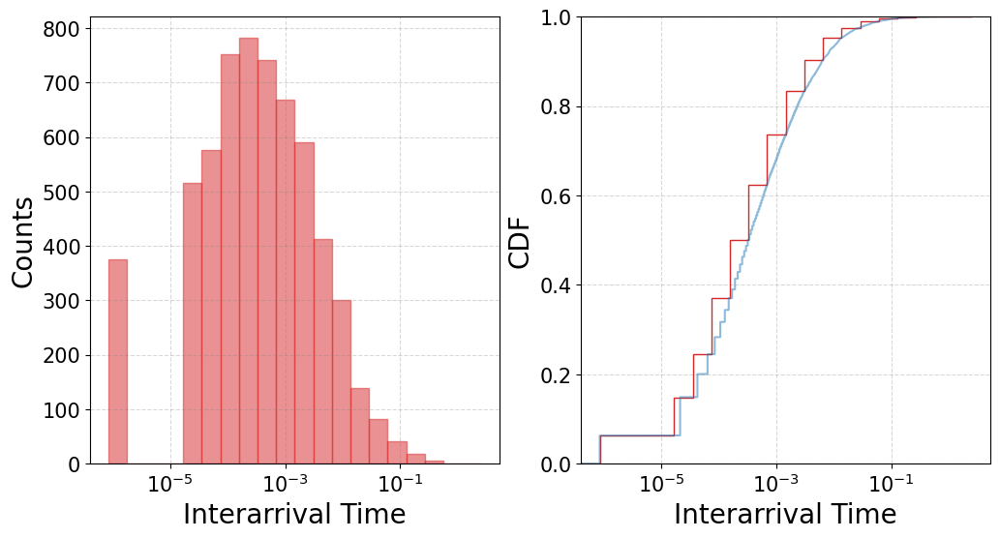

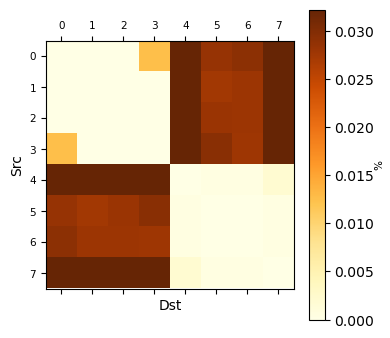

<Figure size 640x480 with 0 Axes>

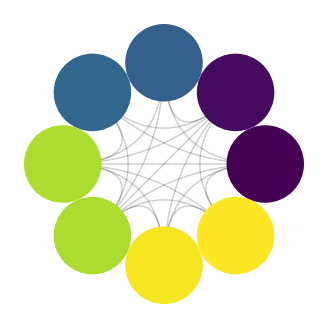

<Figure size 640x480 with 0 Axes>

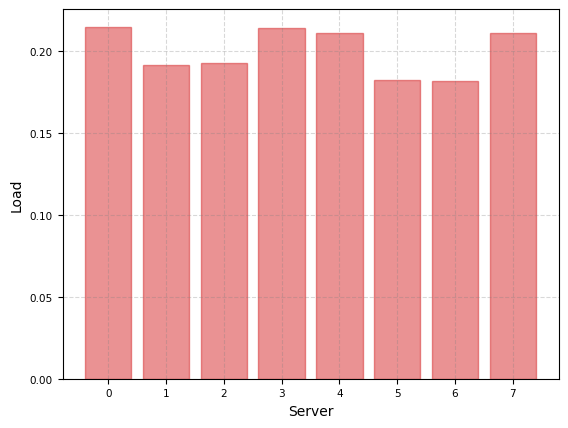

<Figure size 640x480 with 0 Axes>

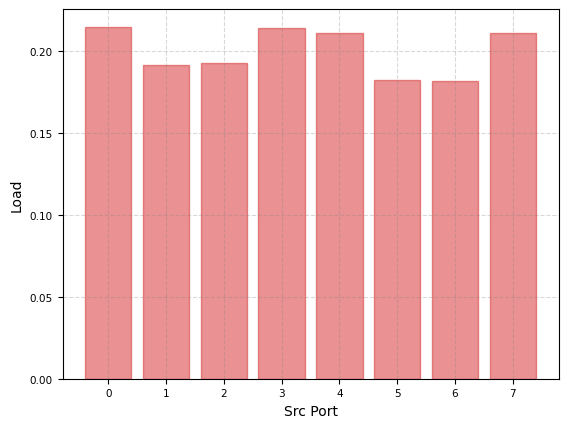

<Figure size 640x480 with 0 Axes>

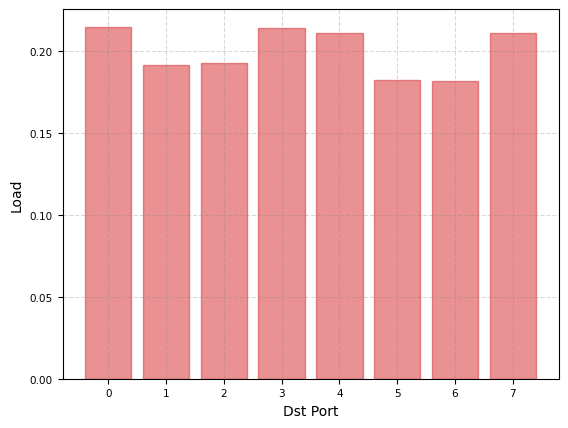



social_media_cloud | Network Load = 0.3
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(1854025.0)), mean=np.float64(42580.076), variance=np.float64(9139044247.309774), skewness=np.float64(6.268050679603705), kurtosis=np.float64(66.72612368104691))


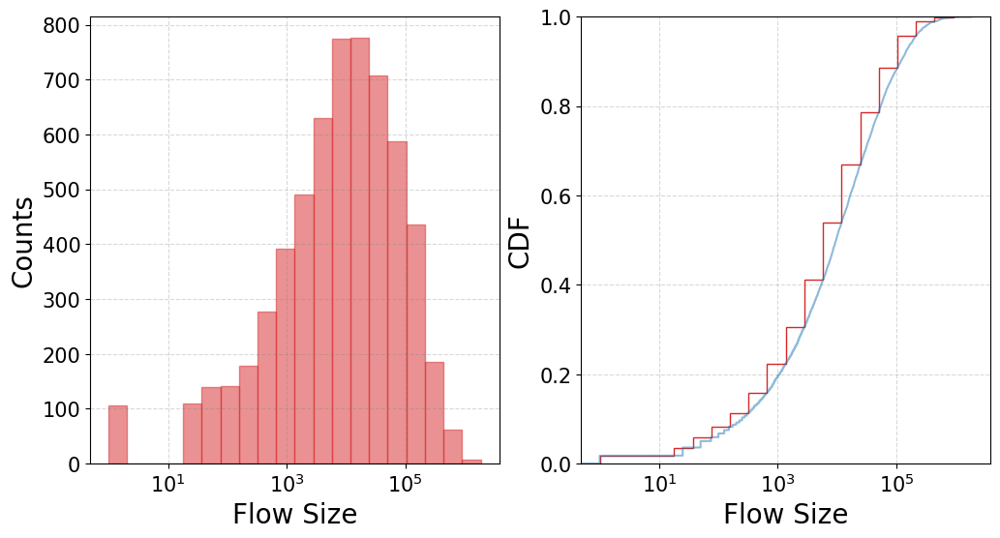

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(5.676321528369499e-07), np.float64(1.673024819771614)), mean=np.float64(0.002839144924154073), variance=np.float64(0.0006784715930876418), skewness=np.float64(47.9851479370127), kurtosis=np.float64(2895.3927332136573))


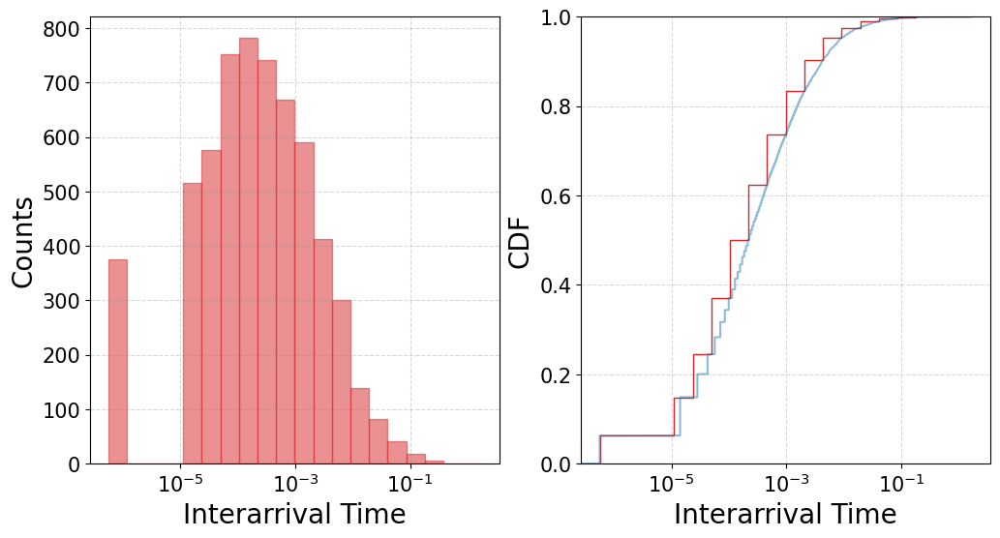

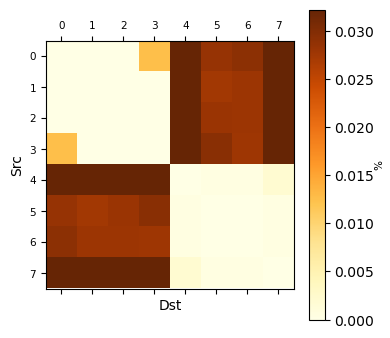

<Figure size 640x480 with 0 Axes>

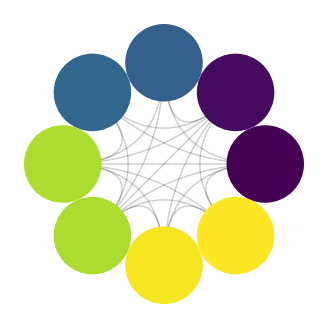

<Figure size 640x480 with 0 Axes>

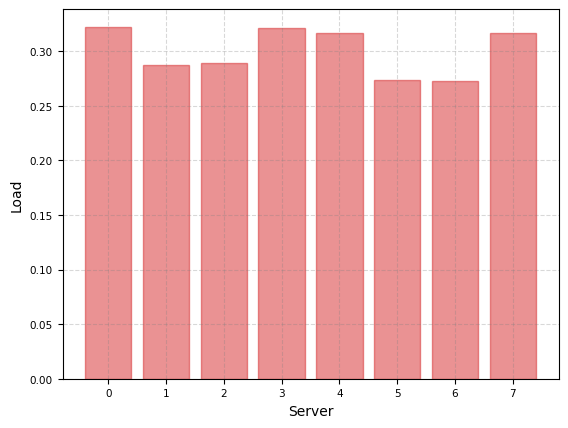

<Figure size 640x480 with 0 Axes>

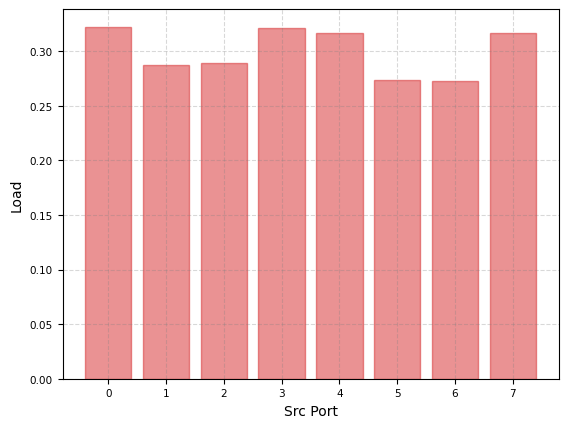

<Figure size 640x480 with 0 Axes>

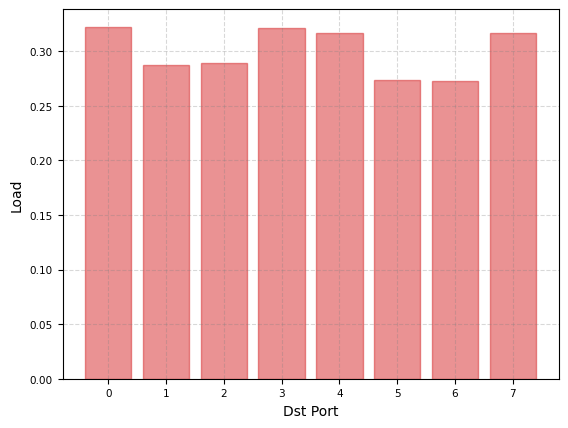



social_media_cloud | Network Load = 0.4
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(1854025.0)), mean=np.float64(42580.076), variance=np.float64(9139044247.309774), skewness=np.float64(6.268050679603705), kurtosis=np.float64(66.72612368104691))


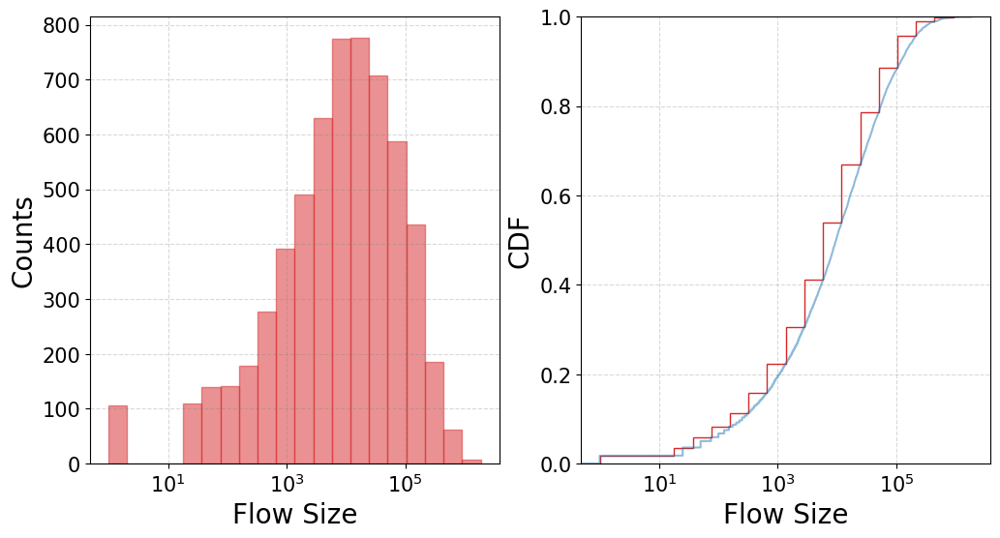

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(4.257241154603797e-07), np.float64(1.25476861482871)), mean=np.float64(0.0021293586931155364), variance=np.float64(0.0003816402711117985), skewness=np.float64(47.98514793701265), kurtosis=np.float64(2895.392733213652))


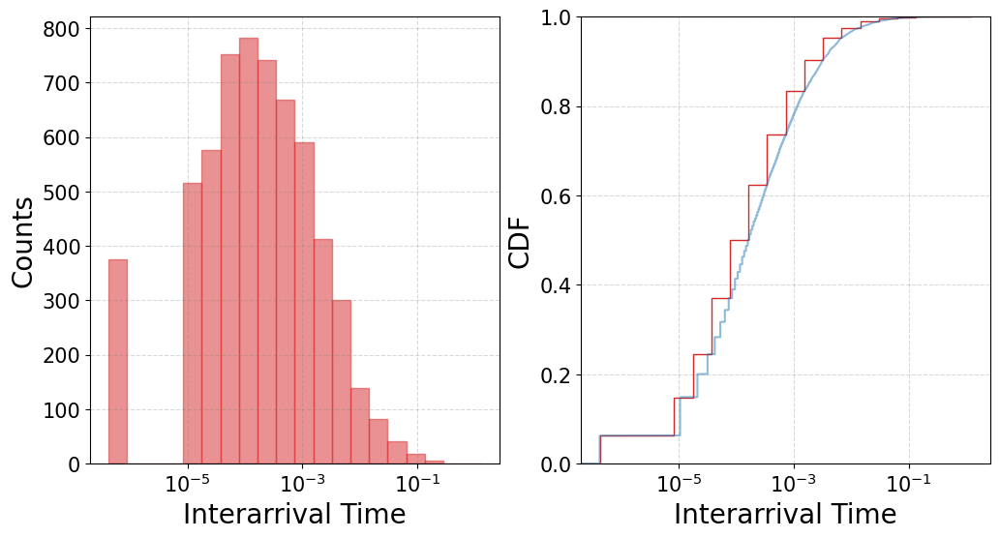

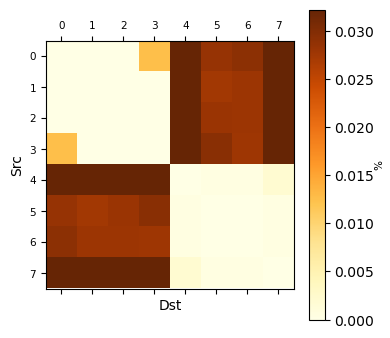

<Figure size 640x480 with 0 Axes>

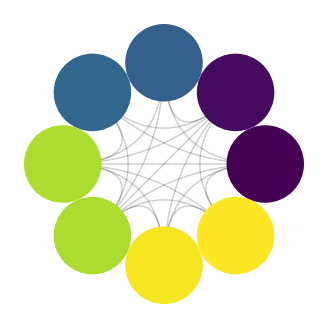

<Figure size 640x480 with 0 Axes>

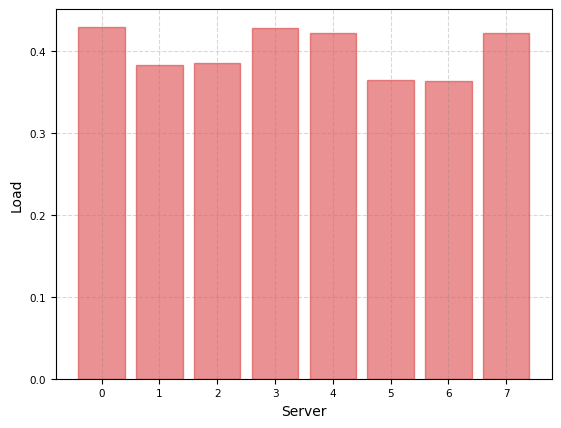

<Figure size 640x480 with 0 Axes>

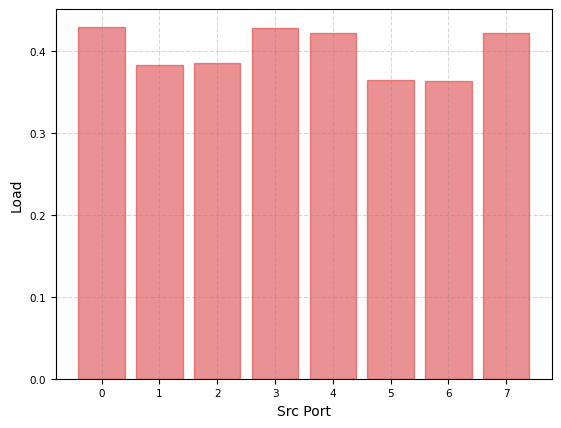

<Figure size 640x480 with 0 Axes>

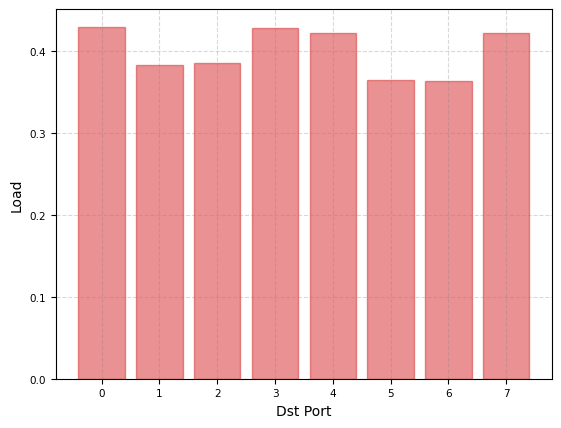



social_media_cloud | Network Load = 0.5
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(1854025.0)), mean=np.float64(42580.076), variance=np.float64(9139044247.309774), skewness=np.float64(6.268050679603705), kurtosis=np.float64(66.72612368104691))


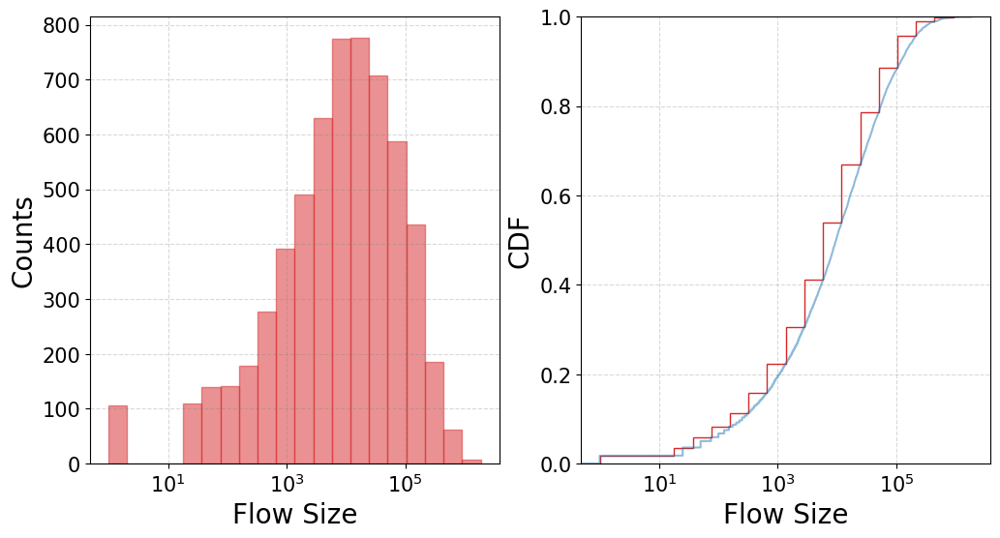

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(3.4057929232389483e-07), np.float64(1.0038148918629686)), mean=np.float64(0.0017034869544924264), variance=np.float64(0.00024424977351155124), skewness=np.float64(47.985147937012655), kurtosis=np.float64(2895.392733213653))


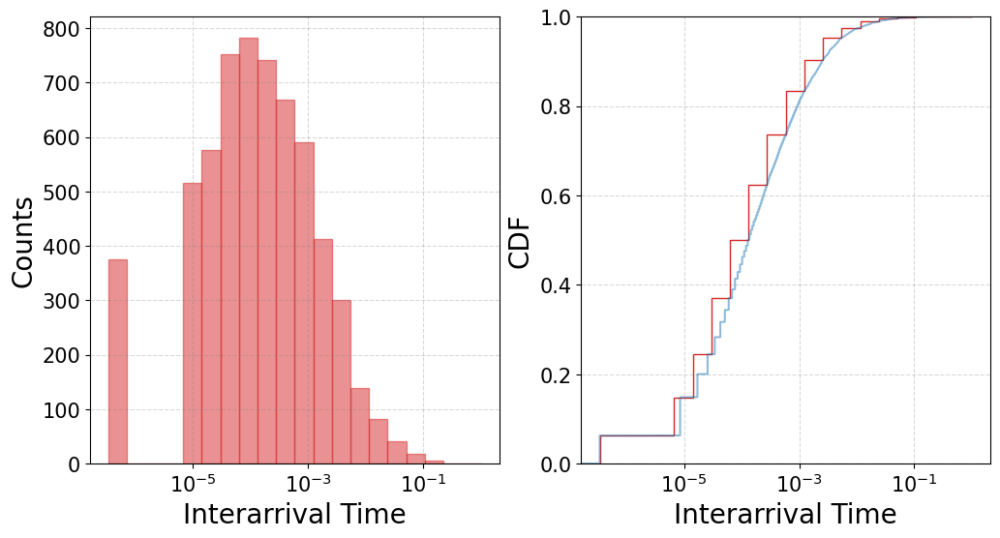

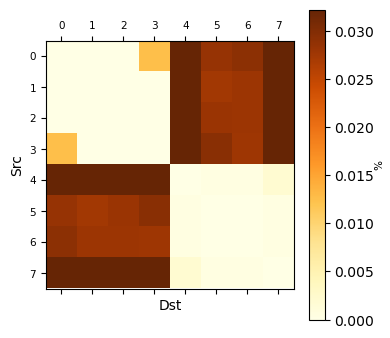

<Figure size 640x480 with 0 Axes>

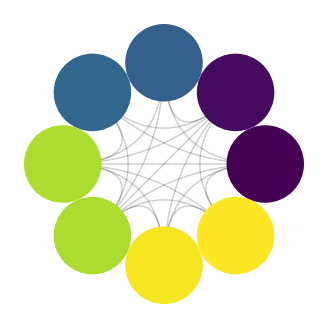

<Figure size 640x480 with 0 Axes>

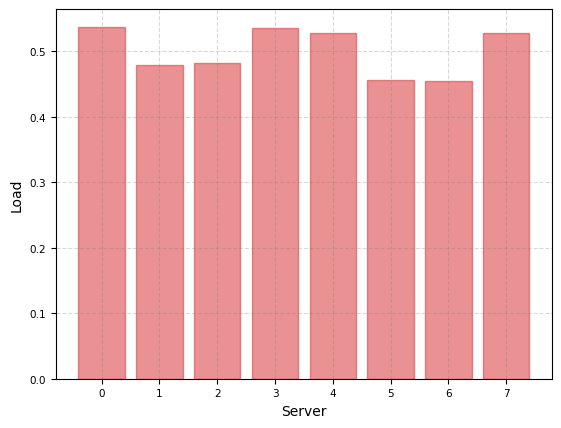

<Figure size 640x480 with 0 Axes>

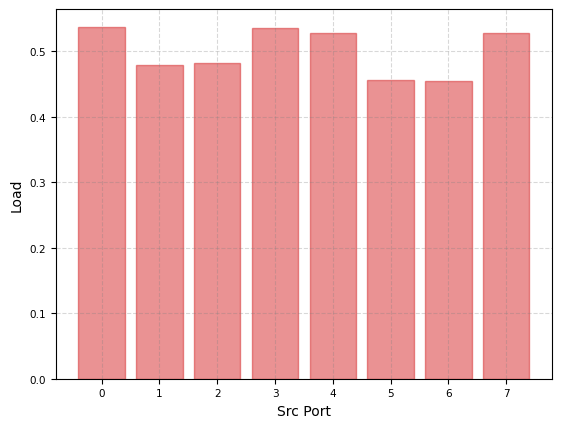

<Figure size 640x480 with 0 Axes>

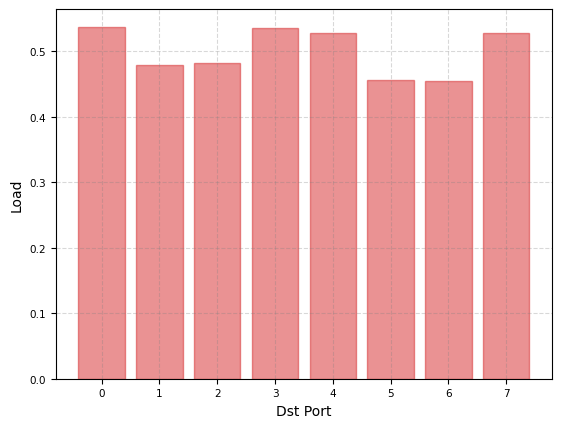



social_media_cloud | Network Load = 0.6
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(1854025.0)), mean=np.float64(42580.076), variance=np.float64(9139044247.309774), skewness=np.float64(6.268050679603705), kurtosis=np.float64(66.72612368104691))


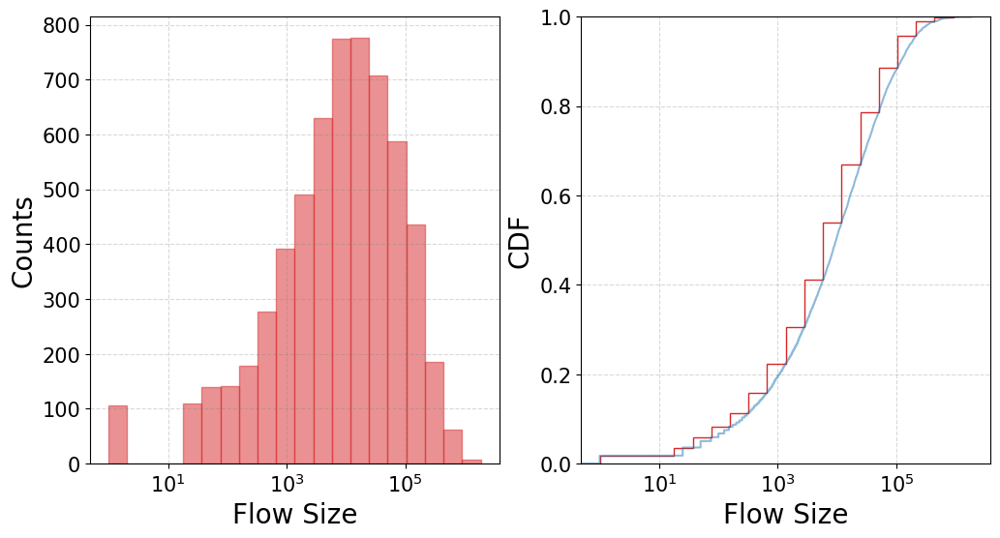

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(2.8381607641847495e-07), np.float64(0.836512409885807)), mean=np.float64(0.0014195724620770366), variance=np.float64(0.00016961789827191044), skewness=np.float64(47.9851479370127), kurtosis=np.float64(2895.3927332136573))


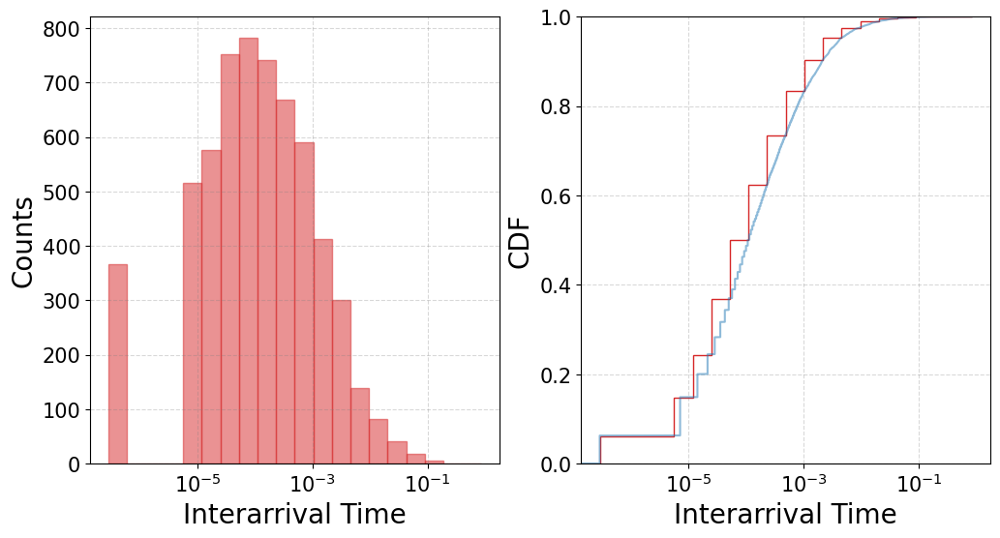

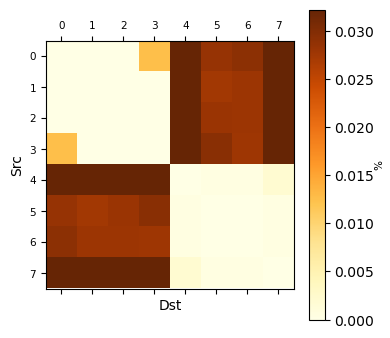

<Figure size 640x480 with 0 Axes>

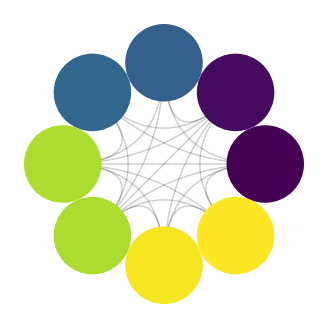

<Figure size 640x480 with 0 Axes>

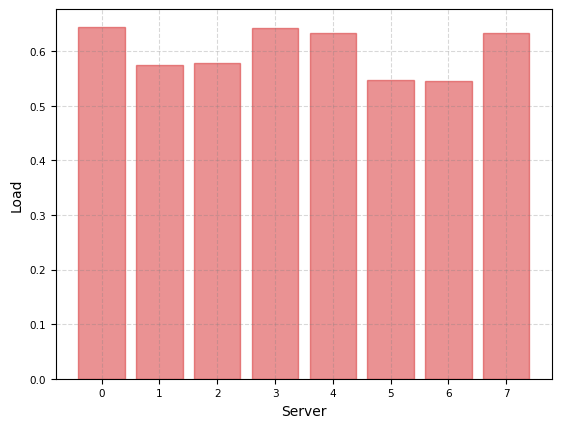

<Figure size 640x480 with 0 Axes>

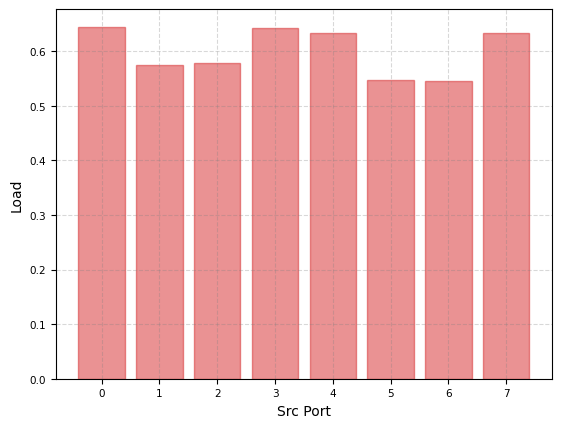

<Figure size 640x480 with 0 Axes>

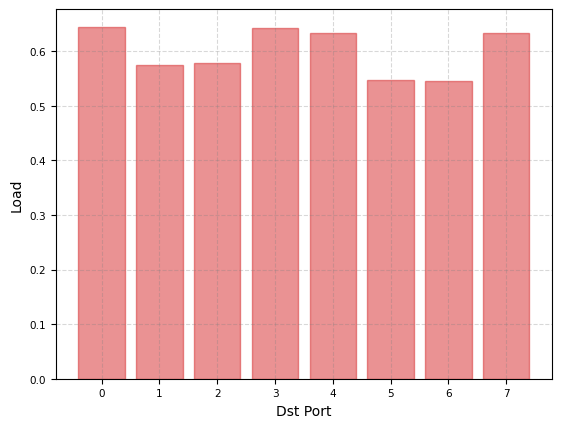



social_media_cloud | Network Load = 0.7
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(1854025.0)), mean=np.float64(42580.076), variance=np.float64(9139044247.309774), skewness=np.float64(6.268050679603705), kurtosis=np.float64(66.72612368104691))


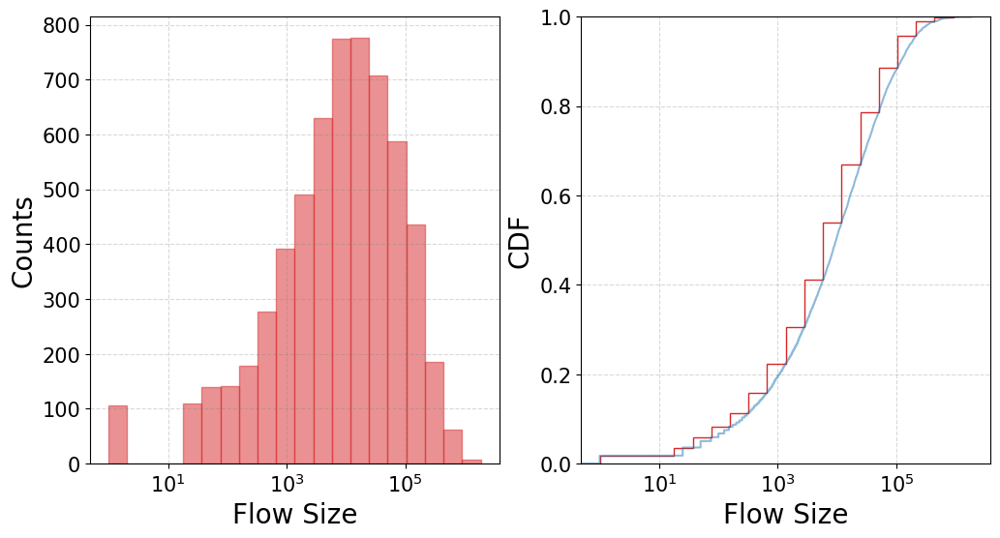

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(2.432709229616137e-07), np.float64(0.7170106370449774)), mean=np.float64(0.0012167763960659942), variance=np.float64(0.00012461723138344448), skewness=np.float64(47.98514793701264), kurtosis=np.float64(2895.3927332136527))


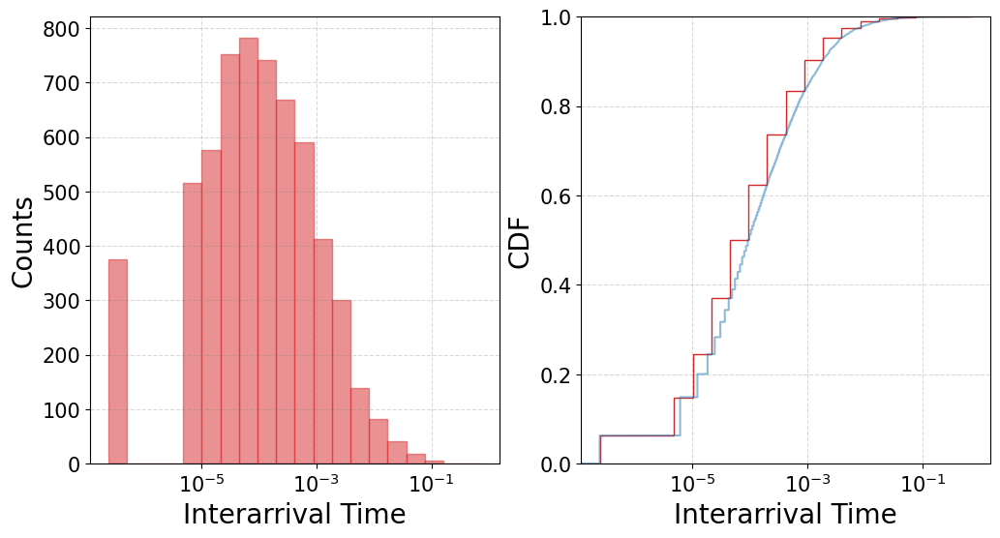

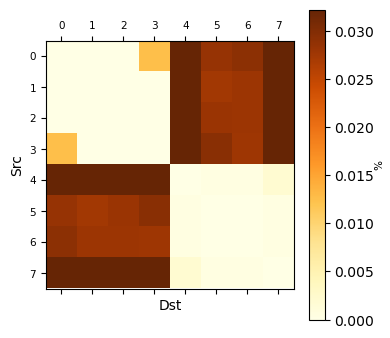

<Figure size 640x480 with 0 Axes>

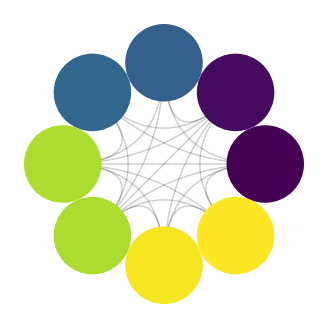

<Figure size 640x480 with 0 Axes>

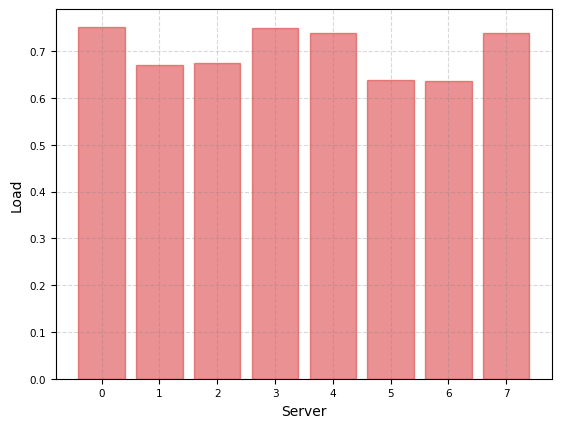

<Figure size 640x480 with 0 Axes>

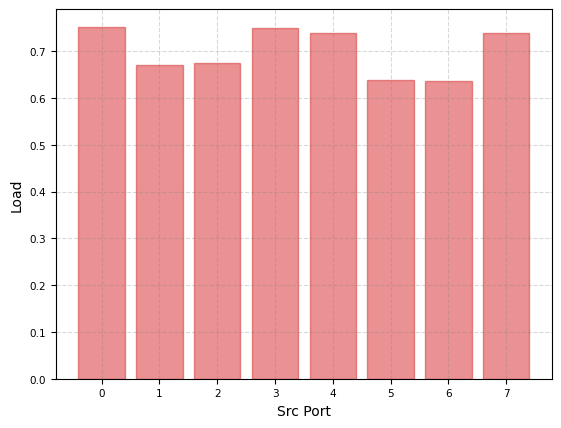

<Figure size 640x480 with 0 Axes>

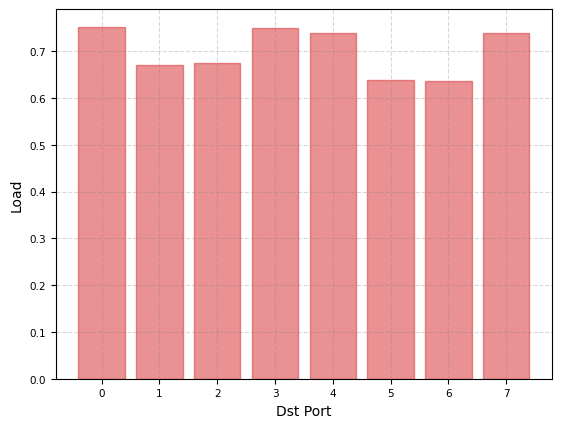



social_media_cloud | Network Load = 0.8
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(1854025.0)), mean=np.float64(42580.076), variance=np.float64(9139044247.309774), skewness=np.float64(6.268050679603705), kurtosis=np.float64(66.72612368104691))


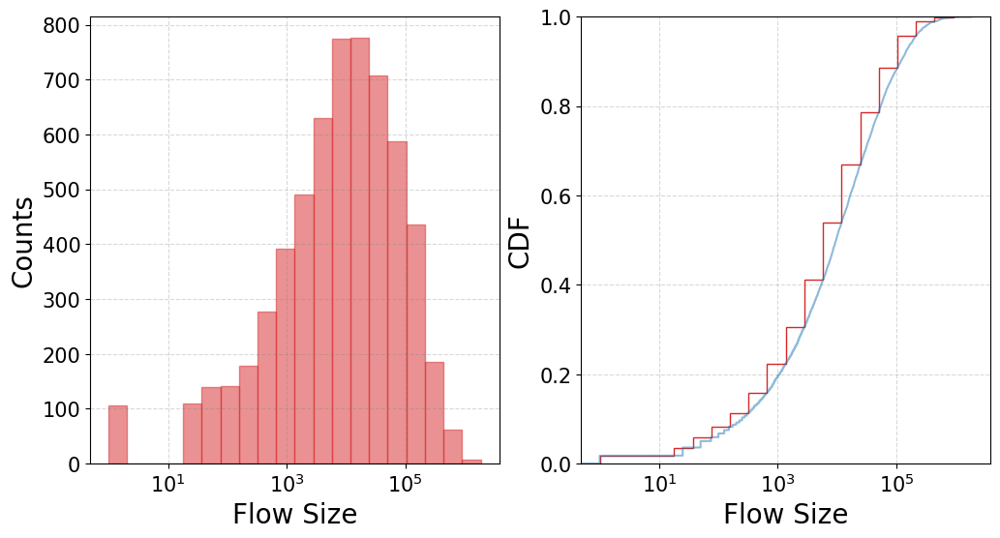

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(2.1286205773018985e-07), np.float64(0.627384307414355)), mean=np.float64(0.0010646793465577682), variance=np.float64(9.541006777794963e-05), skewness=np.float64(47.98514793701265), kurtosis=np.float64(2895.392733213652))


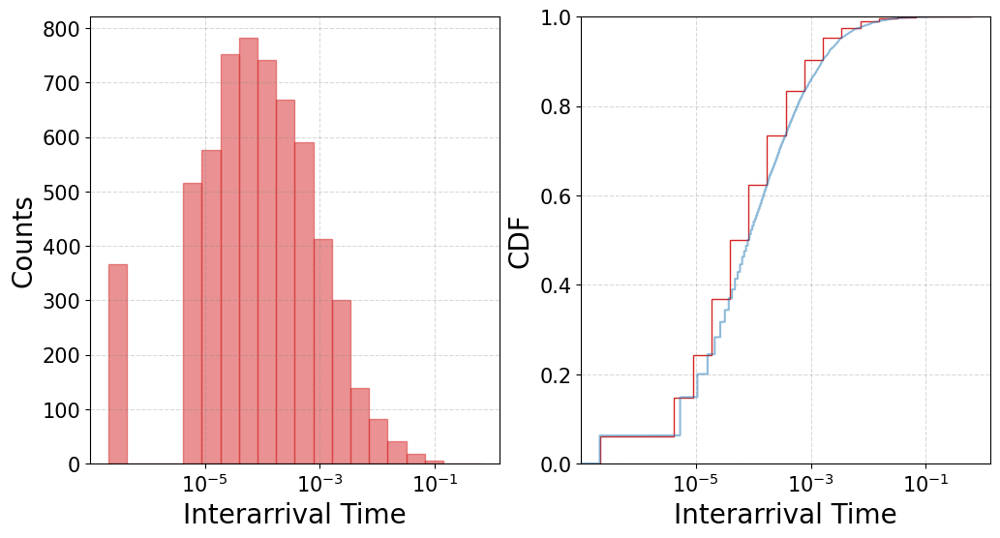

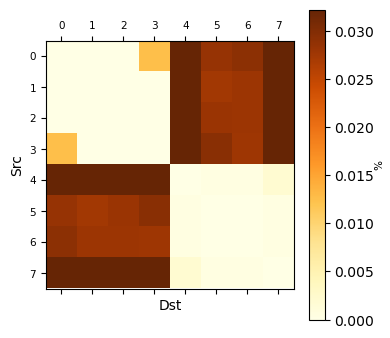

<Figure size 640x480 with 0 Axes>

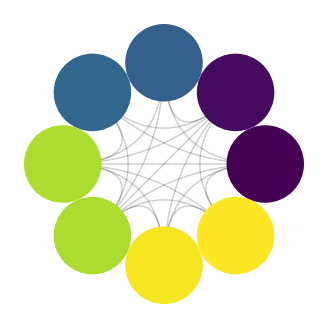

<Figure size 640x480 with 0 Axes>

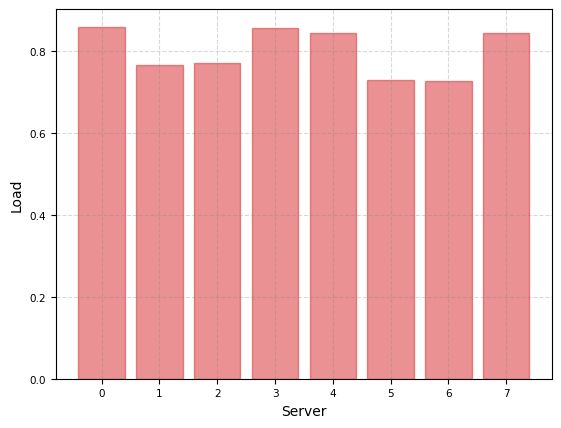

<Figure size 640x480 with 0 Axes>

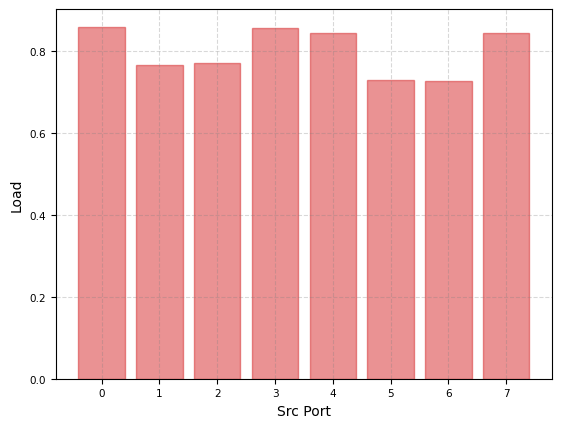

<Figure size 640x480 with 0 Axes>

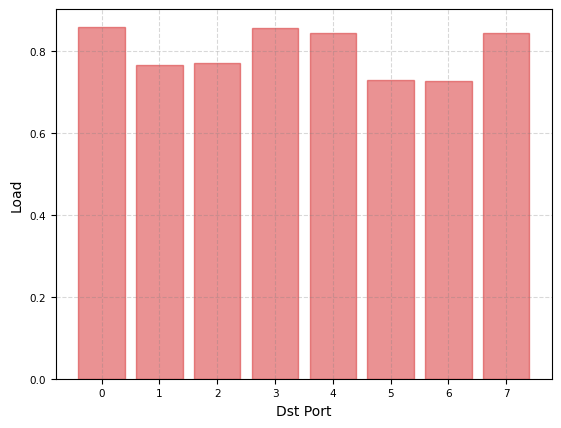



social_media_cloud | Network Load = 0.9
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(1854025.0)), mean=np.float64(42580.076), variance=np.float64(9139044247.309774), skewness=np.float64(6.268050679603705), kurtosis=np.float64(66.72612368104691))


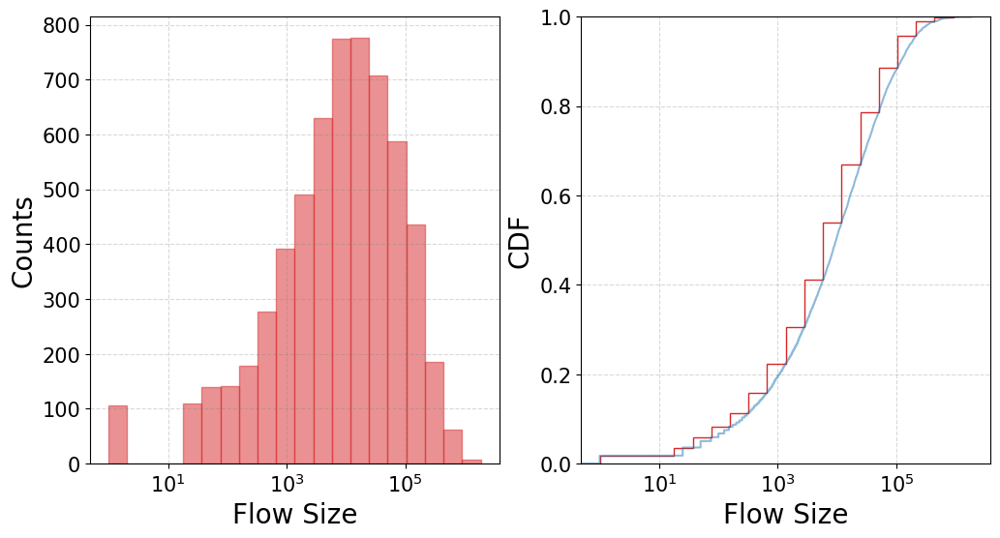

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.8921071798239097e-07), np.float64(0.5576749399238712)), mean=np.float64(0.000946381641384698), variance=np.float64(7.538573256529351e-05), skewness=np.float64(47.985147937012655), kurtosis=np.float64(2895.3927332136545))


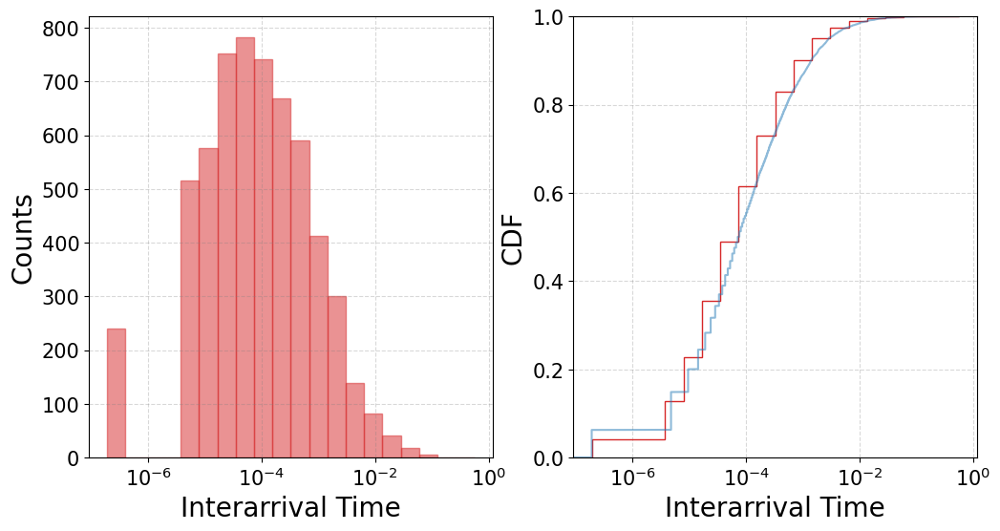

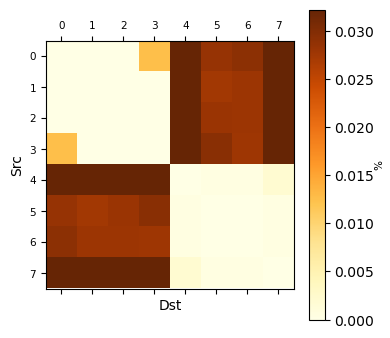

<Figure size 640x480 with 0 Axes>

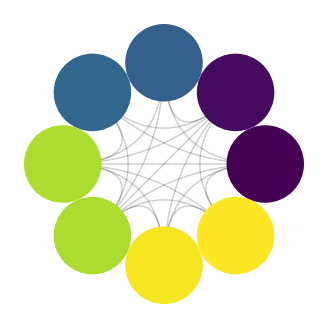

<Figure size 640x480 with 0 Axes>

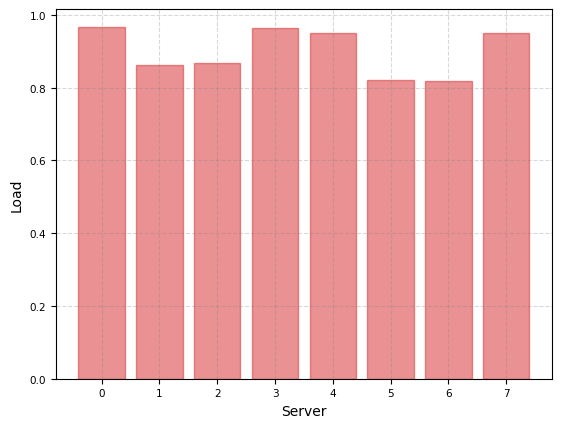

<Figure size 640x480 with 0 Axes>

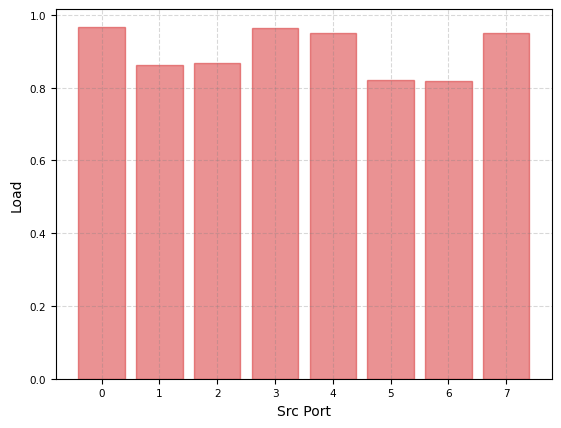

<Figure size 640x480 with 0 Axes>

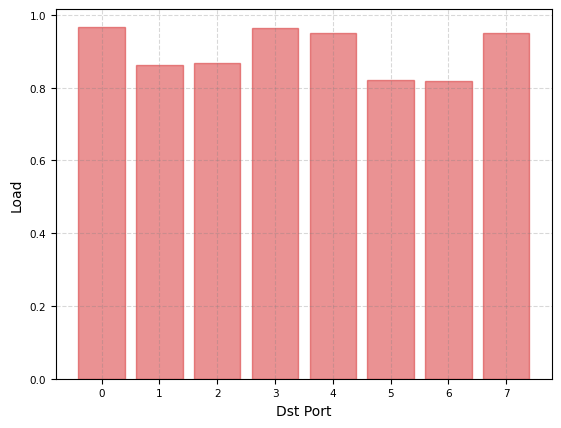



commercial_cloud | Network Load = 0.1
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(11173575.0)), mean=np.float64(26344.31166666667), variance=np.float64(60874807809.03937), skewness=np.float64(27.02827904991666), kurtosis=np.float64(942.0437386455678))


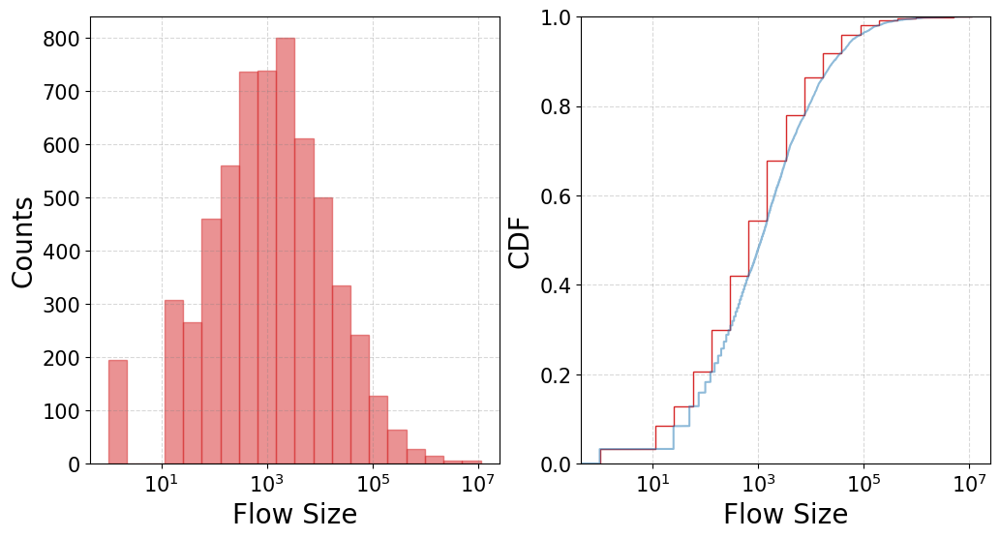

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(7.126724758244052e-05), np.float64(0.6995065418362607)), mean=np.float64(0.00526974062343707), variance=np.float64(0.0011889229263400195), skewness=np.float64(14.105909973456708), kurtosis=np.float64(216.01429890425052))


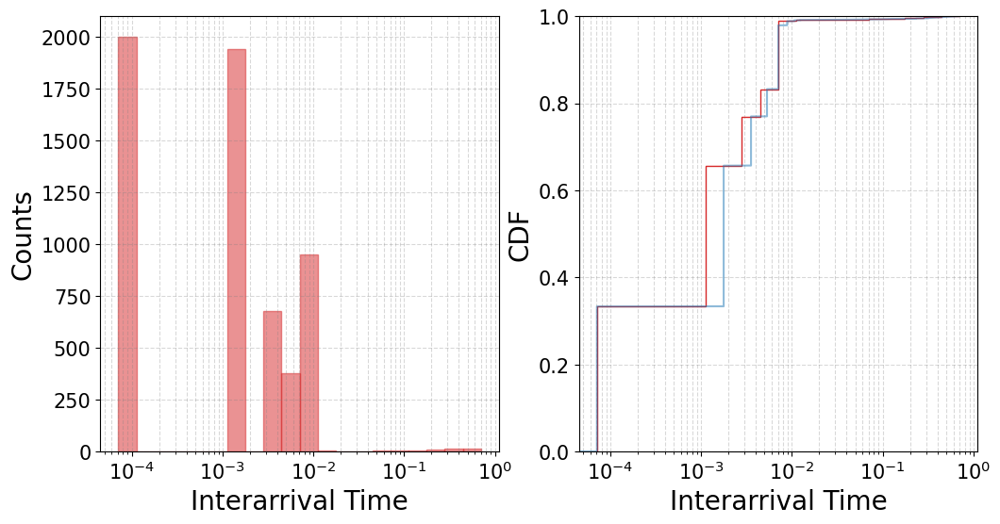

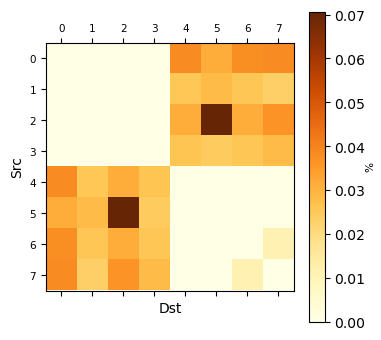

<Figure size 640x480 with 0 Axes>

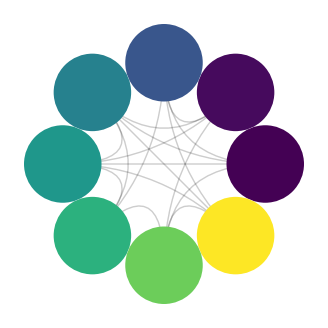

<Figure size 640x480 with 0 Axes>

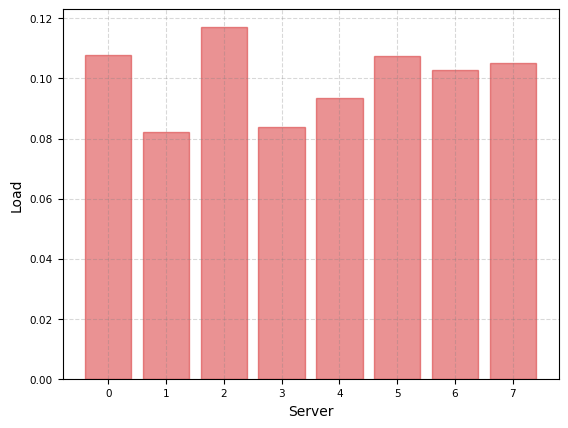

<Figure size 640x480 with 0 Axes>

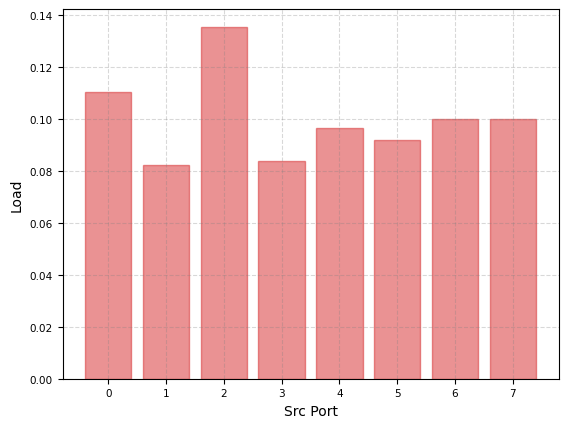

<Figure size 640x480 with 0 Axes>

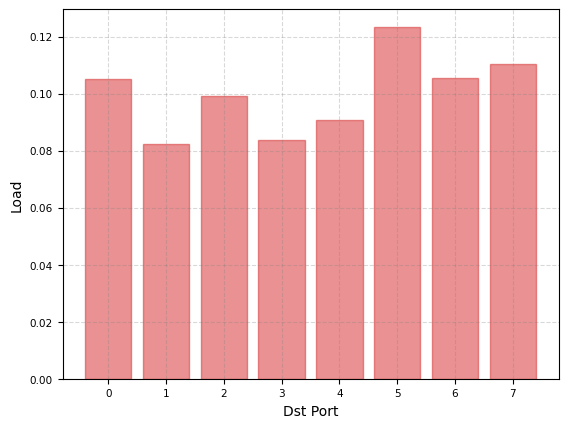



commercial_cloud | Network Load = 0.2
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(11173575.0)), mean=np.float64(26344.31166666667), variance=np.float64(60874807809.03937), skewness=np.float64(27.02827904991666), kurtosis=np.float64(942.0437386455678))


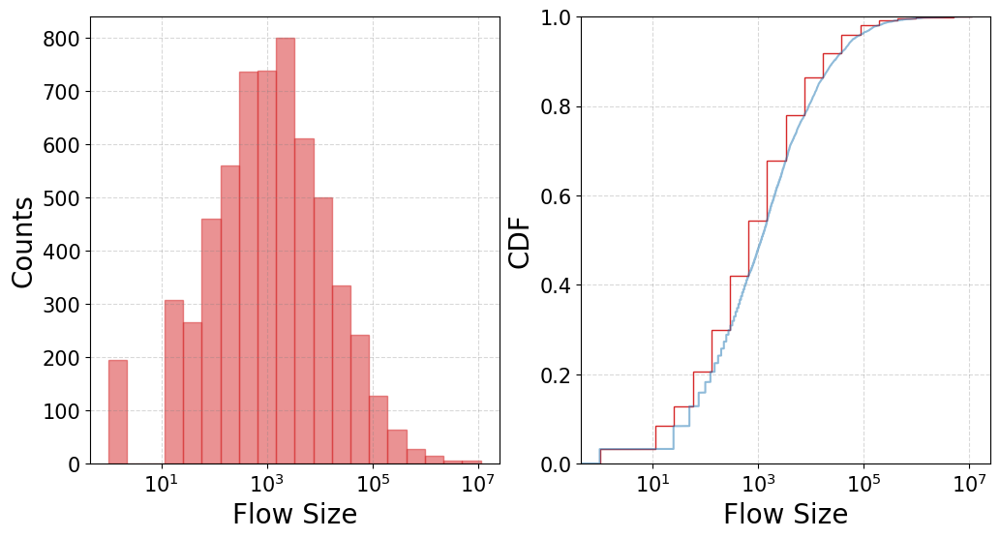

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(3.563362379122026e-05), np.float64(0.34975327091813035)), mean=np.float64(0.002634870311718535), variance=np.float64(0.00029723073158500487), skewness=np.float64(14.105909973456708), kurtosis=np.float64(216.01429890425052))


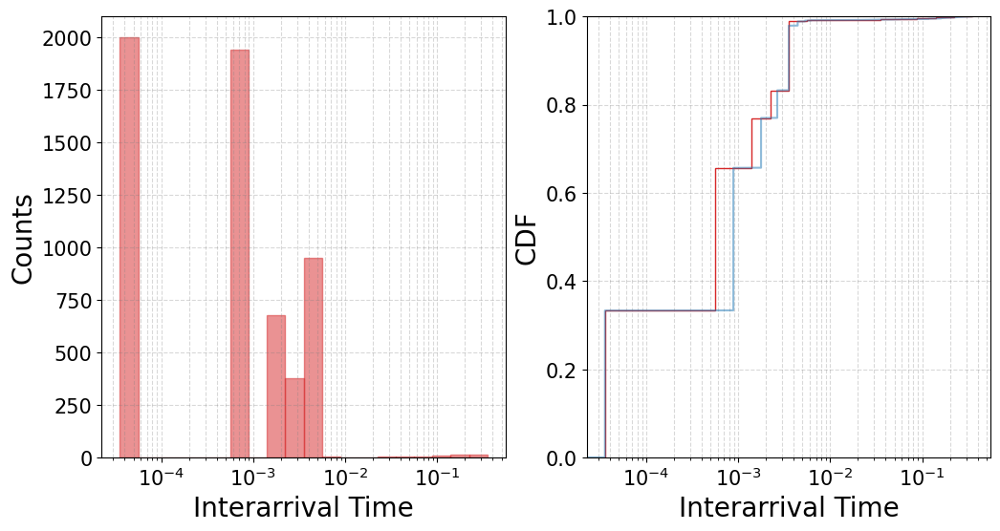

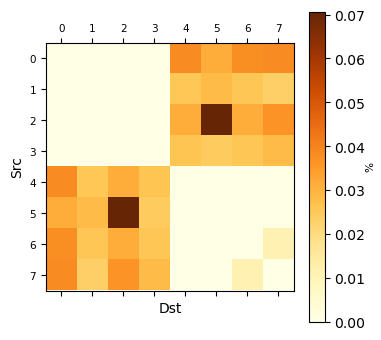

<Figure size 640x480 with 0 Axes>

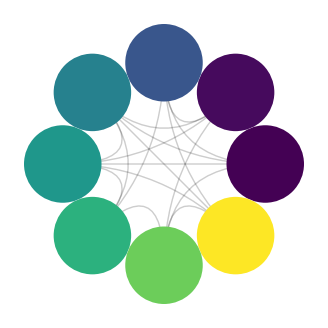

<Figure size 640x480 with 0 Axes>

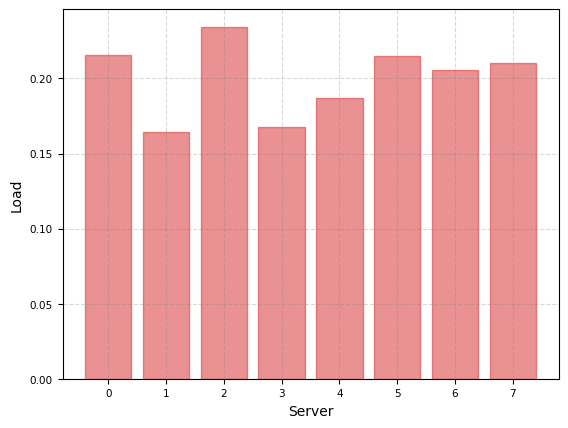

<Figure size 640x480 with 0 Axes>

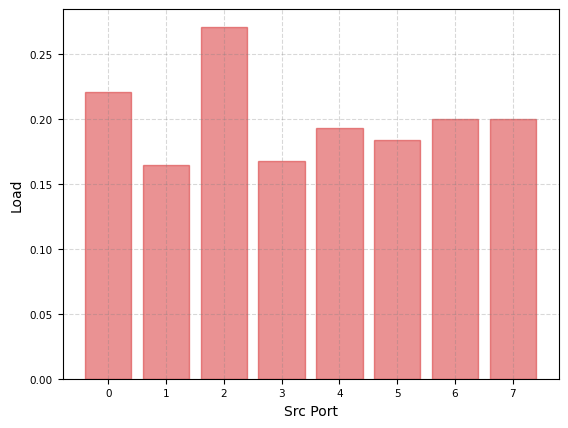

<Figure size 640x480 with 0 Axes>

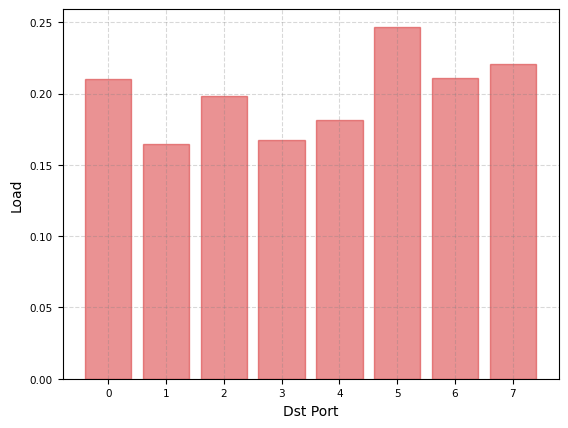



commercial_cloud | Network Load = 0.3
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(11173575.0)), mean=np.float64(26344.31166666667), variance=np.float64(60874807809.03937), skewness=np.float64(27.02827904991666), kurtosis=np.float64(942.0437386455678))


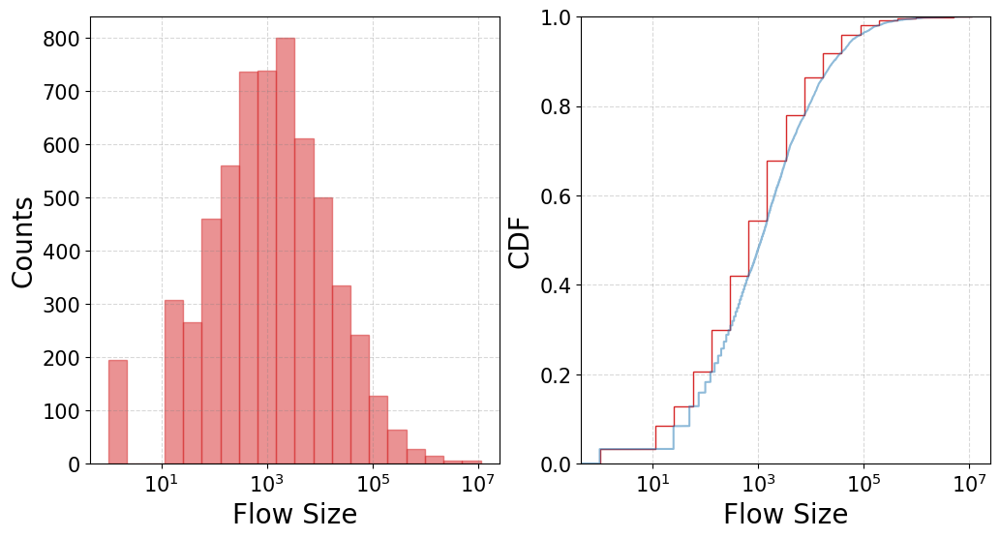

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(2.375574919355472e-05), np.float64(0.23316884727875298)), mean=np.float64(0.0017565802078123264), variance=np.float64(0.00013210254737111365), skewness=np.float64(14.105909973456654), kurtosis=np.float64(216.01429890424942))


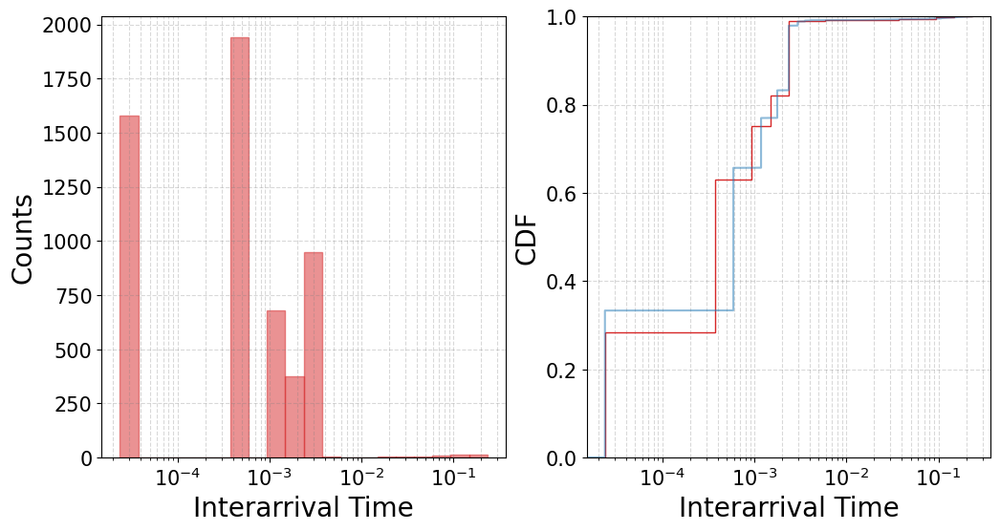

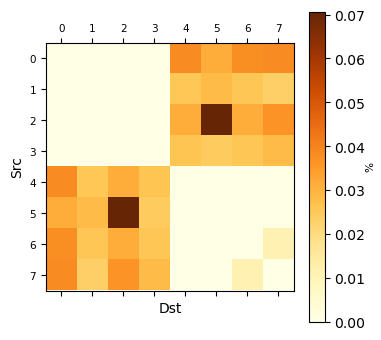

<Figure size 640x480 with 0 Axes>

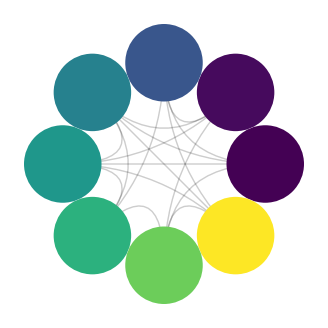

<Figure size 640x480 with 0 Axes>

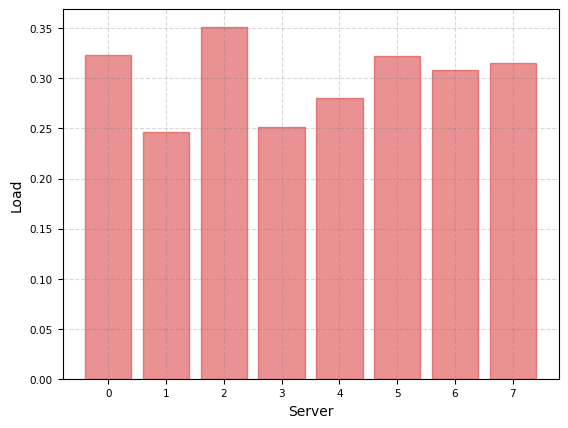

<Figure size 640x480 with 0 Axes>

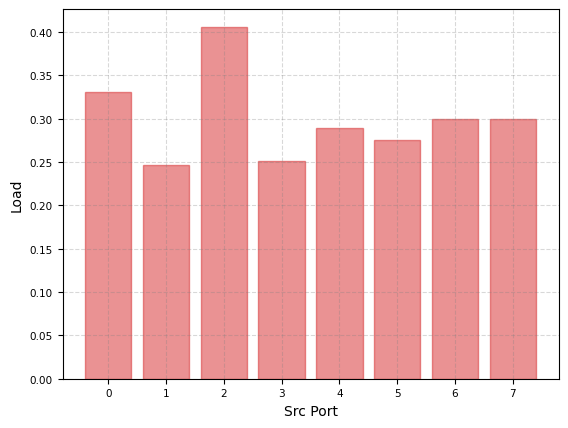

<Figure size 640x480 with 0 Axes>

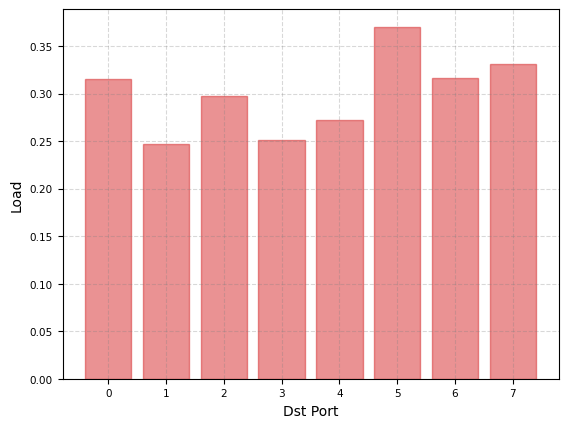



commercial_cloud | Network Load = 0.4
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(11173575.0)), mean=np.float64(26344.31166666667), variance=np.float64(60874807809.03937), skewness=np.float64(27.02827904991666), kurtosis=np.float64(942.0437386455678))


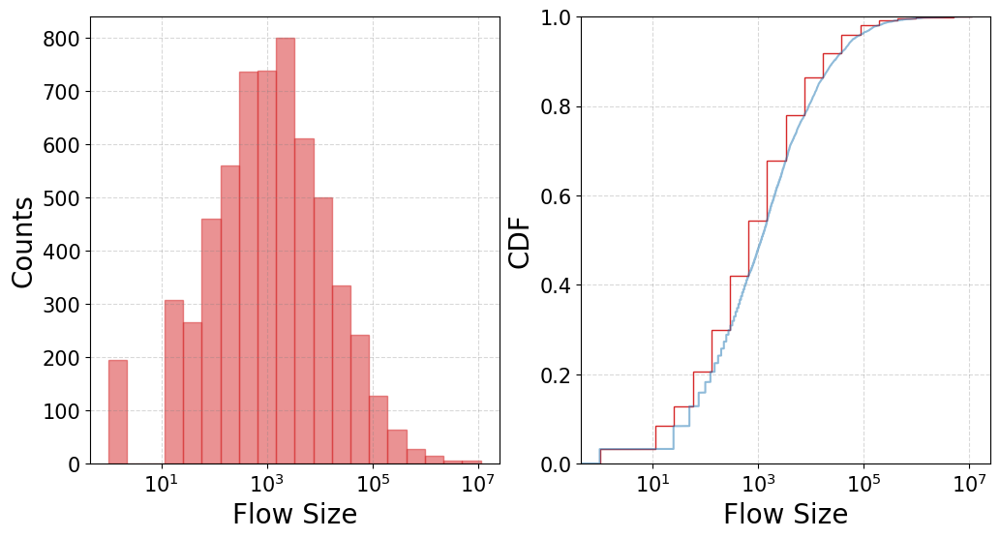

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.781681189561013e-05), np.float64(0.17487663545906518)), mean=np.float64(0.0013174351558592676), variance=np.float64(7.430768289625122e-05), skewness=np.float64(14.105909973456708), kurtosis=np.float64(216.01429890425052))


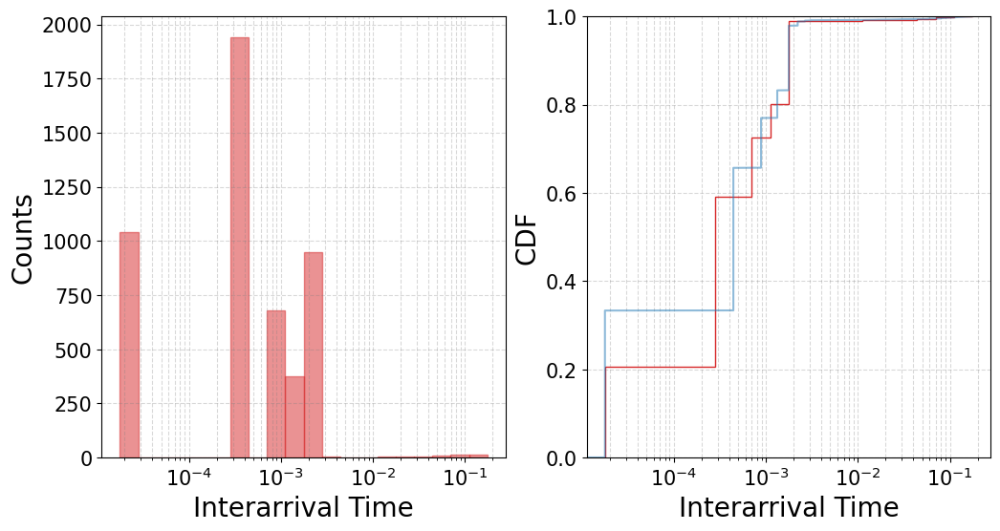

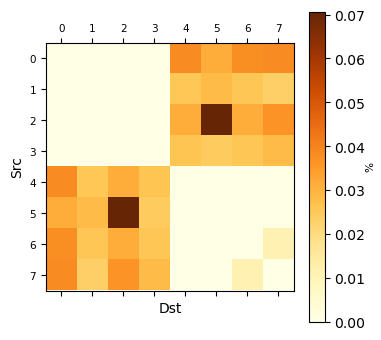

<Figure size 640x480 with 0 Axes>

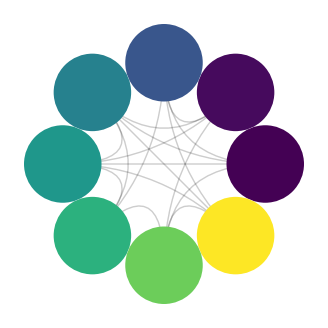

<Figure size 640x480 with 0 Axes>

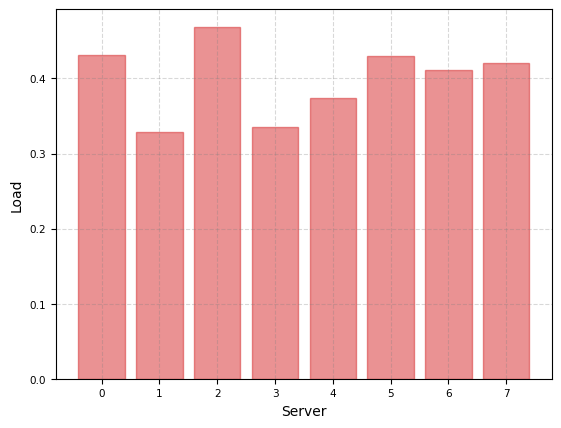

<Figure size 640x480 with 0 Axes>

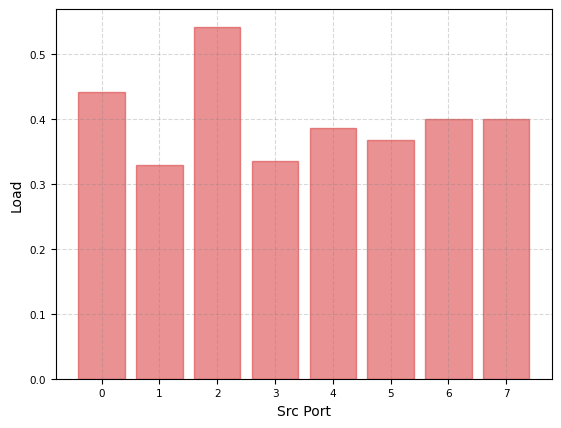

<Figure size 640x480 with 0 Axes>

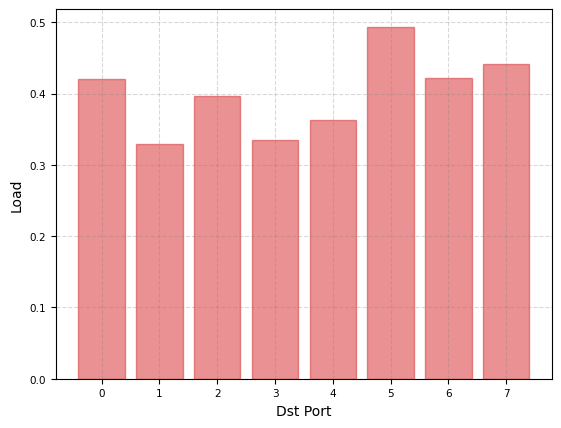



commercial_cloud | Network Load = 0.5
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(11173575.0)), mean=np.float64(26344.31166666667), variance=np.float64(60874807809.03937), skewness=np.float64(27.02827904991666), kurtosis=np.float64(942.0437386455678))


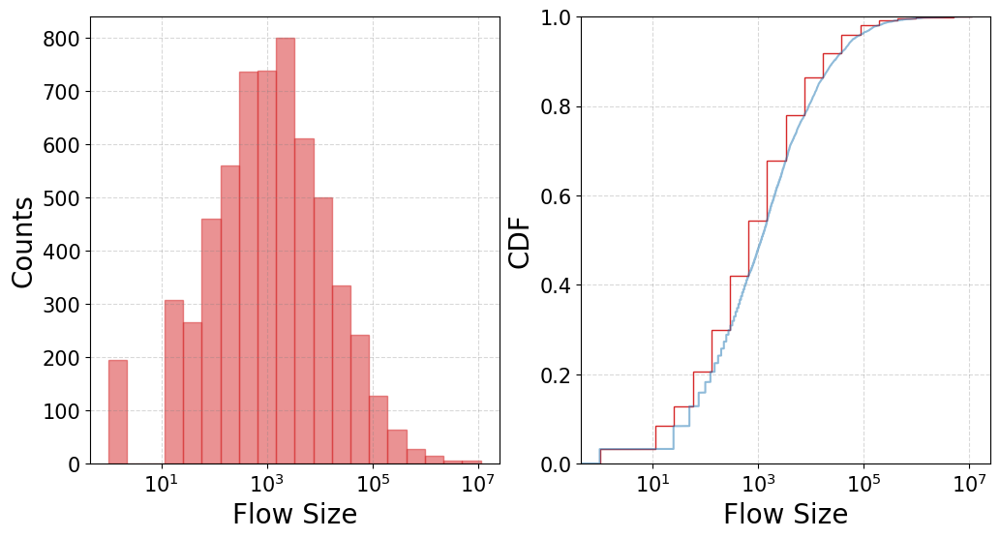

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.4253449516443695e-05), np.float64(0.1399013083672518)), mean=np.float64(0.001053948124687448), variance=np.float64(4.755691705360075e-05), skewness=np.float64(14.105909973456683), kurtosis=np.float64(216.01429890425013))


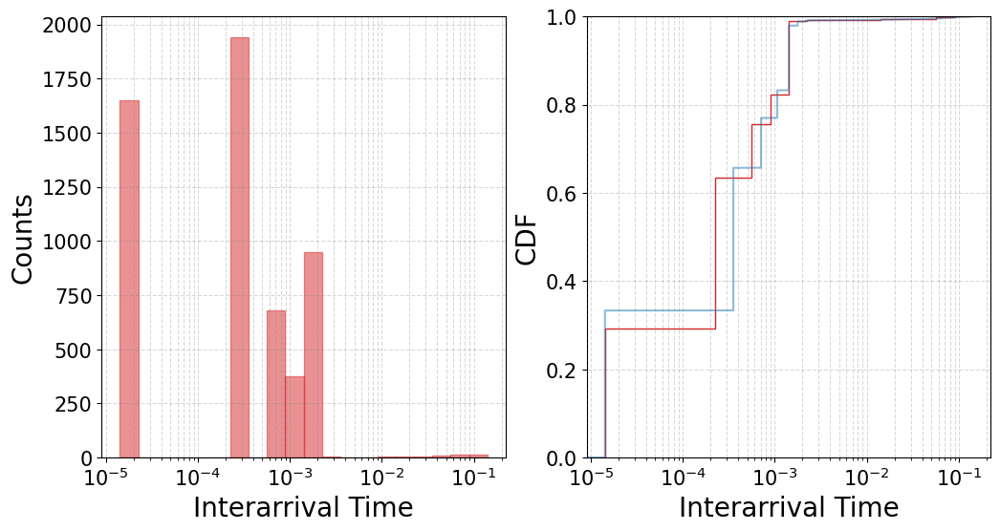

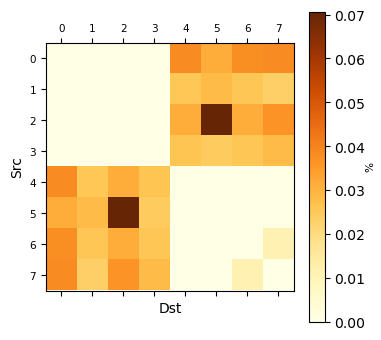

<Figure size 640x480 with 0 Axes>

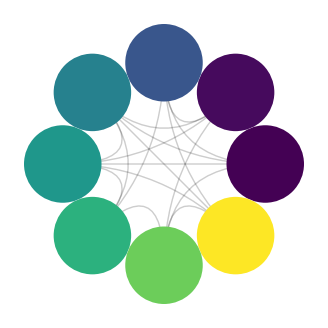

<Figure size 640x480 with 0 Axes>

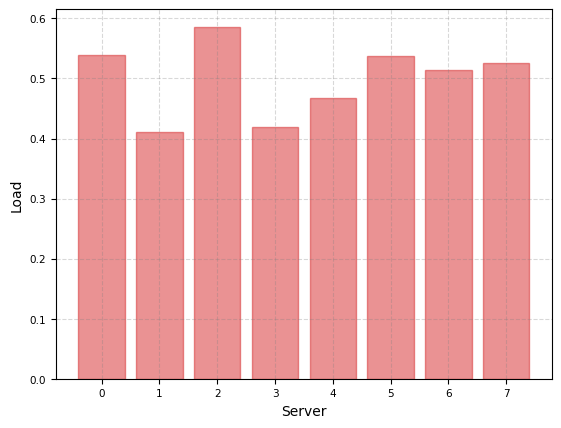

<Figure size 640x480 with 0 Axes>

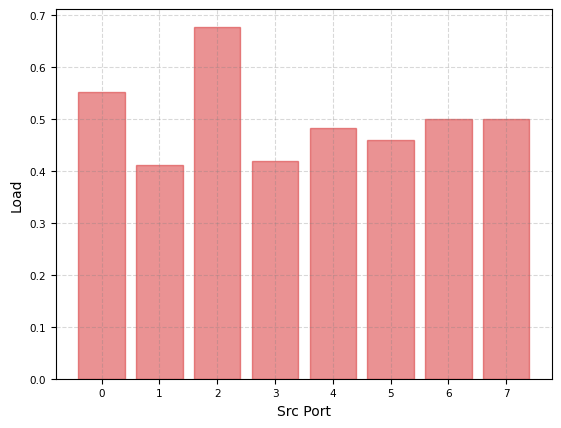

<Figure size 640x480 with 0 Axes>

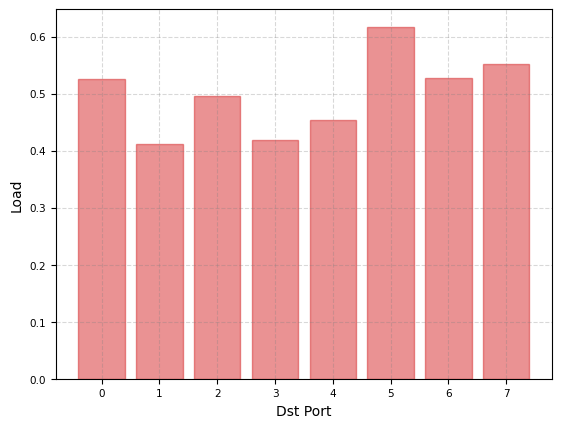



commercial_cloud | Network Load = 0.6
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(11173575.0)), mean=np.float64(26344.31166666667), variance=np.float64(60874807809.03937), skewness=np.float64(27.02827904991666), kurtosis=np.float64(942.0437386455678))


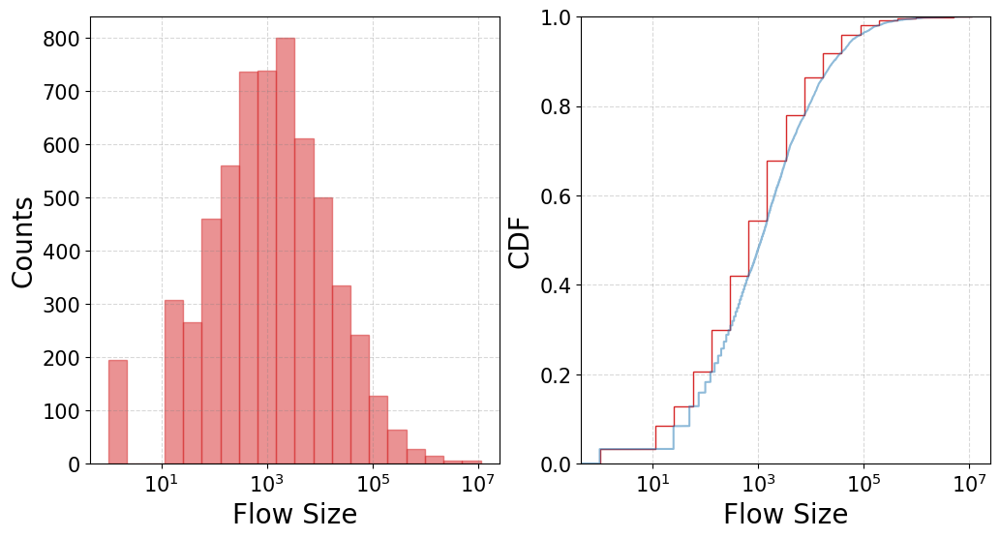

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.187787459677736e-05), np.float64(0.11658442363937649)), mean=np.float64(0.0008782901039061632), variance=np.float64(3.302563684277841e-05), skewness=np.float64(14.105909973456654), kurtosis=np.float64(216.01429890424942))


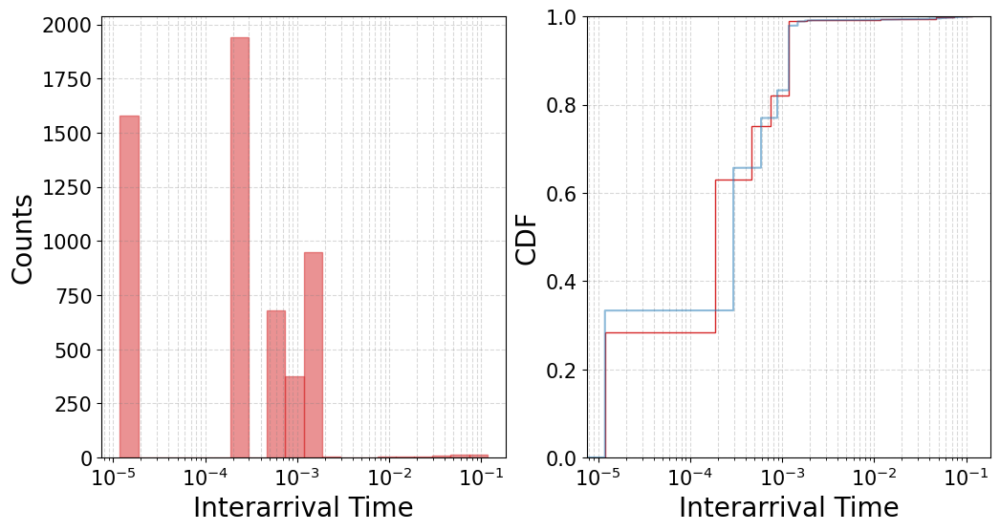

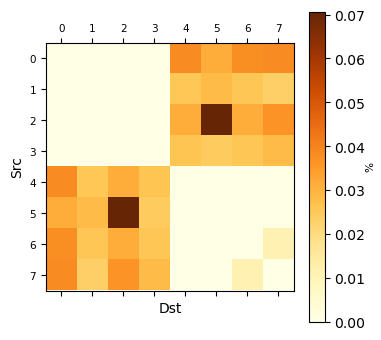

<Figure size 640x480 with 0 Axes>

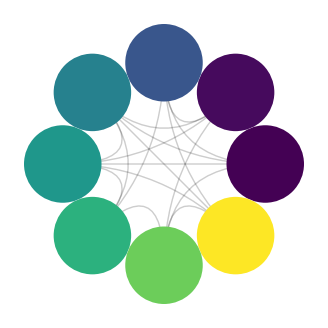

<Figure size 640x480 with 0 Axes>

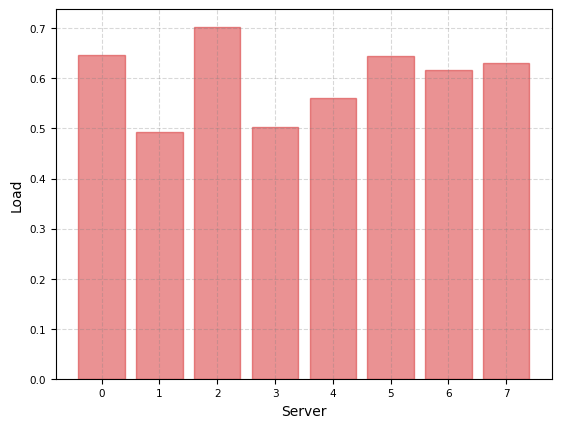

<Figure size 640x480 with 0 Axes>

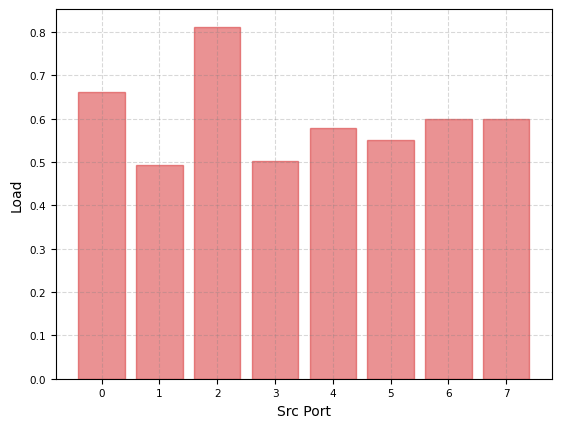

<Figure size 640x480 with 0 Axes>

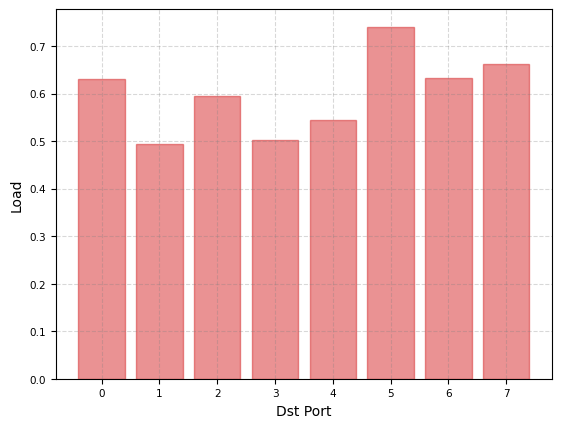



commercial_cloud | Network Load = 0.7
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(11173575.0)), mean=np.float64(26344.31166666667), variance=np.float64(60874807809.03937), skewness=np.float64(27.02827904991666), kurtosis=np.float64(942.0437386455678))


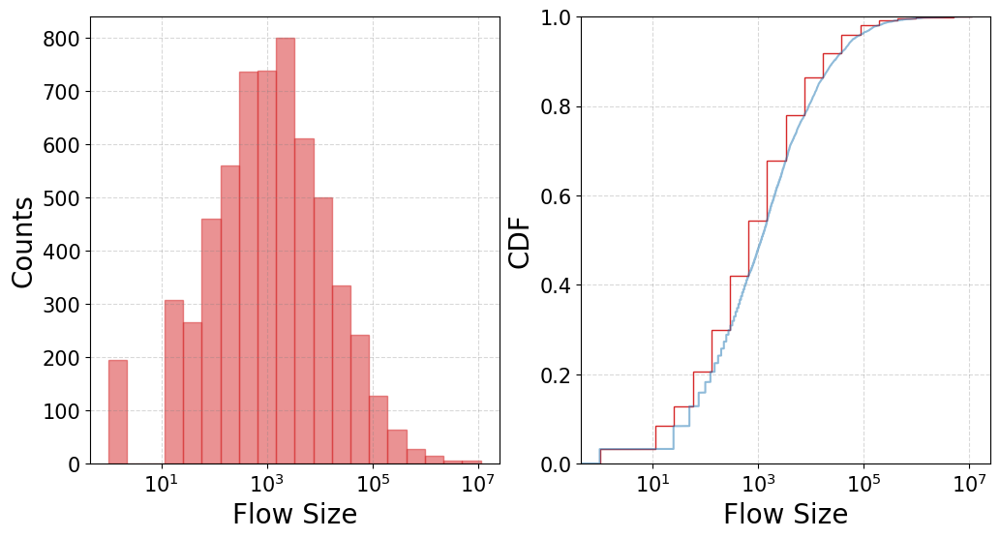

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.0181035368539426e-05), np.float64(0.09992950597660855)), mean=np.float64(0.0007528200890624371), variance=np.float64(2.4263733190612693e-05), skewness=np.float64(14.105909973456662), kurtosis=np.float64(216.01429890424956))


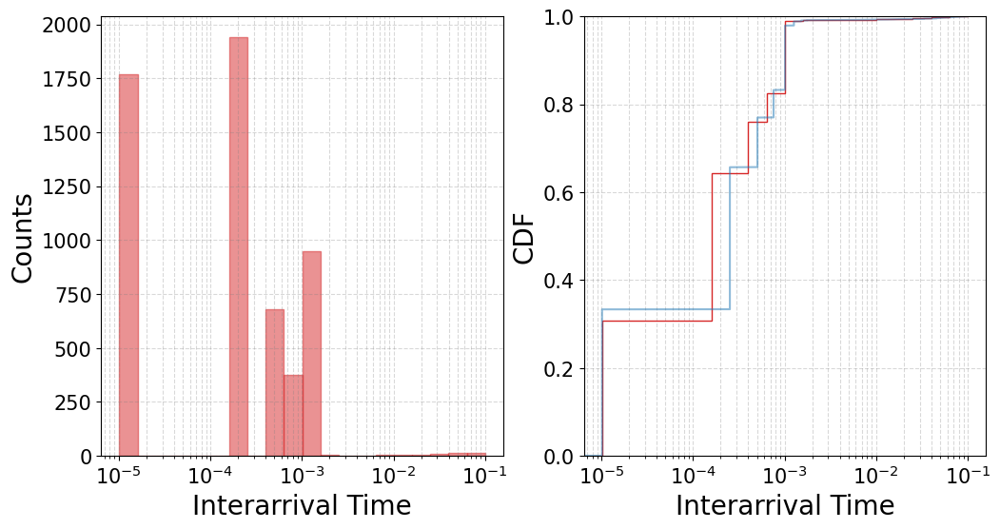

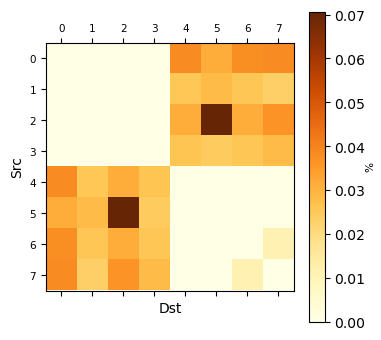

<Figure size 640x480 with 0 Axes>

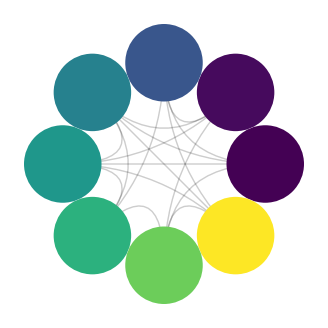

<Figure size 640x480 with 0 Axes>

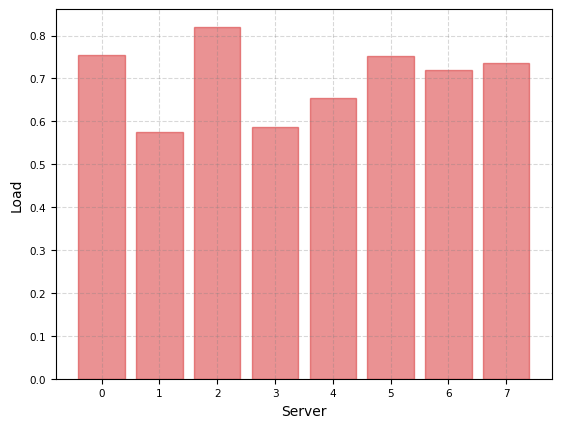

<Figure size 640x480 with 0 Axes>

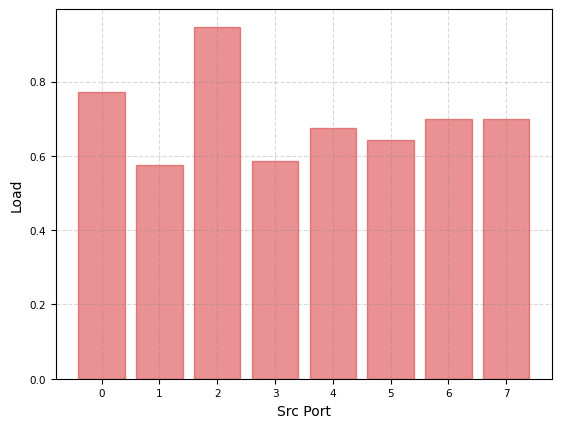

<Figure size 640x480 with 0 Axes>

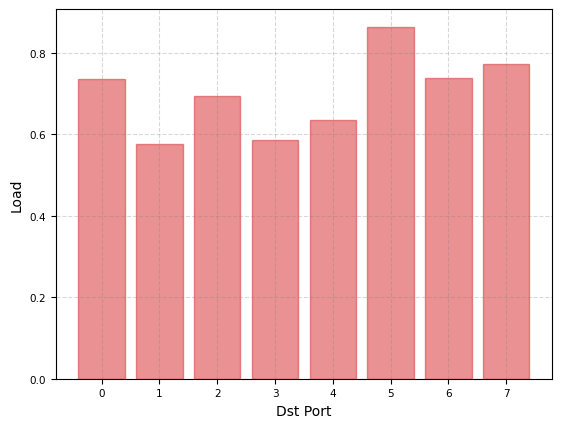



commercial_cloud | Network Load = 0.8
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(11173575.0)), mean=np.float64(26344.31166666667), variance=np.float64(60874807809.03937), skewness=np.float64(27.02827904991666), kurtosis=np.float64(942.0437386455678))


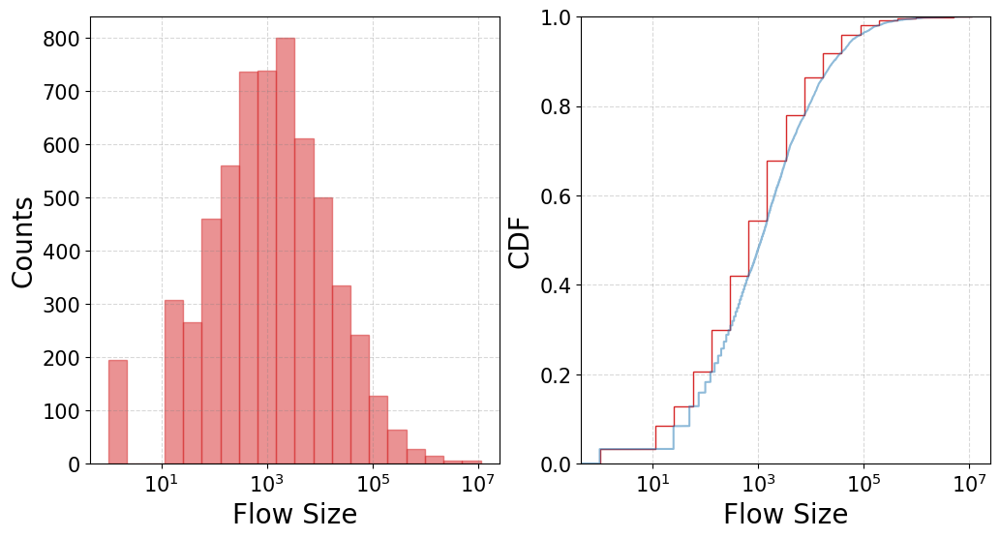

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(8.908405947805065e-06), np.float64(0.08743831772953259)), mean=np.float64(0.0006587175779296338), variance=np.float64(1.8576920724062804e-05), skewness=np.float64(14.105909973456708), kurtosis=np.float64(216.01429890425052))


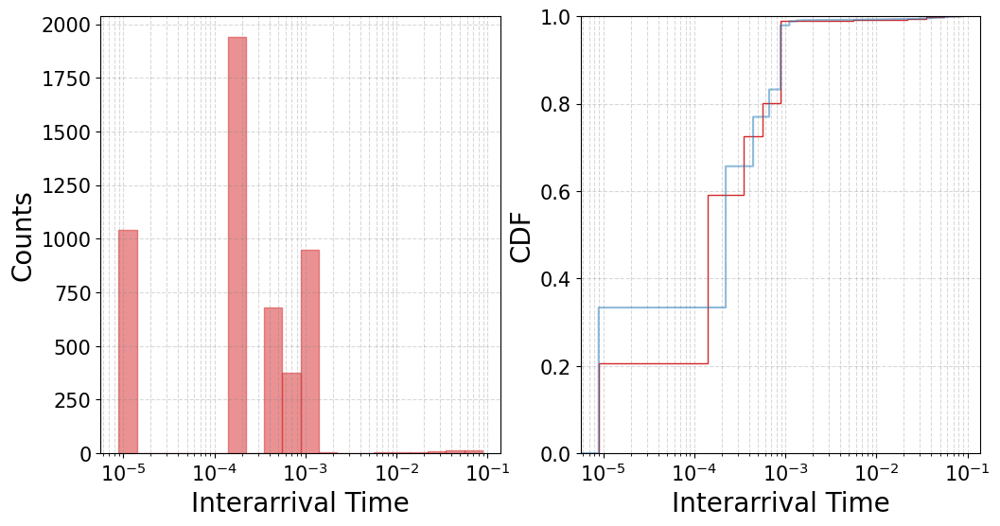

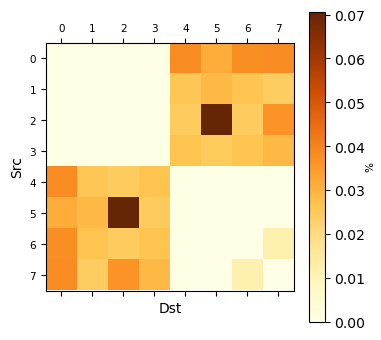

<Figure size 640x480 with 0 Axes>

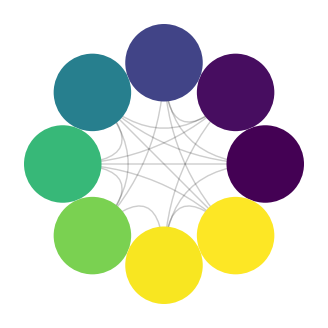

<Figure size 640x480 with 0 Axes>

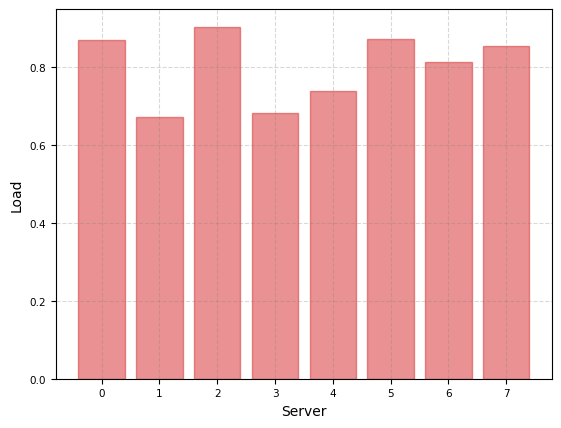

<Figure size 640x480 with 0 Axes>

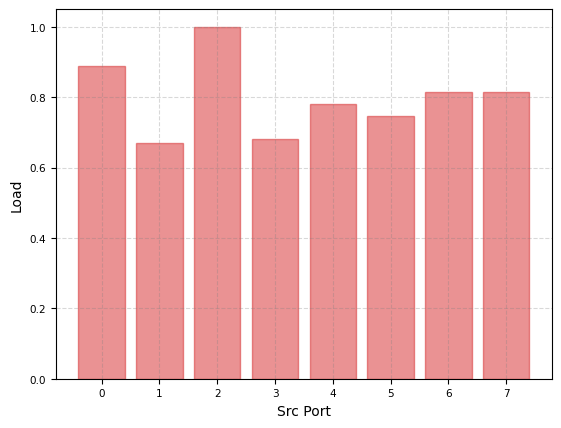

<Figure size 640x480 with 0 Axes>

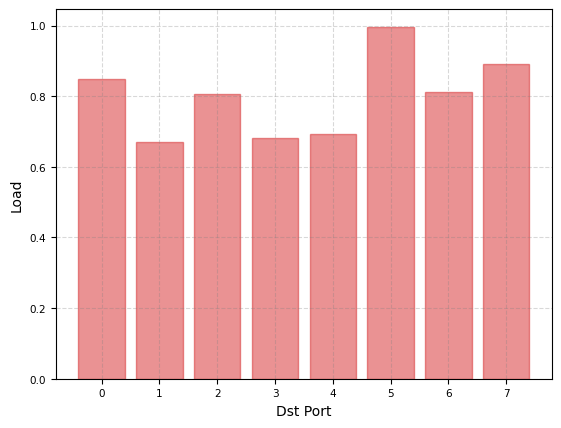



commercial_cloud | Network Load = 0.9
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(11173575.0)), mean=np.float64(26344.31166666667), variance=np.float64(60874807809.03937), skewness=np.float64(27.02827904991666), kurtosis=np.float64(942.0437386455678))


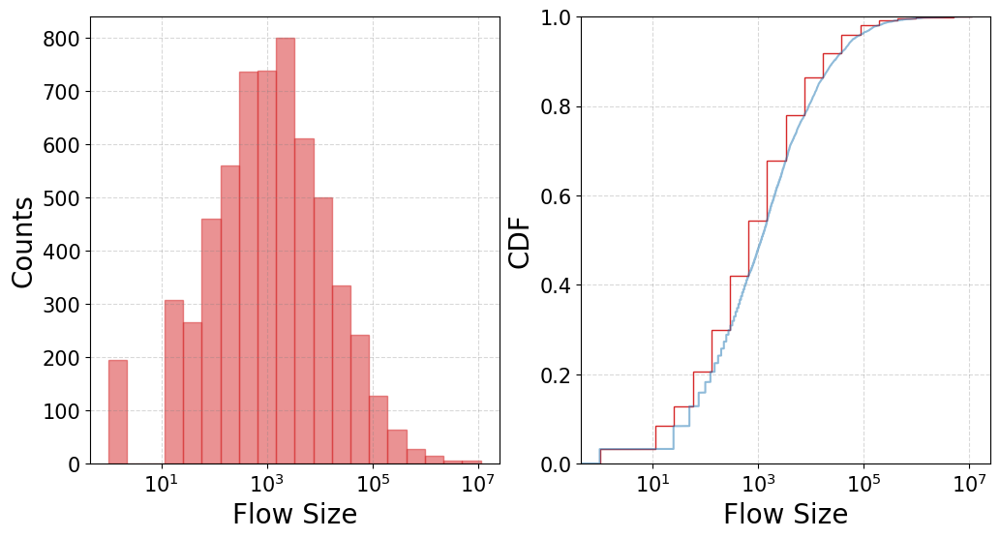

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(7.918583064703277e-06), np.float64(0.07772294909291766)), mean=np.float64(0.0005855267359374887), variance=np.float64(1.4678060819012574e-05), skewness=np.float64(14.105909973456681), kurtosis=np.float64(216.01429890424998))


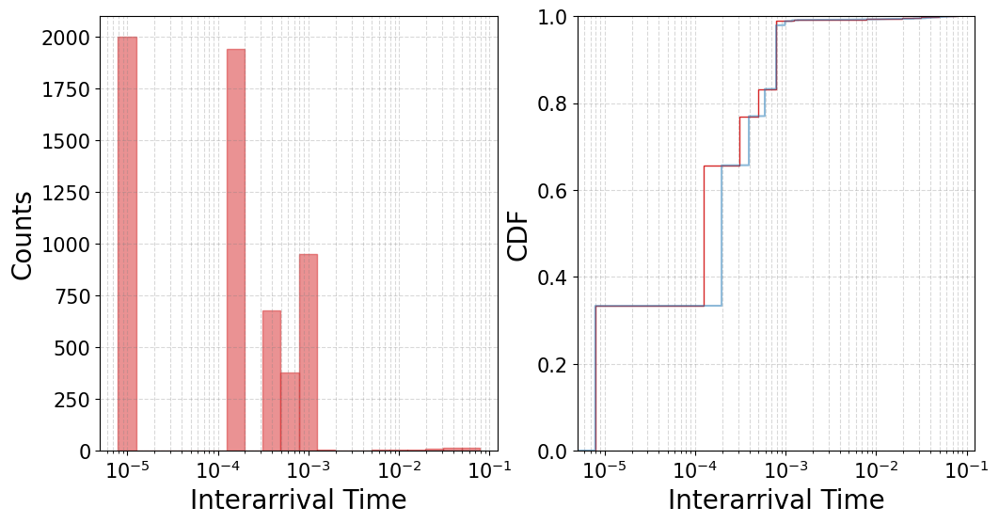

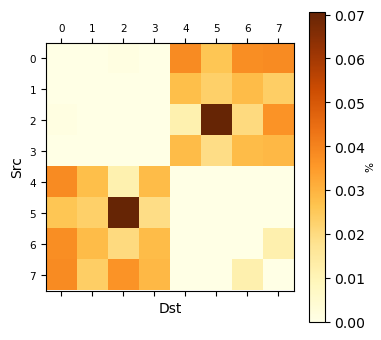

<Figure size 640x480 with 0 Axes>

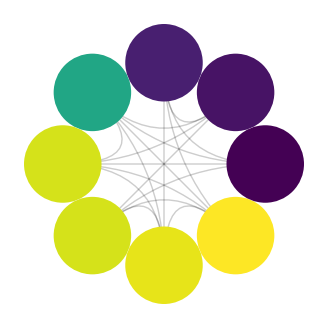

<Figure size 640x480 with 0 Axes>

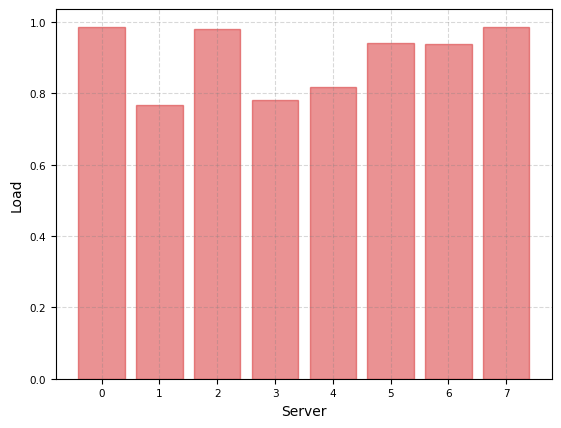

<Figure size 640x480 with 0 Axes>

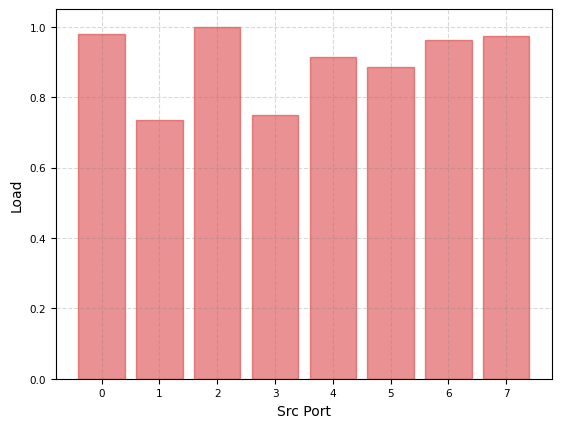

<Figure size 640x480 with 0 Axes>

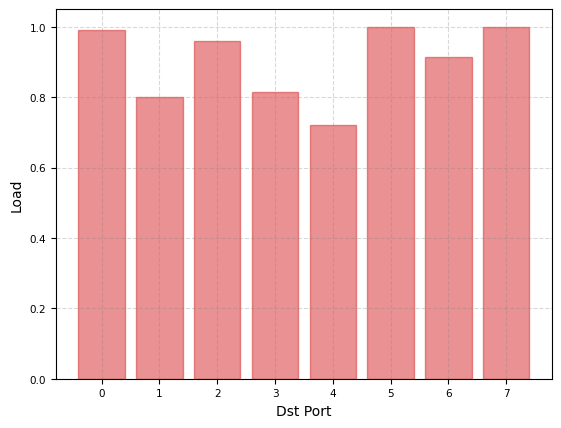



university | Network Load = 0.1
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(7854275.0)), mean=np.float64(22042.866), variance=np.float64(28399977556.88152), skewness=np.float64(29.00212729539957), kurtosis=np.float64(1139.2277235743672))


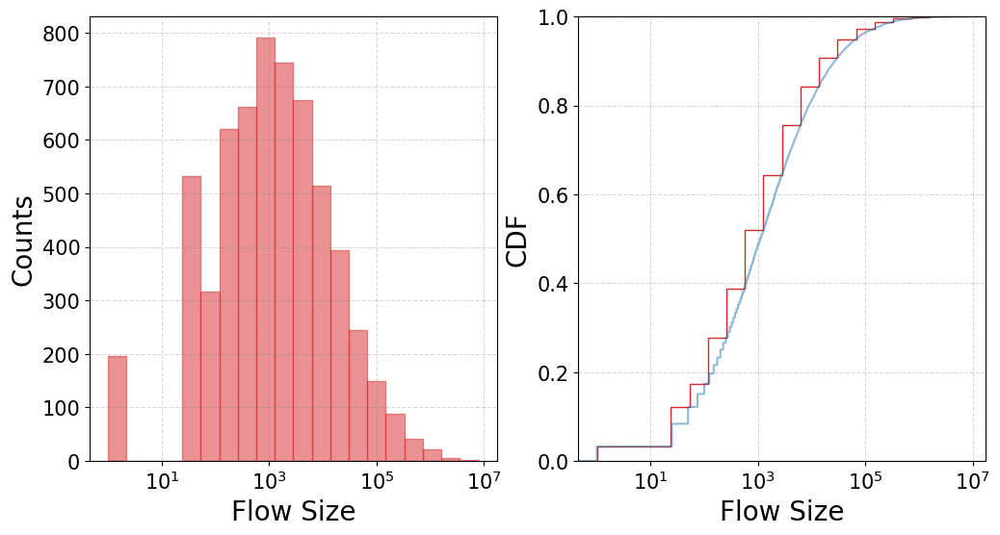

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(7.113719142637365e-07), np.float64(0.04787532994390986)), mean=np.float64(0.004409308084680771), variance=np.float64(2.436094359744568e-05), skewness=np.float64(2.413099039415663), kurtosis=np.float64(8.856770977235616))


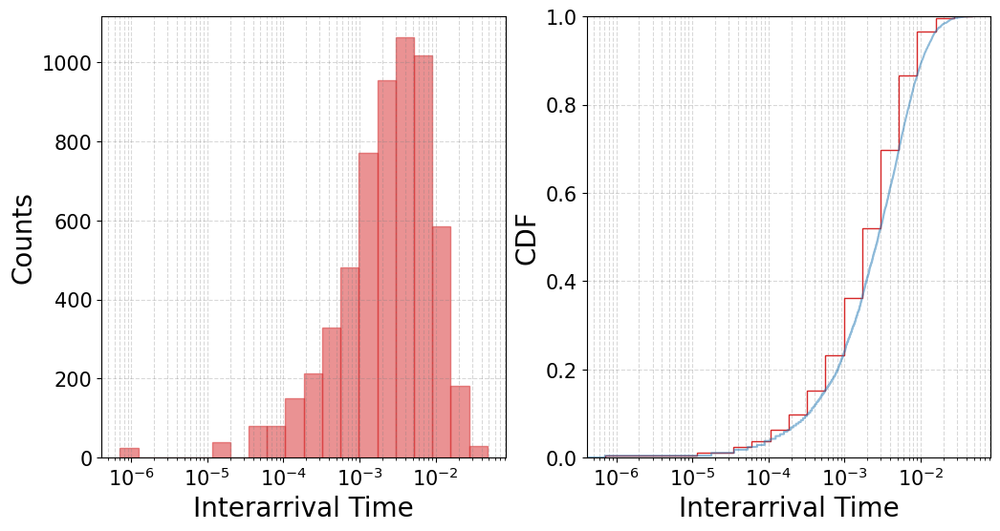

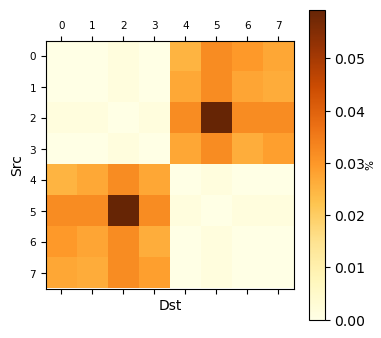

<Figure size 640x480 with 0 Axes>

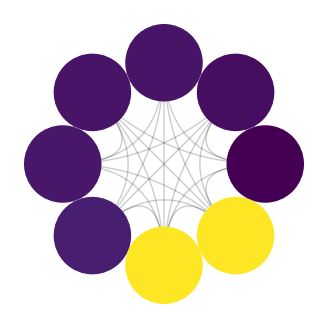

<Figure size 640x480 with 0 Axes>

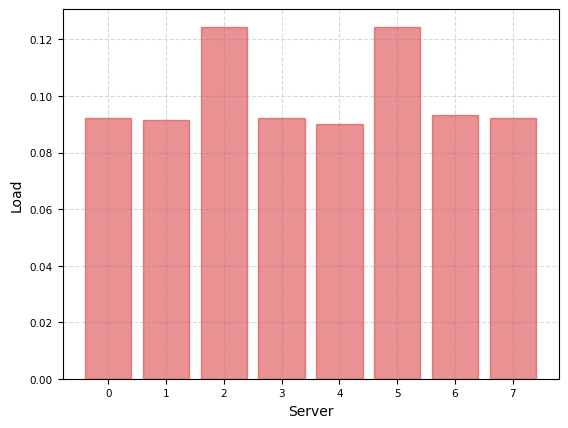

<Figure size 640x480 with 0 Axes>

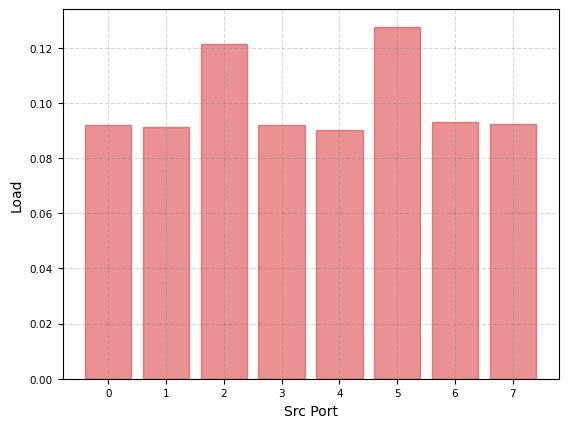

<Figure size 640x480 with 0 Axes>

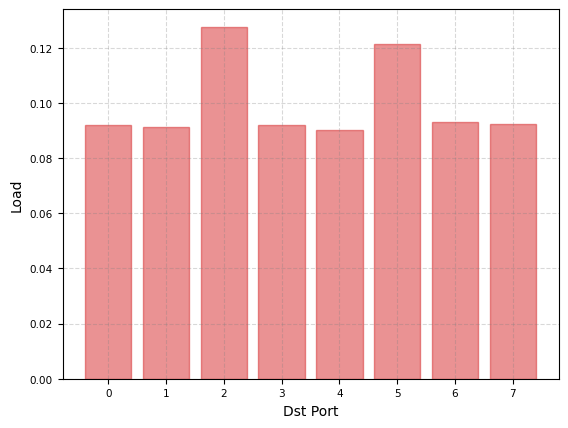



university | Network Load = 0.2
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(7854275.0)), mean=np.float64(22042.866), variance=np.float64(28399977556.88152), skewness=np.float64(29.00212729539957), kurtosis=np.float64(1139.2277235743672))


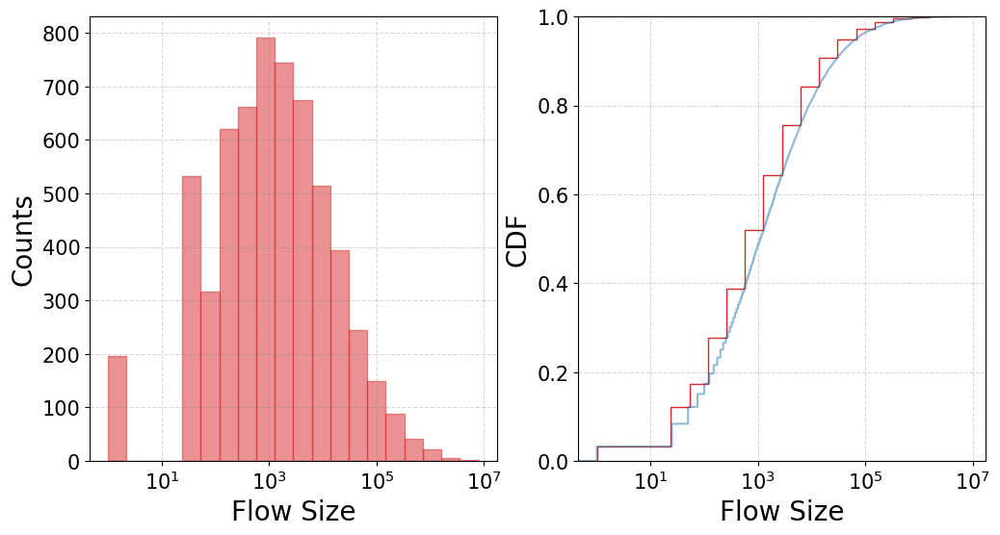

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(3.5568595713186824e-07), np.float64(0.02393766497195493)), mean=np.float64(0.0022046540423403854), variance=np.float64(6.09023589936142e-06), skewness=np.float64(2.413099039415663), kurtosis=np.float64(8.856770977235616))


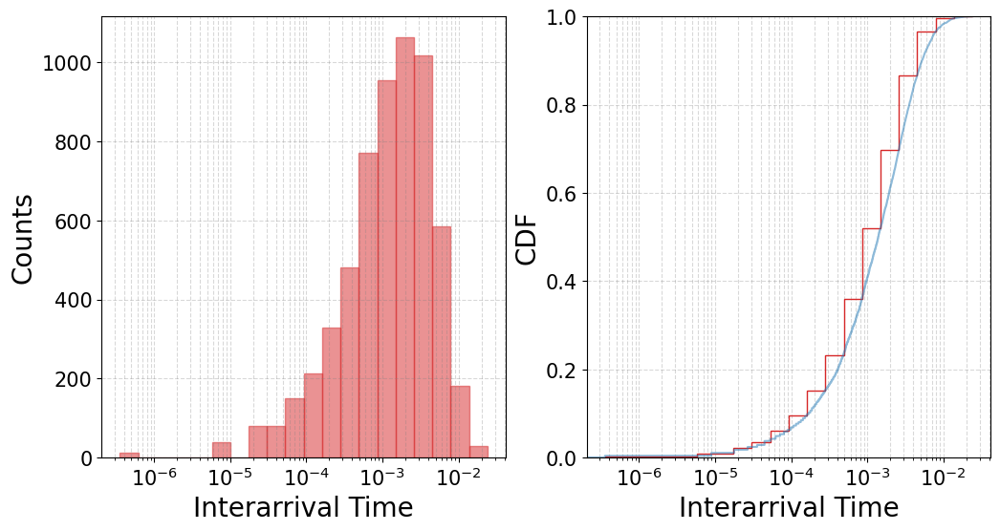

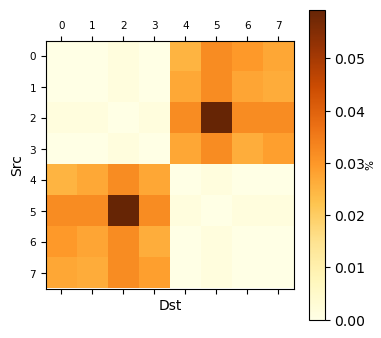

<Figure size 640x480 with 0 Axes>

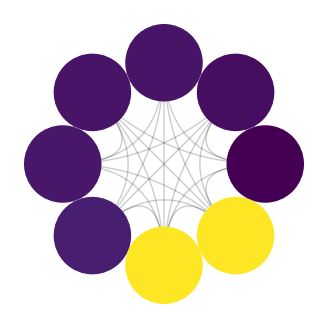

<Figure size 640x480 with 0 Axes>

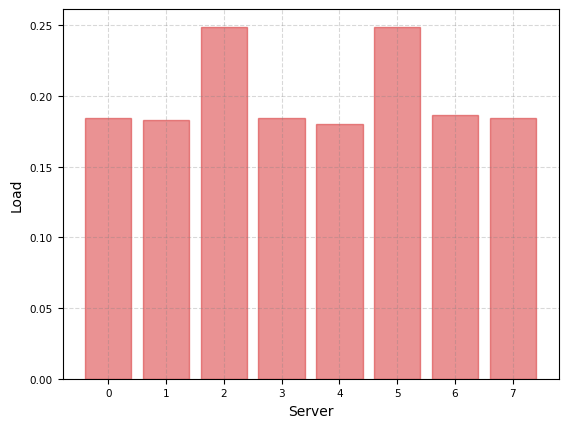

<Figure size 640x480 with 0 Axes>

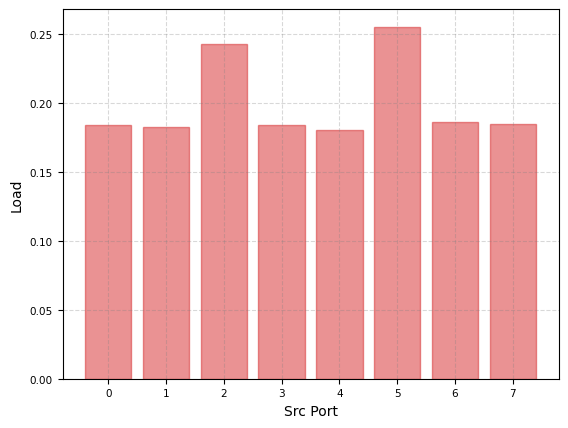

<Figure size 640x480 with 0 Axes>

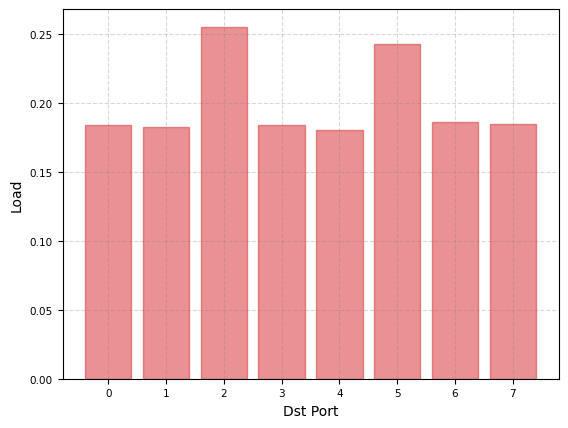



university | Network Load = 0.3
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(7854275.0)), mean=np.float64(22042.866), variance=np.float64(28399977556.88152), skewness=np.float64(29.00212729539957), kurtosis=np.float64(1139.2277235743672))


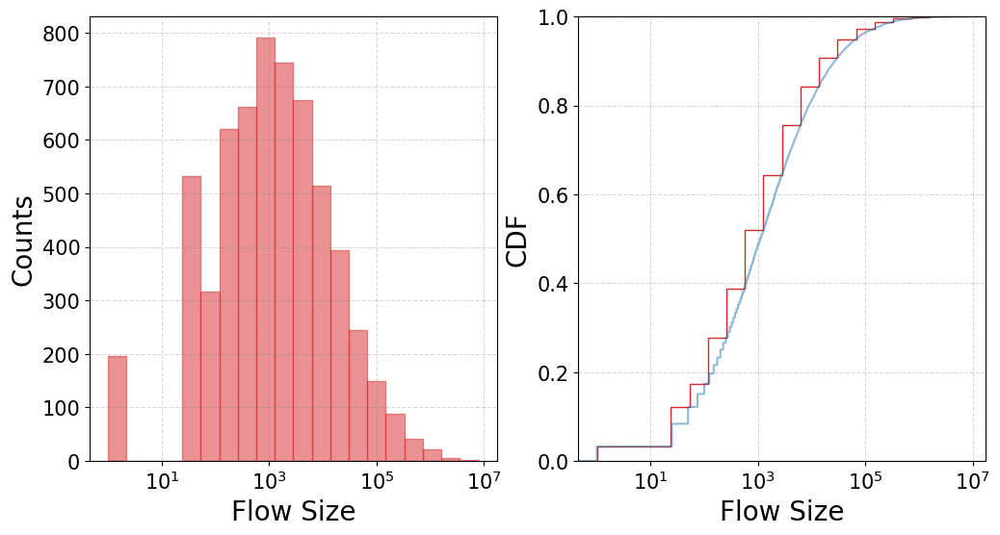

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(2.3712397201336444e-07), np.float64(0.01595844331463603)), mean=np.float64(0.001469769361560257), variance=np.float64(2.7067715108272897e-06), skewness=np.float64(2.4130990394156586), kurtosis=np.float64(8.8567709772355))


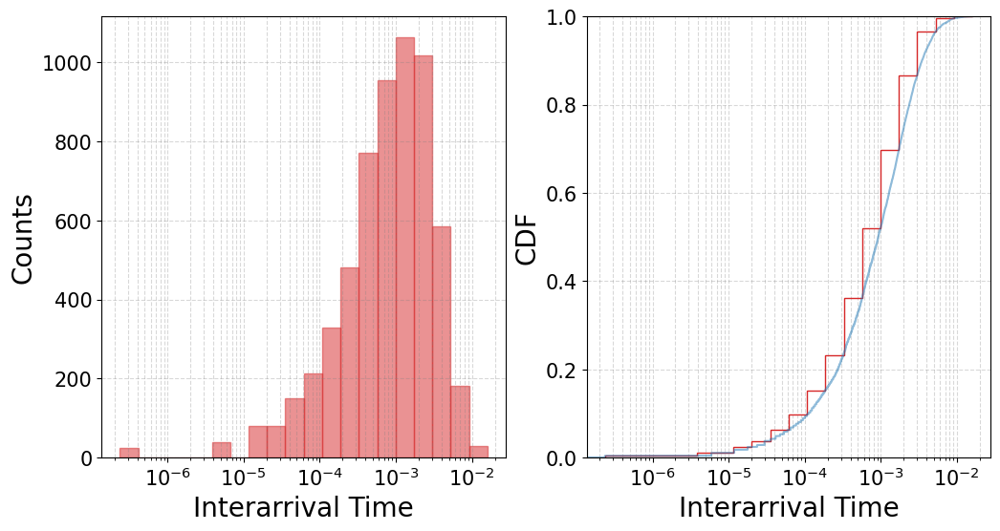

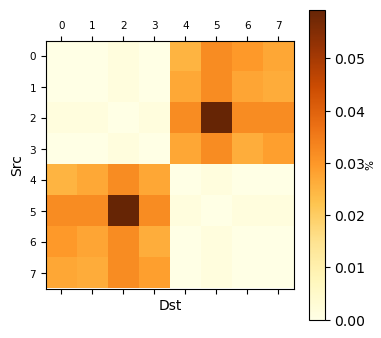

<Figure size 640x480 with 0 Axes>

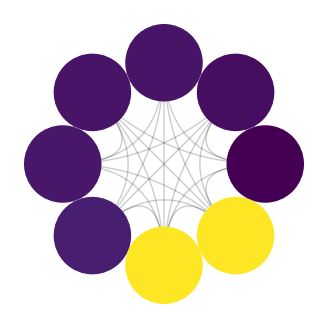

<Figure size 640x480 with 0 Axes>

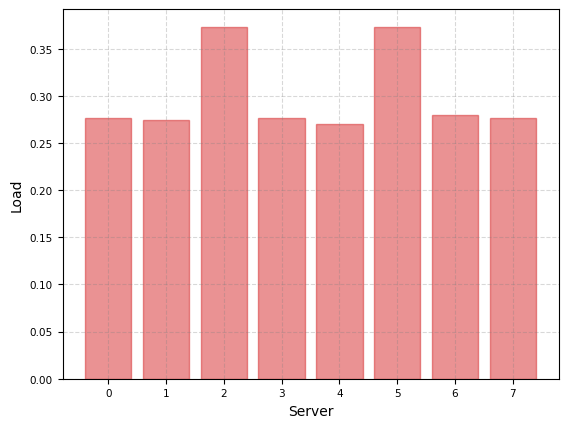

<Figure size 640x480 with 0 Axes>

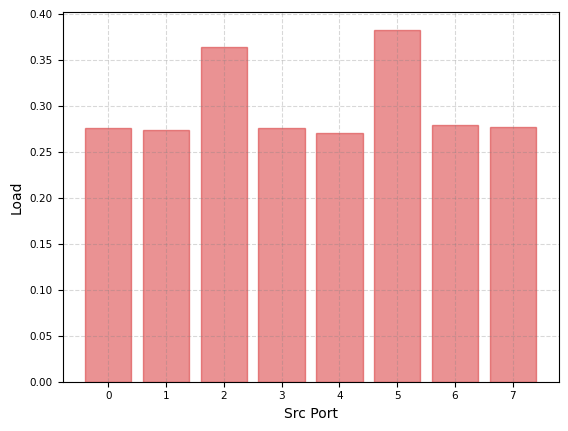

<Figure size 640x480 with 0 Axes>

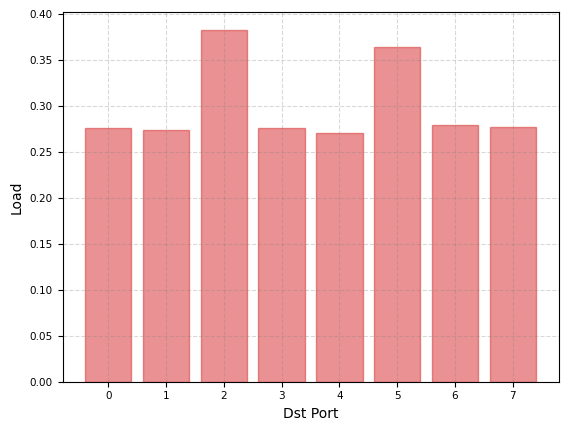



university | Network Load = 0.4
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(7854275.0)), mean=np.float64(22042.866), variance=np.float64(28399977556.88152), skewness=np.float64(29.00212729539957), kurtosis=np.float64(1139.2277235743672))


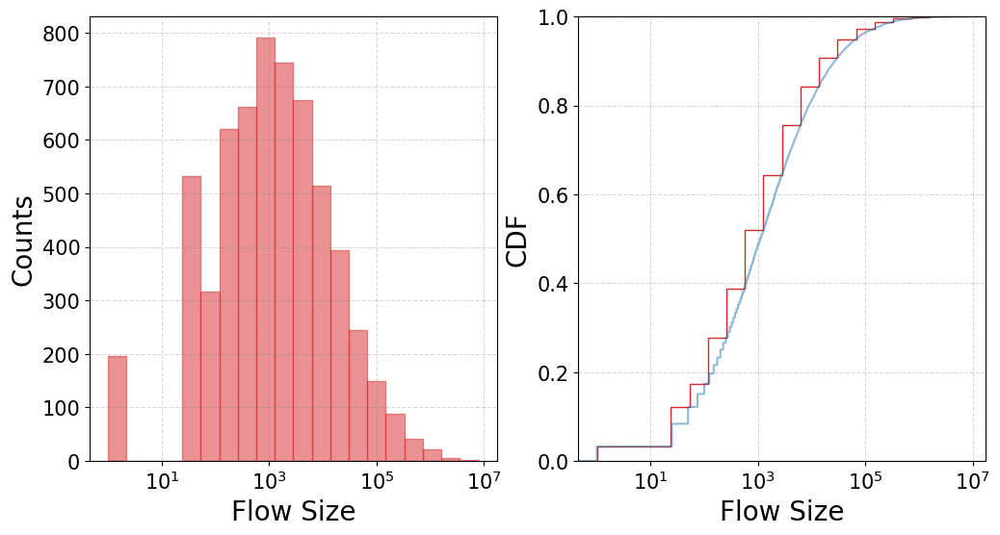

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.7784297856593412e-07), np.float64(0.011968832485977465)), mean=np.float64(0.0011023270211701927), variance=np.float64(1.522558974840355e-06), skewness=np.float64(2.413099039415663), kurtosis=np.float64(8.856770977235616))


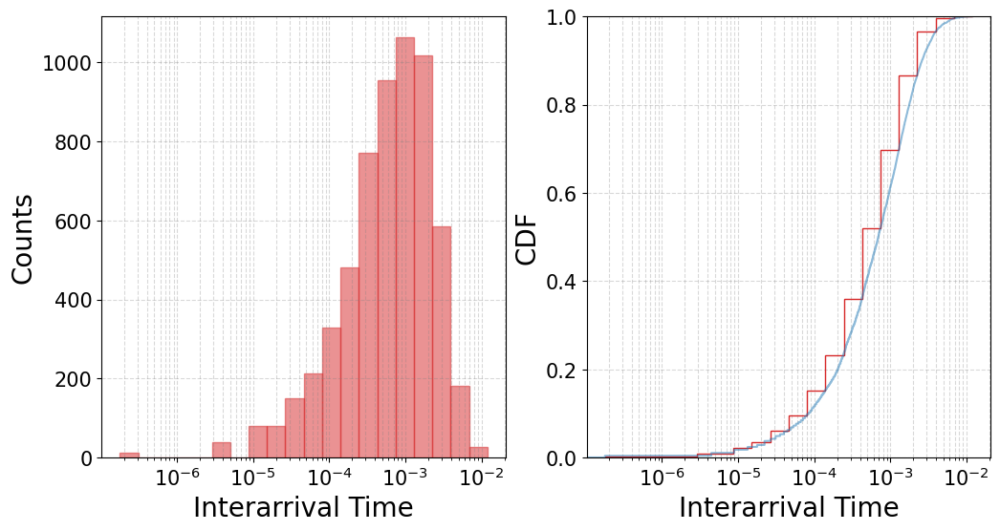

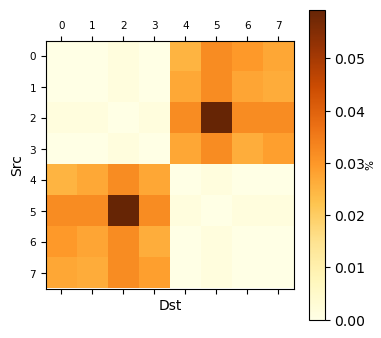

<Figure size 640x480 with 0 Axes>

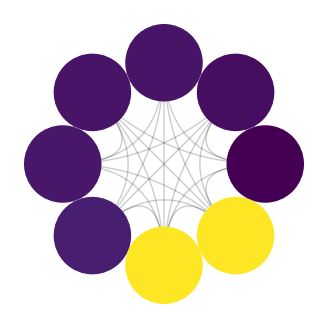

<Figure size 640x480 with 0 Axes>

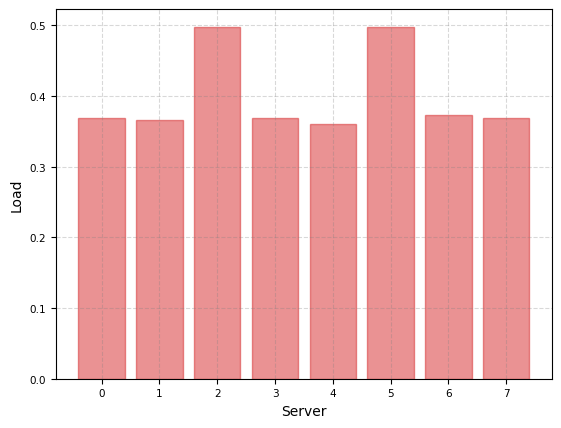

<Figure size 640x480 with 0 Axes>

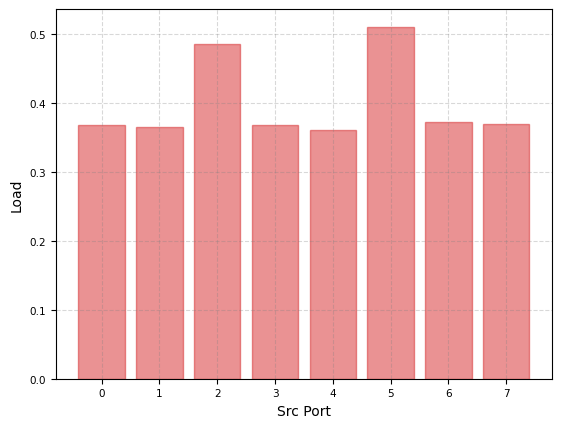

<Figure size 640x480 with 0 Axes>

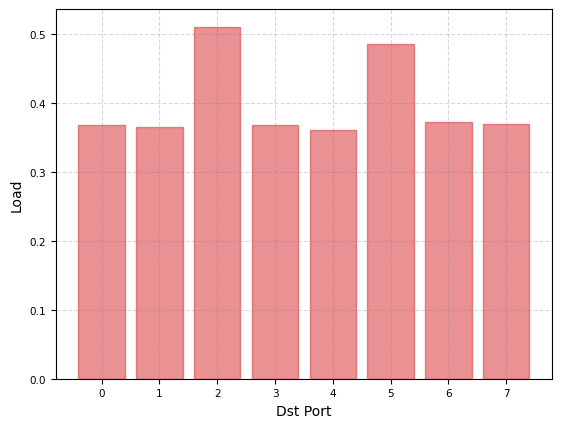



university | Network Load = 0.5
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(7854275.0)), mean=np.float64(22042.866), variance=np.float64(28399977556.88152), skewness=np.float64(29.00212729539957), kurtosis=np.float64(1139.2277235743672))


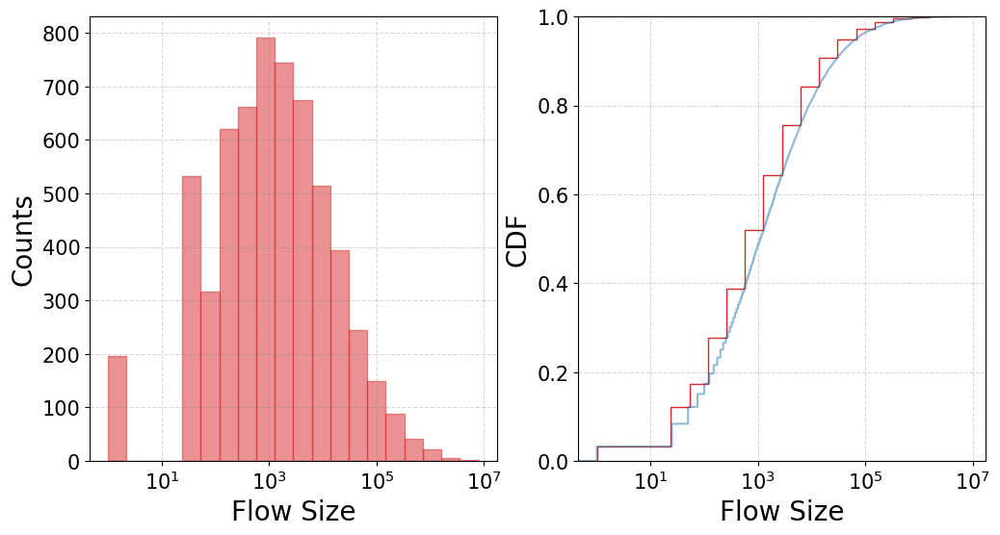

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.4227438316360974e-07), np.float64(0.00957506598878144)), mean=np.float64(0.0008818616169361576), variance=np.float64(9.744377438978273e-07), skewness=np.float64(2.413099039415665), kurtosis=np.float64(8.85677097723545))


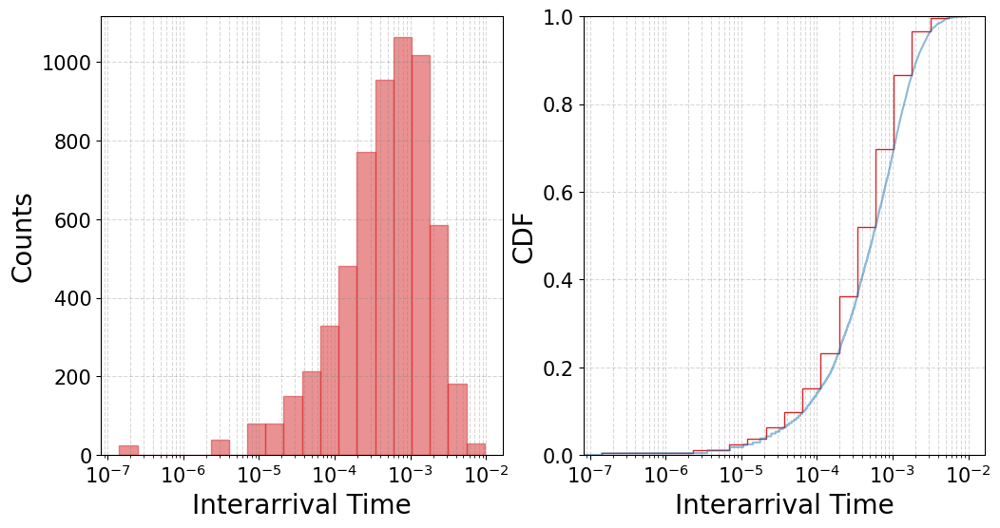

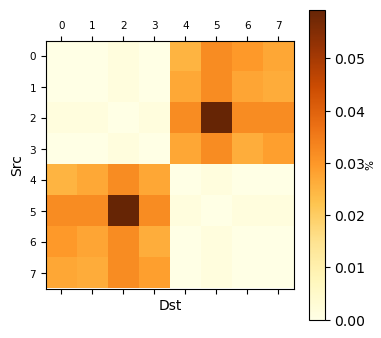

<Figure size 640x480 with 0 Axes>

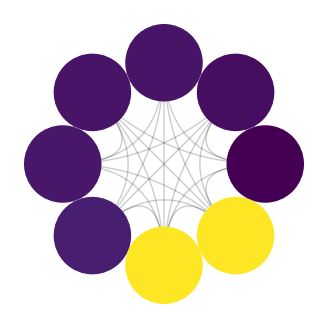

<Figure size 640x480 with 0 Axes>

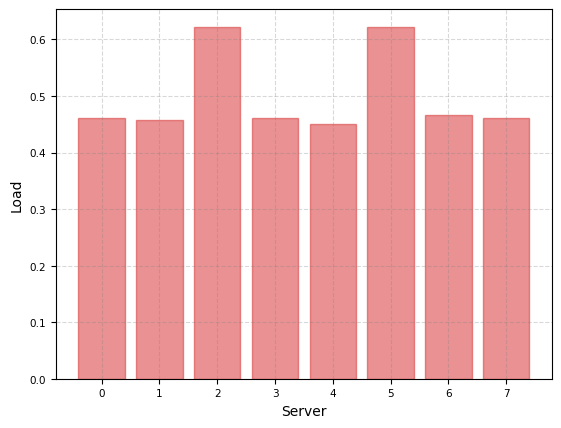

<Figure size 640x480 with 0 Axes>

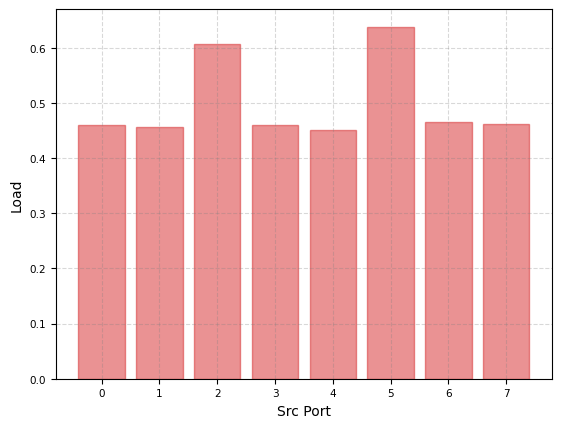

<Figure size 640x480 with 0 Axes>

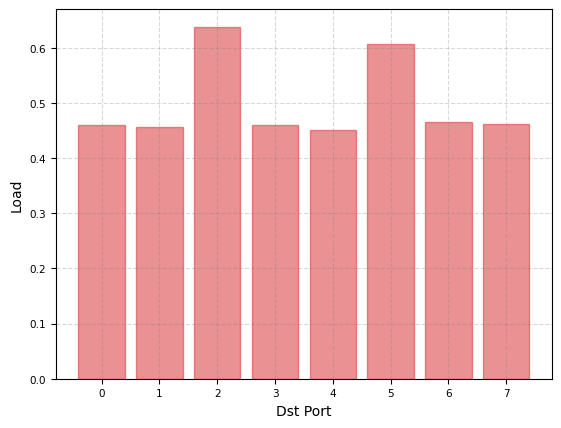



university | Network Load = 0.6
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(7854275.0)), mean=np.float64(22042.866), variance=np.float64(28399977556.88152), skewness=np.float64(29.00212729539957), kurtosis=np.float64(1139.2277235743672))


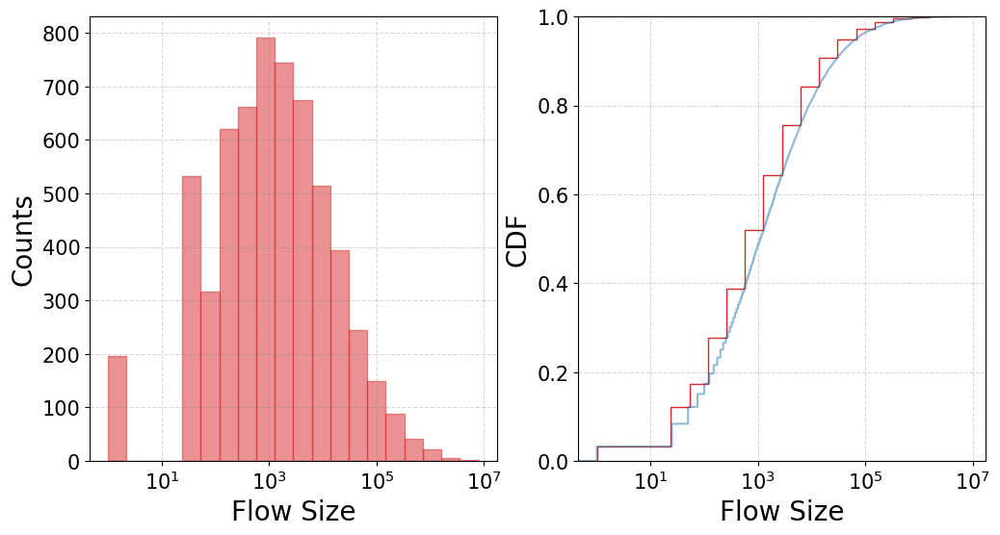

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.1856198600668222e-07), np.float64(0.007979221657318014)), mean=np.float64(0.0007348846807801286), variance=np.float64(6.766928777068224e-07), skewness=np.float64(2.4130990394156586), kurtosis=np.float64(8.8567709772355))


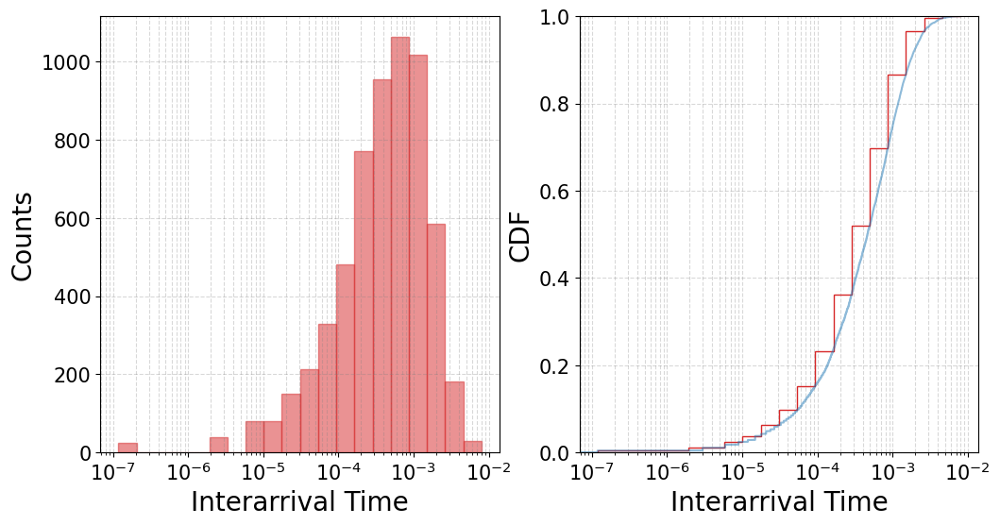

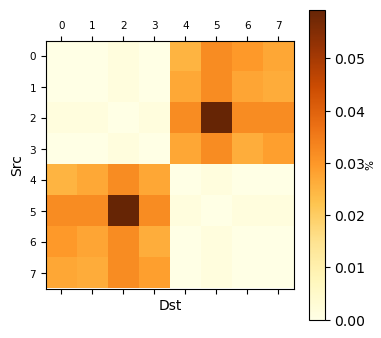

<Figure size 640x480 with 0 Axes>

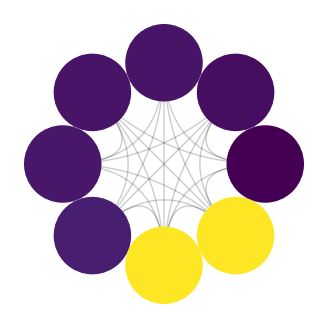

<Figure size 640x480 with 0 Axes>

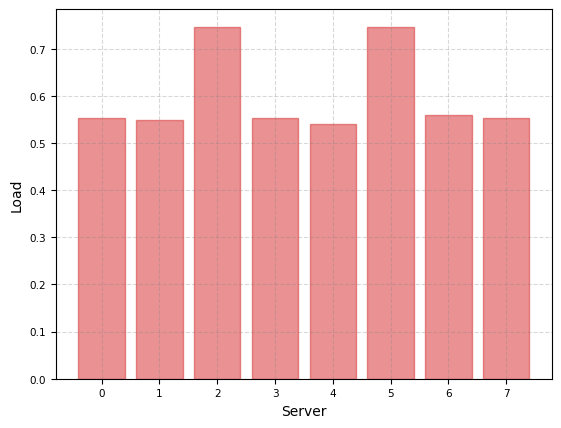

<Figure size 640x480 with 0 Axes>

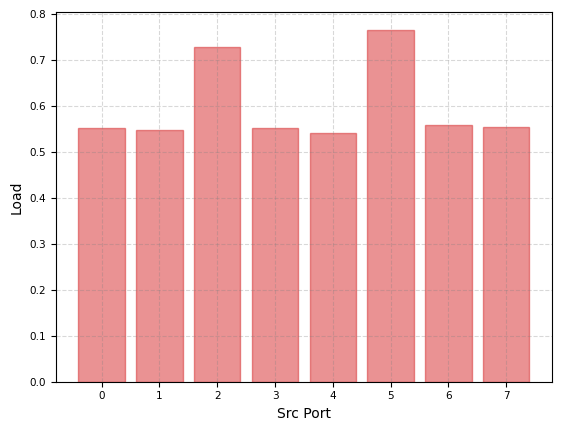

<Figure size 640x480 with 0 Axes>

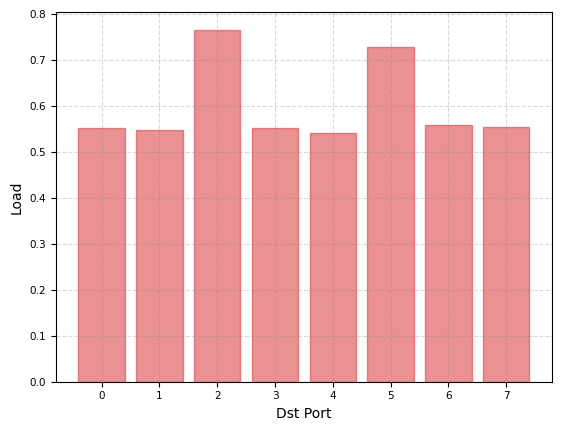



university | Network Load = 0.7
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(7854275.0)), mean=np.float64(22042.866), variance=np.float64(28399977556.88152), skewness=np.float64(29.00212729539957), kurtosis=np.float64(1139.2277235743672))


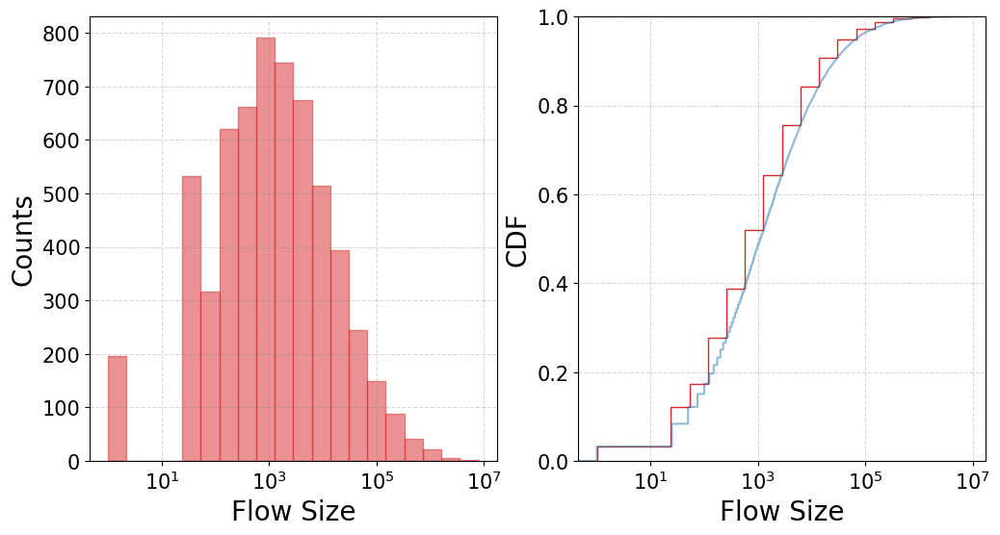

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(1.0162455943429904e-07), np.float64(0.006839332849129853)), mean=np.float64(0.0006299011549544016), variance=np.float64(4.971621142335783e-07), skewness=np.float64(2.41309903941568), kurtosis=np.float64(8.85677097723566))


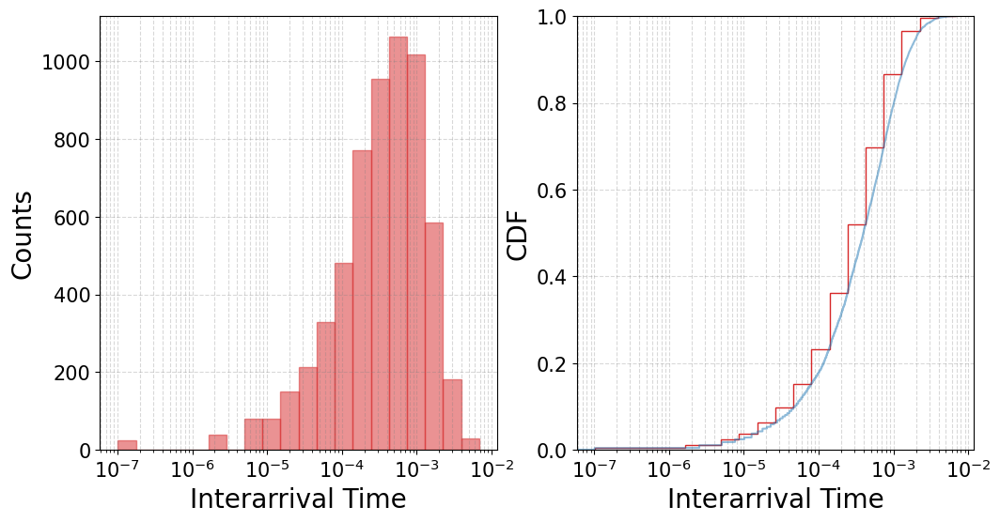

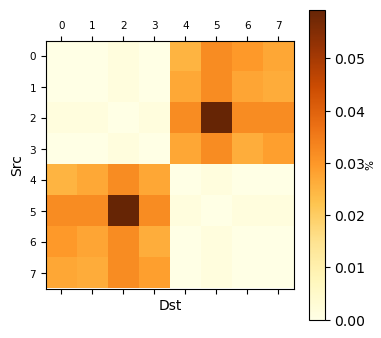

<Figure size 640x480 with 0 Axes>

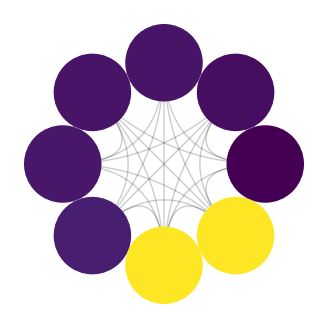

<Figure size 640x480 with 0 Axes>

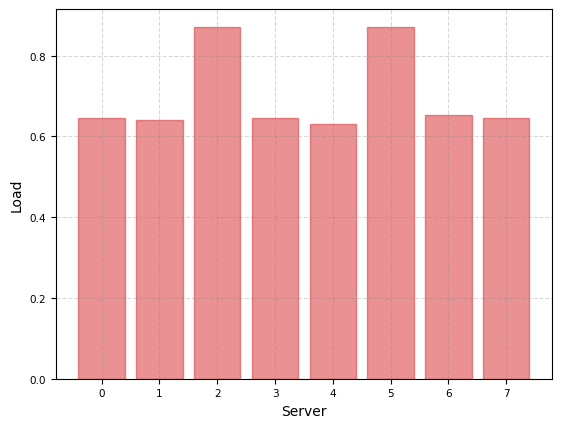

<Figure size 640x480 with 0 Axes>

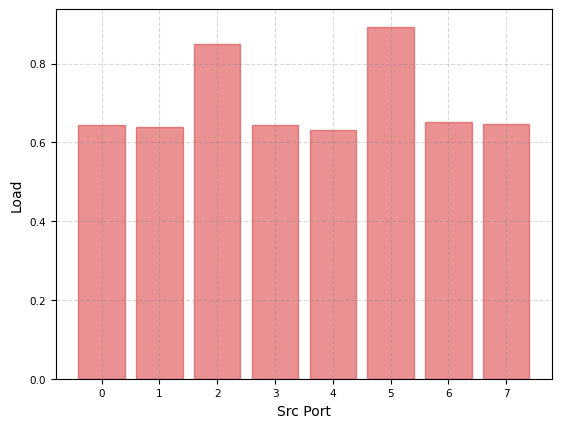

<Figure size 640x480 with 0 Axes>

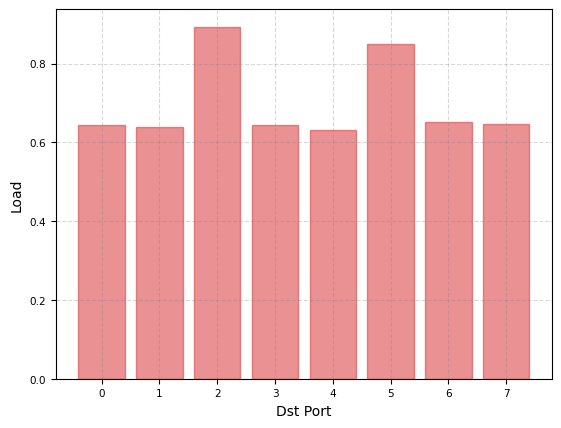



university | Network Load = 0.8
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(7854275.0)), mean=np.float64(22042.866), variance=np.float64(28399977556.88152), skewness=np.float64(29.00212729539957), kurtosis=np.float64(1139.2277235743672))


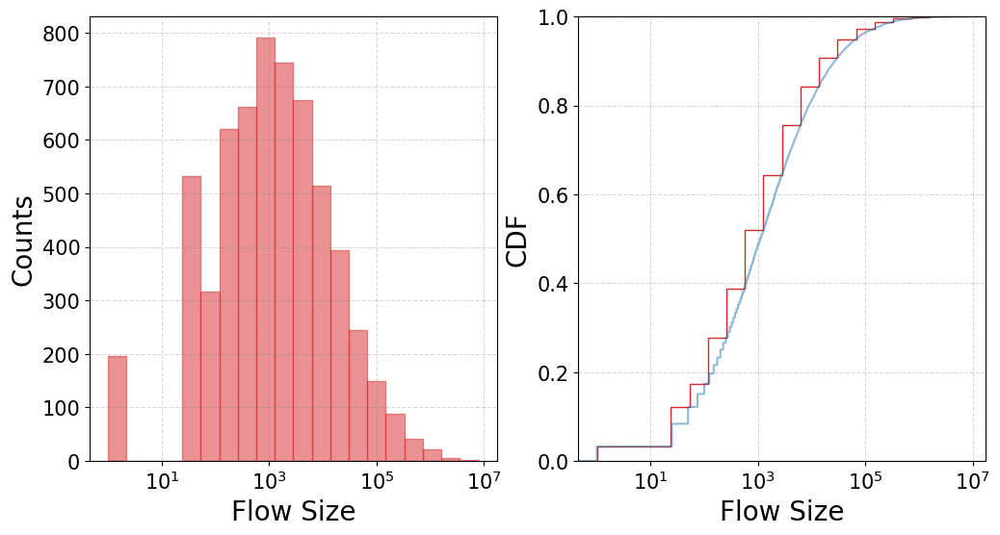

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(8.892148928296706e-08), np.float64(0.005984416242988733)), mean=np.float64(0.0005511635105850964), variance=np.float64(3.8063974371008876e-07), skewness=np.float64(2.413099039415663), kurtosis=np.float64(8.856770977235616))


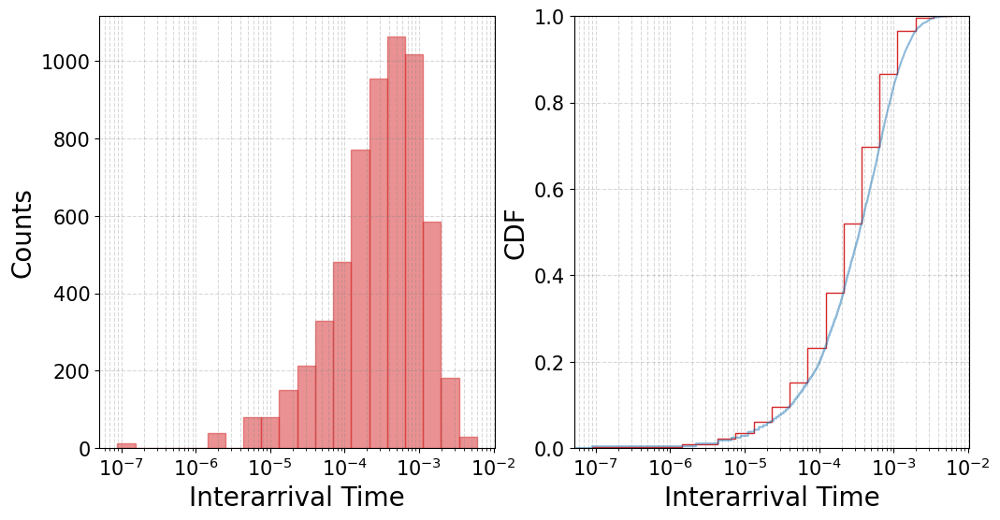

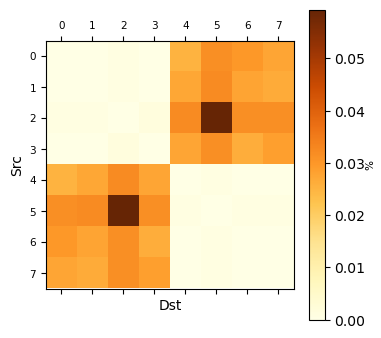

<Figure size 640x480 with 0 Axes>

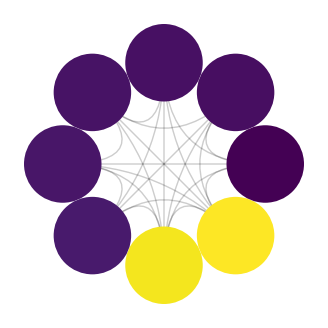

<Figure size 640x480 with 0 Axes>

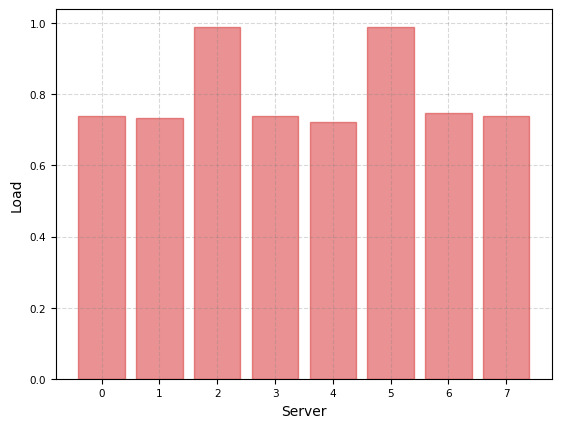

<Figure size 640x480 with 0 Axes>

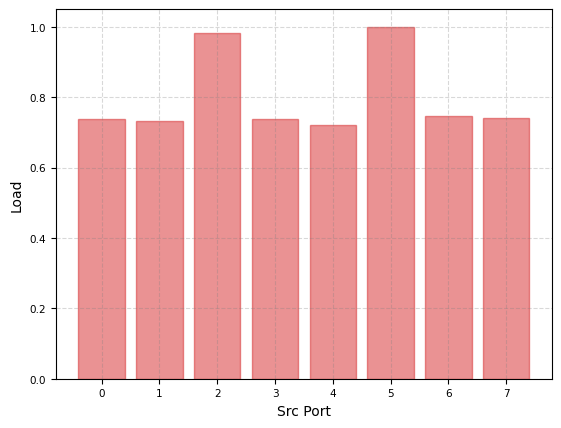

<Figure size 640x480 with 0 Axes>

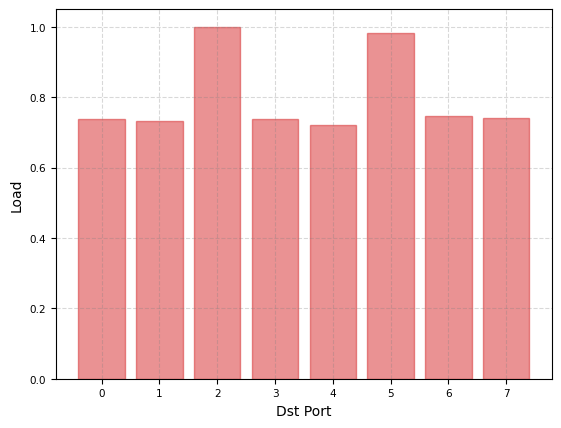



university | Network Load = 0.9
Characteristics of Flow Size distribution: DescribeResult(nobs=np.int64(6000), minmax=(np.float64(1.0), np.float64(7854275.0)), mean=np.float64(22042.866), variance=np.float64(28399977556.88152), skewness=np.float64(29.00212729539957), kurtosis=np.float64(1139.2277235743672))


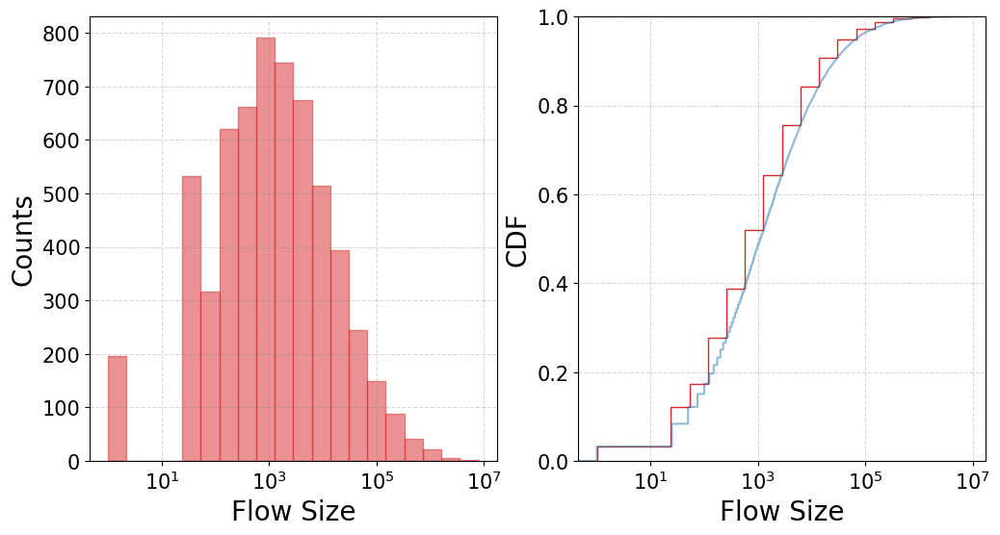

Characteristics of Interarrival Time distribution: DescribeResult(nobs=np.int64(5999), minmax=(np.float64(7.904132393043994e-08), np.float64(0.005319481104878676)), mean=np.float64(0.0004899231205200873), variance=np.float64(3.0075239009191957e-07), skewness=np.float64(2.413099039415646), kurtosis=np.float64(8.856770977235433))


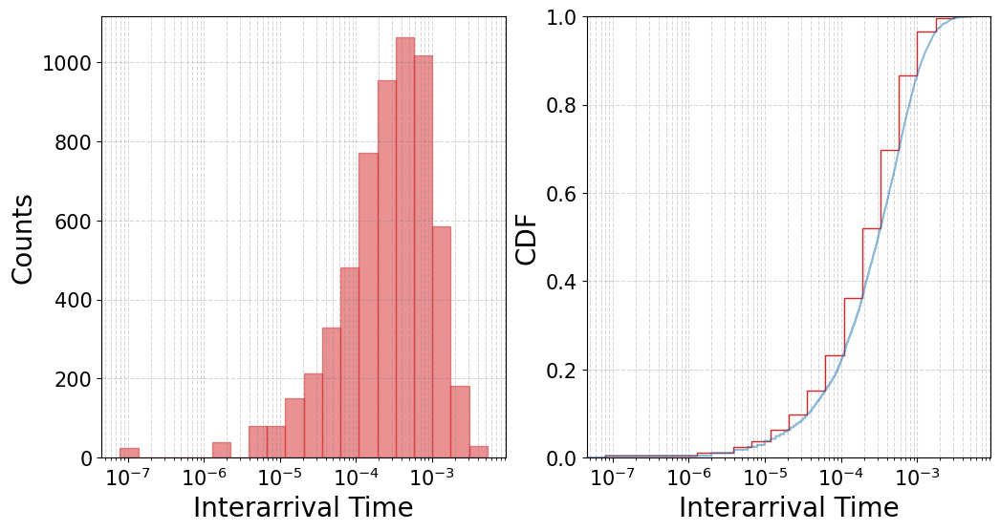

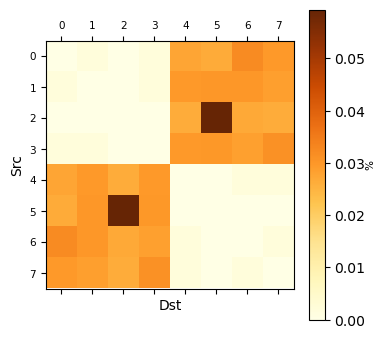

<Figure size 640x480 with 0 Axes>

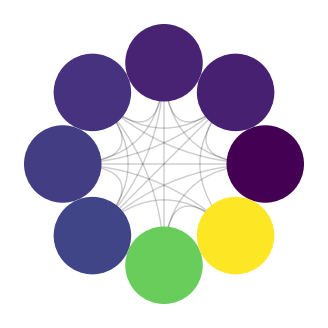

<Figure size 640x480 with 0 Axes>

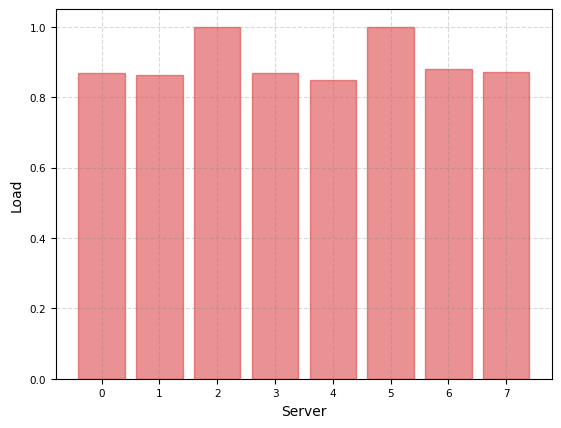

<Figure size 640x480 with 0 Axes>

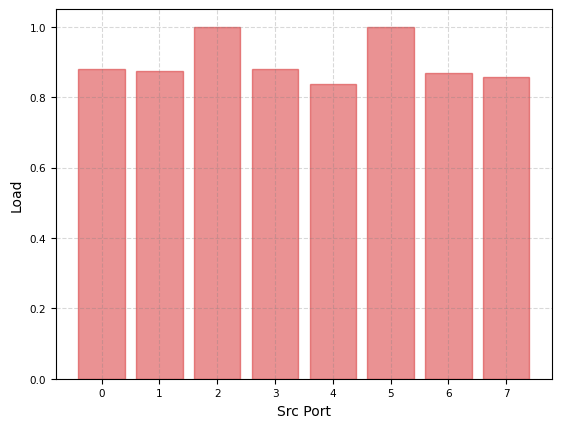

<Figure size 640x480 with 0 Axes>

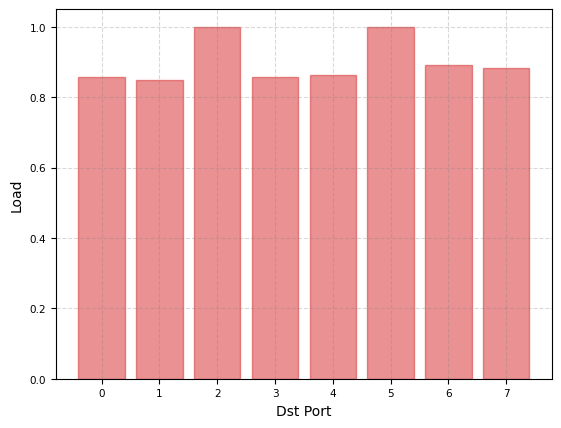

In [11]:
# ============================================================
# VISUALISE ALL GENERATED DISTRIBUTIONS
# ============================================================

for benchmark in benchmark_names:

    for load in loads:

        demand = demands[benchmark][load]

        print("\n")
        print("=" * 80)
        print(
            f"{benchmark} | "
            f"Network Load = {load}"
        )
        print("=" * 80)

        plotter = tpg.DemandPlotter(demand)

        plotter.plot_flow_size_dist(
            logscale=True,
            figsize=(12, 6)
        )

        plotter.plot_interarrival_time_dist(
            logscale=True,
            figsize=(12, 6)
        )

        plotter.plot_node_dist(
            eps=net.graph['endpoints'],
            chord_edge_width_range=[1, 25],
            chord_edge_display_threshold=0.005
        )

        plotter.plot_node_load_dists(
            eps=net.graph['endpoints'],
            ep_link_bandwidth=net.graph['ep_link_capacity'],
            plot_extras=False
        )